# Analysis 2.0 

## Import packages

In [75]:
print('test')

test


In [1]:
#general
import pandas as pd 
from cycler import cycler
import json
import numpy as np
import warnings
import pickle
from pprint import pprint
from datetime import date
import tqdm
from tqdm import tqdm
from itertools import cycle
from array import array

#for plotting
import matplotlib
from matplotlib import pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.patches as mpatches

#for OpenAlex
import pyalex
from pyalex import Works, Authors, Sources, Institutions, Concepts, Publishers, Funders
from itertools import chain

#for Gender Guesser
from urllib.request import urlopen
from genderize import Genderize
import gender_guesser.detector as gender
import pycountry
import re

#for Geopandas
import mapclassify
import geopandas as gpd
from shapely.geometry import Polygon, MultiPolygon
from geotext import GeoText

#for topic model
import nltk
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from nltk.stem import *
from nltk.stem.porter import *

import gensim
from gensim.corpora import Dictionary
from gensim.models import LdaModel
from gensim import corpora, models
from gensim.matutils import corpus2csc
from sklearn.feature_extraction.text import CountVectorizer
from gensim.models import CoherenceModel

from wordcloud import WordCloud
import scipy.interpolate.interpnd
import pyLDAvis
import pyLDAvis.gensim

In [2]:
#unwanted warnings
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

# Import data

In [78]:
%%time
with open('OpenAlex Data/Unify/12012024OriginalData.pkl', 'rb') as f:
    article_author_data_original = pickle.load(f)

CPU times: user 4.91 s, sys: 23.4 s, total: 28.4 s
Wall time: 1min 45s


In [79]:
%%time
with open('OpenAlex Data/Unify/12012024FinalData.pkl', 'rb') as f:
    article_author_data_final = pickle.load(f)

CPU times: user 4.64 s, sys: 23.6 s, total: 28.3 s
Wall time: 1min 44s


# Plotting

## Settings

In [615]:
#define colors

# Get the PuRd colormap
cmap = plt.get_cmap('PuRd')
num_colors = 10  # Number of colors
# Create a list of colors from the colormap
purd_colors = [cmap(i / num_colors) for i in range(num_colors)]


In [616]:
#plotting parameters
plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams["figure.figsize"] = [12, 6]
plt.rcParams["figure.autolayout"] = True
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=['tab:pink', 'tab:red', 'tab:purple', 'tab:blue', 'tab:cyan', 'tab:green', 'tab:olive', 'tab:orange', 'tab:brown', 'tab:gray']) 
plt.rcParams['axes.prop_cycle'] = cycler(color=purd_colors[3::])
plt.rcParams['font.sans-serif'] = "Arial"
plt.rcParams['font.family'] = "serif"


font = {'weight' : 'bold',
        'size'   : 22}

plt.rc('font', **font)


## Functions

In [617]:
def cat_plot(data, title=None, xlabel=None, ylabel='Frequency', norm=False, multiply=1, font=None, rot=0, xmargins=None, ymargins=None, save_name=None):
    """
    Create a categorical plot for a given DataFrame column.

    Parameters:
    - data (pd.Series): The input DataFrame column.
    - title (str): The title of the plot. Default is None.
    - xlabel (str): The label for the x-axis. Default is None.
    - ylabel(str): The label for the y-axis. Default is Frequency.
    - norm (bool): Whether to normalize data or not. Default is False.
    - multiply (int): Multiply data to achieve percentage. This should be 100 if norm=True. Default is 1.
    - rot (int): Rotation scale of x-tick-labels. Default is 0.
    - font (str): Font type. If Chinese letters, use: 'Heiti TC'. Default is None.
    - xmargins (int): The size of the x-margins. Default is None.
    - save_name (str): The name to use when saving the plot.

    Returns:
    - None
    """
    # count the number and/or percentage within each category
    value_counts = data.value_counts(normalize=norm).mul(multiply).reset_index()
    count_n = data.value_counts().reset_index()
    count_n = count_n.iloc[:, 1]
    count = value_counts.iloc[:, 1]
    cats = value_counts.iloc[:, 0]

    fig, ax = plt.subplots()
    bars = ax.bar(cats, count, width=0.8, alpha=0.6, edgecolor='white', label='Histogram of Data')

    # Add text on top of each bar if the number of bars is 5 or less
    if len(bars) <= 10:
        for i, bar in enumerate(bars):
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width() / 2, height, f'N={count_n.iloc[i]}', ha='center', va='bottom', color='black', fontsize=12)

    # Add text in the center of each bar if the bar percentage count is 2 percent or more and we have less than 10 categories
    for cat, c in zip(cats, count):
        if len(cats) <=10 and c >= 2:
            ax.text(cat, c / 2, f'{c:.1f}%', ha='center', va='center', color='white', fontsize=12)

    plt.xticks(cats, font=font, size=12, rotation=rot)
    plt.margins(x=xmargins, y=ymargins)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)

    save_name = save_name
    save_path = f'Plots/{date.today()}/{save_name}{data.name}'
    plt.savefig(save_path)

    plt.show()


In [618]:

def cat_plot_compare(data1, data2, title=None, xlabel=None, ylabel='Frequency', norm=False, multiply=1, font=None, rot=0, xmargins=None, ymargins=None, save_name=None, label1='Dataset 1', label2='Dataset 2'):
    """
    Create a categorical plot for given DataFrame columns for comparison.

    Parameters:
    - data1 (pd.Series): The first input DataFrame column.
    - data2 (pd.Series): The second input DataFrame column.
    - title (str): The title of the plot. Default is None.
    - xlabel (str): The label for the x-axis. Default is None.
    - ylabel(str): The label for the y-axis. Default is Frequency.
    - norm (bool): Whether to normalize data or not. Default is False.
    - multiply (int): Multiply data to achieve percentage. This should be 100 if norm=True. Default is 1.
    - rot (int): Rotation scale of x-tick-labels. Default is 0.
    - font (str): Font type. If Chinese letters then use: 'Heiti TC'. Default is None.
    - xmargins (int): The size of the x-margins. Default is None.
    - save_name (str): The name to use when saving the plot.
    - label1 (str): Label for Dataset 1. Default is 'Dataset 1'.
    - label2 (str): Label for Dataset 2. Default is 'Dataset 2'.

    Returns:
    - None
    """
    # Merge data1 and data2 to ensure all categories are represented
    merged_data = pd.merge(data1, data2, how='outer', left_index=True, right_index=True, suffixes=('_df1', '_df2'))

    #count N without turning into percentage in both dataframes 
    count_n1 = merged_data[data1.name + '_df1'].value_counts().reset_index()
    count_n2 = merged_data[data2.name + '_df2'].value_counts().reset_index()

    # get value counts with the parameter normalize in order to be able to get percentage of both dataframes
    value_counts1 = merged_data[data1.name + '_df1'].value_counts(normalize=norm).mul(multiply).reset_index()
    value_counts2 = merged_data[data2.name + '_df2'].value_counts(normalize=norm).mul(multiply).reset_index()

    # Sort the value counts by category
    all_categories = set(value_counts1[data1.name + '_df1']).union(set(value_counts2[data2.name + '_df2']))
    value_counts1 = value_counts1.set_index(data1.name + '_df1').reindex(all_categories, fill_value=0).reset_index()
    count_n1 = count_n1.set_index(data1.name + '_df1').reindex(all_categories, fill_value=0).reset_index()
    value_counts2 = value_counts2.set_index(data2.name + '_df2').reindex(all_categories, fill_value=0).reset_index()
    count_n2 = count_n2.set_index(data2.name + '_df2').reindex(all_categories, fill_value=0).reset_index()

    #select either count or category column 
    count_n1 = count_n1.iloc[:, 1]
    count1 = value_counts1.iloc[:, 1]
    cats1 = value_counts1.iloc[:, 0]

    count2 = value_counts2.iloc[:, 1]
    count_n2 = count_n2.iloc[:, 1]
    cats2 = value_counts2.iloc[:, 0]

    width = 0.4  # width of the bars

    # Get integer positions for each category
    cat_positions1 = range(len(cats1))
    cat_positions2 = [pos + width + 0.01 for pos in cat_positions1]

    #define colors
    # Get the PuRd colormap
    cmap = plt.get_cmap('PuRd')
    num_colors = 10  # Number of colors
    # Create a list of colors from the colormap
    purd_colors = [cmap(i / num_colors) for i in range(num_colors)]
    color1=purd_colors[5]
    color2=purd_colors[3]

    fig, ax = plt.subplots()
    bars1=ax.bar(cat_positions1, count1, width, alpha=0.6, color=color1, edgecolor='white', label=label1)
    bars2=ax.bar(cat_positions2, count2, width, alpha=0.6, color=color2, edgecolor='white', label=label2)

    # Add text on top of each bar if the number of bars is 10 or less for both datasets and count is more than zero 
    if len(bars1) <= 10:
        for i, bar in enumerate(bars1):
            height = bar.get_height()
            if count_n1.iloc[i] > 0:
                ax.text(bar.get_x() + bar.get_width() / 2, height, f'N={count_n1.iloc[i]}', ha='center', va='bottom', color='black', fontsize=12)

    if len(bars2) <= 10:
        for i, bar in enumerate(bars2):
            height = bar.get_height()
            if count_n2.iloc[i] > 0:
                ax.text(bar.get_x() + bar.get_width() / 2, height, f'N={count_n2.iloc[i]}', ha='center', va='bottom', color='black', fontsize=12)


    # Add text in the center of each bar if the bar percentage count is 2 percent or more and we have less than 10 categories for both datasets
    for cat, c1, c2, bar1, bar2 in zip(all_categories, count1, count2, bars1, bars2):
        if len(cat) <= 10 and c1 >= 2:
            percentbar1 = c1
            ax.text(bar1.get_x() + bar1.get_width() / 2, c1 / 2, f'{percentbar1:.1f}%', ha='center', va='center', color='white', fontsize=12)
        if len(cat) <= 10 and c2 >= 2:
            percentbar2 = c2
            ax.text(bar2.get_x() + bar2.get_width() / 2, c2 / 2, f'{percentbar2:.1f}%', ha='center', va='center', color='white', fontsize=12)

    plt.xticks([pos + width / 2 for pos in cat_positions1], cats1, font=font, size=10, rotation=rot)
    plt.margins(x=xmargins, y=ymargins)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()

    save_path = f'Plots/{date.today()}/{str(save_name)}'
    plt.savefig(save_path)

    plt.show()

    plt.show()

In [619]:
def cat_top_plot(data, top_n=10, title=None, xlabel=None, ylabel='Frequency', norm=False, multiply=1, font=None, rot=0, xmargins=None, ymargins=None, save_name=None):
    """
    Create a categorical plot for a given DataFrame column.

    Parameters:
    - data (pd.DataFrame): The input DataFrame column.
    - top_n (int): The number of top categories to display. Default is 10.
    - title (str): The title of the plot. Default is None.
    - xlabel (str): The label for the x-axis. Default is None.
    - ylabel(str): The label for the y-axis. Default is Frequncy.
    - norm(True/False): Whether to normalize data or not. Default is False.
    - multiply(int): Multiply data to achieve percentage. This should be 100 if norm=True. Default is 1.
    - rot(int): Rotation scale of x-tick-labels. Default is 0.
    - font(str): Font type. If Chinese letters, use: 'Heiti TC'. Default is None.
    - xmargins (int): The size of the x-margins. Default is None.

    Returns:
    - None
    """
    
    # count the number and/or percentage within each category and set the top categories
    top_n = top_n
    value_counts = data.value_counts(normalize=norm).mul(multiply).reset_index()[0:top_n]
    count_n = data.value_counts().reset_index()
    count_n = count_n.iloc[:, 1]
    count = value_counts.iloc[:, 1]
    cats = value_counts.iloc[:, 0]

    # Create plot
    fig, ax = plt.subplots()
    bars = ax.bar(cats, count, width=0.8, alpha=0.6, edgecolor='white', label='Histogram of Data')

    # Add text on top of each bar if the number of bars is 5 or less
    if len(bars) <= 10:
        for i, bar in enumerate(bars):
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width() / 2, height, f'N={count_n.iloc[i]}', ha='center', va='bottom', color='black', fontsize=12)

    # Add text in the center of each bar if the bar percentage count is 2 percent or more
    for cat, c in zip(cats, count):
        if len(cat) <=10 and c >= 2:
            ax.text(cat, c / 2, f'{c:.1f}%', ha='center', va='center', color='white', fontsize=12)

    plt.xticks(cats, font=font, size=10, rotation=rot)
    plt.margins(x=xmargins, y=ymargins)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)

    save_name = save_name
    save_path = f'Plots/{date.today()}/{save_name}{data.name}'
    plt.savefig(save_path)

    plt.show()


In [620]:
short_names = [] #don't know if this will cause any issue

def cat_top_plot_short_names(data, top_n=10, title=None, xlabel=None, ylabel='Frequency', norm=False, multiply=1, font=None, rot=0, xmargins=None, save_name=None, legend_labels=None, short_names=short_names):
    """
    Create a categorical plot for a given DataFrame column.

    Parameters:
    - data (pd.DataFrame): The input DataFrame column.
    - top_n (int): The number of top categories to display. Default is 10.
    - title (str): The title of the plot. Default is None.
    - xlabel (str): The label for the x-axis. Default is None.
    - ylabel(str): The label for the y-axis. Default is Frequncy.
    - norm(True/False): Whether to normalize data or not. Default is False.
    - multiply(int): Multiply data to achieve percentage. This should be 100 if norm=True. Default is 1.
    - rot(int): Rotation scale of x-tick-labels. Default is 0.
    - font(str): Font type. If Chinese letters, use: 'Heiti TC'. Default is None.
    - xmargins (int): The size of the x-margins. Default is None.

    Returns:
    - None
    """
    
    # count the number and/or percentage within each category and set the top categories
    top_n = top_n
    value_counts = data.value_counts(normalize=norm).mul(multiply).reset_index()[0:top_n]
    count_n = data.value_counts().reset_index()
    count_n = count_n.iloc[:, 1]
    count = value_counts.iloc[:, 1]
    cats = value_counts.iloc[:, 0]

    # Create short versions of journal names for x-ticks
    short_names = short_names

    #create legend labels
    if legend_labels is None:
        legend_labels = [f'{short_names[i]}: {cats[i]}' for i in range(len(cats))]

    #create colors 
    num_colors = len(short_names)+3
    cmap = plt.get_cmap('PuRd')
    purd_colors = [cmap(i / num_colors) for i in range(num_colors)]

    # Create plot
    fig, ax = plt.subplots()
    bars = ax.bar(short_names, count, width=0.8, alpha=0.6, edgecolor='white',color=purd_colors[3::], label=legend_labels)

    # Add text on top of each bar if the number of bars is 5 or less
    if len(bars) <= 5:
        for i, bar in enumerate(bars):
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width() / 2, height, f'N={count_n.iloc[i]}', ha='center', va='bottom', color='black', fontsize=12)

    # Add text in the center of each bar if the bar percentage count is 2 percent or more and we have less than 10 categories
    for cat, short_name, c in zip(cats, short_names, count):
        if top_n <= 10 and c >= 2:
            ax.text(short_name, c / 2, f'{c:.1f}%', ha='center', va='center', color='white', fontsize=12)

    plt.xticks(short_names, font=font, size=10, rotation=rot)
    plt.margins(x=xmargins)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend(title=None, fontsize=8, loc="upper right")

    save_name = save_name
    save_path = f'Plots/{date.today()}/{save_name}{data.name}'
    plt.savefig(save_path)

    plt.show()


In [910]:
short_names = [] #don't know if this will cause any issue

def cat_value_top_plot_short_names(data, top_n=10, title=None, xlabel=None, ylabel='Frequency', norm=False, multiply=1, font=None, rot=0, xmargins=None, save_name=None, legend_labels=None, short_names=short_names):
    """
    Create a categorical plot for a given DataFrame column.

    Parameters:
    - data (pd.DataFrame): The input DataFrame column.
    - top_n (int): The number of top categories to display. Default is 10.
    - title (str): The title of the plot. Default is None.
    - xlabel (str): The label for the x-axis. Default is None.
    - ylabel(str): The label for the y-axis. Default is Frequncy.
    - norm(True/False): Whether to normalize data or not. Default is False.
    - multiply(int): Multiply data to achieve percentage. This should be 100 if norm=True. Default is 1.
    - rot(int): Rotation scale of x-tick-labels. Default is 0.
    - font(str): Font type. If Chinese letters, use: 'Heiti TC'. Default is None.
    - xmargins (int): The size of the x-margins. Default is None.

    Returns:
    - None
    """
    
    # count the number and/or percentage within each category and set the top categories
    top_n = top_n
    #sort values to be the top 
    data=data.sort_values(by='JIF', ascending=False)
    #value_counts = data.value_counts(normalize=norm).mul(multiply).reset_index()[0:top_n]
    #count_n = data.value_counts().reset_index()
    #count_n = count_n.iloc[:, 1]
    #count = value_counts.iloc[:, 1]
    cats = data.iloc[:, 0][0:top_n]
    count= data.iloc[:, 1][0:top_n]

    # Create short versions of journal names for x-ticks
    short_names = short_names

    #create legend labels
    if legend_labels is None:
        legend_labels = [f'{short_names[i]}: {cats[i]}' for i in range(len(cats))]

    #create colors 
    num_colors = len(short_names)+3
    cmap = plt.get_cmap('PuRd')
    purd_colors = [cmap(i / num_colors) for i in range(num_colors)]

    # Create plot
    fig, ax = plt.subplots()
    bars = ax.bar(short_names, count, width=0.8, alpha=0.6, edgecolor='white',color=purd_colors[3::], label=legend_labels)

    # Add text on top of each bar if the number of bars is 5 or less
    if len(bars) <= 5:
        for i, bar in enumerate(bars):
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width() / 2, height, f'N={count_n.iloc[i]}', ha='center', va='bottom', color='black', fontsize=12)

    # Add text in the center of each bar if the bar percentage count is 2 percent or more and we have less than 10 categories
    for cat, short_name, c in zip(cats, short_names, count):
        if top_n <= 10 and c >= 2:
            ax.text(short_name, c / 2, f'{c:.1f}', ha='center', va='center', color='white', fontsize=12)

    plt.xticks(short_names, font=font, size=10, rotation=rot)
    plt.margins(x=xmargins)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend(title=None, fontsize=8, loc="upper right")

    save_name = save_name
    save_path = f'Plots/{date.today()}/{save_name}'
    plt.savefig(save_path)

    plt.show()


In [622]:
def Sturges_bins(data):
    
    """
    INPUT:
    data = 1d array of all data
    
    OUTPUT:
    k = number of bins to use
    """
    
    # Number of data
    N = len(data)
    
    # Number of bins
    k = int( np.ceil( np.log2(N) ) + 1 )
    
    return k

In [623]:
import numpy as np
import matplotlib.pyplot as plt
from datetime import date


def hist_plot(data, N_bins=None, log=False, title=None, xlabel=None, ylabel='Frequency', xmargins=None, save_name=None, legend_labels=None, disp_legend=True):
    """
    Create a histogram for given DataFrame columns.

    Parameters:
    - data (List[pd.Series]): List of input DataFrame columns.
    - log (True/False): Plot on log scale. Default is False.
    - title (str): The title of the plot. Default is None.
    - xlabel (str): The label for the x-axis. Default is None.
    - ylabel (str): The label for the y-axis. Default is 'Frequency'.
    - xmargins (int): The size of the x-margins. Default is None.
    - save_name (str): The name to use when saving the plot.
    - legend_labels (List[str]): List of legend labels for each dataset. Default is None.
    
    Returns:
    - None
    """

    fig, ax = plt.subplots()

    if len(data) == 2:
        colors = [purd_colors[7], purd_colors[3]]
    else:
        colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

    if legend_labels is None:
        legend_labels = [f'Data {i + 1}' for i in range(len(data))]

    for i, (column_data, legend_label, color) in enumerate(zip(data, legend_labels, colors)):
        # Extract values from histogram and outline data
        if N_bins is None:
            N_bins = Sturges_bins(data[0])
        counts, bin_edges, _ = ax.hist(column_data, bins=N_bins, log=log, alpha=0.6, color=color, edgecolor='white', label=legend_label)
        bin_centers = (bin_edges[1:] + bin_edges[:-1]) / 2
        binwidth = bin_edges[1] - bin_edges[0]

        # Poisson errors on the count in each bin
        s_counts = np.sqrt(counts)

        # We remove any bins, which don't have any counts in them:
        x = bin_centers[counts > 0]
        y = counts[counts > 0]
        sy = s_counts[counts > 0]

        # Plot data with error
        ax.errorbar(x, y, yerr=sy, fmt='.', color='k', ecolor='k', elinewidth=1, capsize=1, capthick=1)

    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.margins(x=xmargins)

    if disp_legend is True:
        ax.legend()

    save_path = f'Plots/{date.today()}/{save_name}'
    plt.savefig(save_path)

    plt.show()


In [624]:

def stacked_bar_plot_normalized(dataframe, x_col, y_cols, title=None, xlabel=None, ylabel=None, xmargins=None, ymargins=None, save_name=None):
    """
    Generate a stacked bar plot for normalized gender distribution over years.

    Parameters:
    - dataframe: DataFrame containing the data.
    - year_col: Column name for the years.
    - gender_cols: List of column names representing different gender categories.
    - title: Title of the plot. Default is None.
    - xlabel: Label for the x-axis. Default is None.
    - ylabel: Label for the y-axis. Default is None.
    """

    # Calculate the total count per year
    total_counts = dataframe[y_cols].sum(axis=1)

    # Normalize the data to percentages
    normalized_df = dataframe.copy()
    for y_col in y_cols:
        normalized_df[y_col] = (normalized_df[y_col] / total_counts) * 100

    # Initialize the bottom values for stacking
    bottom_values = [0] * len(normalized_df)
    # initialize the height values for stacking
    height_values = []

    # create colors
    num_colors = 20
    cmap = plt.get_cmap('tab20b')
    colors = [cmap(i / num_colors) for i in range(num_colors)]
    reversed_colors = list(reversed(colors))
    selected_colors = [reversed_colors[i] for i in [0, 2, 4, 5, 7]]

    fig, ax = plt.subplots()
    for i, y_col in enumerate(y_cols):
        color = selected_colors[i]
        bars = ax.bar(normalized_df[x_col], normalized_df[y_col], bottom=bottom_values, edgecolor='white', color=color, alpha=0.7, label=y_col)
        bottom_values = [bottom + value for bottom, value in zip(bottom_values, normalized_df[y_col])]
        height_values.extend([bottom for bottom in bottom_values])

    # Add text on top of each bar if the number of bars is 5 or less
    if len(bars) <= 5:
        for i, bar in enumerate(bars):
            height = 100
            ax.text(bar.get_x() + bar.get_width() / 2, 100, f'N={total_counts.iloc[i]}', ha='center', va='bottom', color='black', fontsize=12)

    # Create an iterator from the height list
    height_iterator = cycle(height_values)

    # Iterate through the columns (categories) of normalized_df[y_col]
    for i, y_col in enumerate(y_cols):
        for j, bars in enumerate(ax.patches[i::len(y_cols)]):
            val = normalized_df[y_col].iloc[j]
            # Manually set x position
            x_position = np.sort([bars.get_x() for bars in ax.patches[i::len(y_cols)]])
            x_position = [x_position[i] for i in range(len(x_position))]
            custom_x = x_position[j]

            # Add text for each category at the appropriate height if val >= 5
            if val >= 5 and len(x_position) <=5:
                # Use the next value from the iterator as the current_height
                current_height = next(height_iterator)
                ax.text(custom_x + bars.get_width() / 2, current_height-1, f'{val:.1f}%', ha='center', va='top', color='white', fontsize=10)
            else:
                # Skip updating the iterator if the condition is not met
                next(height_iterator)

    # Adding labels and title
    if xlabel:
        plt.xlabel(xlabel)
    if ylabel:
        plt.ylabel(ylabel)
    if title:
        plt.title(title)
    plt.margins(x=xmargins, y=ymargins)
    plt.legend(fontsize=12)

    save_name = save_name
    save_path = f'Plots/{date.today()}/{[name for name, obj in globals().items() if obj is dataframe][0]}{save_name}'
    plt.savefig(save_path)

    # Display the plot
    plt.show()


In [625]:
def stacked_bar_plot_normalized_compare(dataframes, x_col, y_cols, title=None, xlabel=None, ylabel=None, xmargins=None, ymargins=None, save_name=None, labels=None):
    """
    Generate a stacked bar plot for normalized gender distribution over years.

    Parameters:
    - dataframes: List of DataFrames containing the data.
    - x_col: Column name for the years.
    - y_cols: List of column names representing different gender categories.
    - title: Title of the plot. Default is None.
    - xlabel: Label for the x-axis. Default is None.
    - ylabel: Label for the y-axis. Default is None.
    - xmargins: The size of the x-margins. Default is None.
    - ymargins: The size of the y-margins. Default is None.
    - save_name: The name to use when saving the plot.
    - labels: List of labels for each DataFrame in dataframes.

    Returns:
    - None
    """
    # Find the common set of publication years across all dataframes
    common_years = set(dataframes[0][x_col])
    for df in dataframes[1:]:
        common_years.intersection_update(df[x_col])

    # Filter each dataframe to include only the common years
    dataframes_filtered = [df[df[x_col].isin(common_years)] for df in dataframes]

    fig, ax = plt.subplots()

    # Create colors
    num_colors = 20
    cmap = plt.get_cmap('tab20b')
    colors = [cmap(i / num_colors) for i in range(num_colors)]
    reversed_colors = list(reversed(colors))
    selected_colors = [reversed_colors[i] for i in [0, 2, 4, 5, 7]]

    for i, df in enumerate(dataframes_filtered):
        # Normalize the data to percentages
        normalized_df = df.copy()
        total_col_name = 'total'
    
        # Calculate total within the function for the given y_cols
        normalized_df[total_col_name] = normalized_df[y_cols].sum(axis=1)

        
        for y_col in y_cols:
            normalized_df[y_col] = (normalized_df[y_col] / normalized_df['total']) * 100

        # Create an iterator for colors
        color_iterator = cycle(selected_colors)
        
        # Initialize the bottom values for stacking within the same DataFrame
        bottom_values = [0] * len(normalized_df)

        for j, y_col in enumerate(y_cols):
            color = next(color_iterator)
            x_values = np.arange(len(common_years)) + i * 0.2
            bars = ax.bar(x_values, normalized_df[y_col], bottom=bottom_values, edgecolor='white', color=color, alpha=0.7, width=0.4, label=f'{labels[i]} - {y_col}')
            
            # Update bottom values for stacking within the same DataFrame
            bottom_values = [bottom + value for bottom, value in zip(bottom_values, normalized_df[y_col])]

    # Adding labels and title
    if xlabel:
        plt.xlabel(xlabel)
    if ylabel:
        plt.ylabel(ylabel)
    if title:
        plt.title(title)
    plt.margins(x=xmargins, y=ymargins)
    plt.legend(fontsize=12)

    if save_name:
        save_path = f'Plots/{date.today()}/{save_name}'
        plt.savefig(save_path)

    # Display the plot
    plt.show()


In [626]:
def plt_plot(x, y, title=None, xlabel=None, ylabel=None, label=None, font='font', xmargins=None, new_figure=True):
    """
    Create a plot between two variables for two given lists of numbers.

    Parameters:
    - x (list): The input x data.
    - y (list): The input y data.
    - title (str): The title of the plot. Default is None.
    - xlabel (str): The label for the x-axis. Default is None.
    - ylabel(str): The label for the y-axis. Default is Frequncy.
    - font(str): font type. If Chinese letters then use: 'Heiti TC'. Default is 'font'.
    - xmargins (float): The margins for the x-axis. Default is None.
    - new_figure (bool): Whether to create a new figure or plot in the same figure. Default is True.

    Returns:
    - None
    """
    if new_figure:
        fig, ax = plt.subplots()
    else:
        fig, ax = plt.gcf(), plt.gca()

    ax.plot(x, y, label=label)
    plt.margins(x=xmargins)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()

    save_path = f'Plots/{date.today()}/{[name for name, obj in globals().items() if obj is x][0]}{[name for name, obj in globals().items() if obj is y][0]}'
    plt.savefig(save_path)

    plt.show()


# Analysis

In [91]:
#total length
len(article_author_data_original)

2000281

In [92]:
len(article_author_data_final)

1471771

In [93]:
#distinct articles length
len(article_author_data_original.drop_duplicates(subset=['article_id'], keep='first'))

518351

In [94]:
len(article_author_data_final.drop_duplicates(subset=['article_id'], keep='first'))

469812

In [95]:
#distinct authors length
len(article_author_data_original.drop_duplicates(subset=['author.id'], keep='first'))

810843

In [96]:
len(article_author_data_final.drop_duplicates(subset=['author_id'], keep='first'))

676613

In [97]:
#create new column with only binary gender so female/male 
article_author_data_final['binary_gender']=article_author_data_final['predicted_gender']

In [98]:
article_author_data_final['binary_gender'].value_counts()

binary_gender
male             823026
female           177167
mostly_male       46753
mostly_female     27348
unknown            2887
Name: count, dtype: int64

In [99]:
article_author_data_final['binary_gender']=article_author_data_final['binary_gender'].replace({'mostly_male': 'male'})
article_author_data_final['binary_gender']=article_author_data_final['binary_gender'].replace({'mostly_female': 'female'})


In [100]:
article_author_data_final['binary_gender'].value_counts()

binary_gender
male       869779
female     204515
unknown      2887
Name: count, dtype: int64

## Original data

In [101]:
save_name='article_author_data_original'

In [102]:
article_author_data_original['author_country'] = article_author_data_original['author_countries'].apply(lambda x: x[0] if len(x[0])==2 else x)


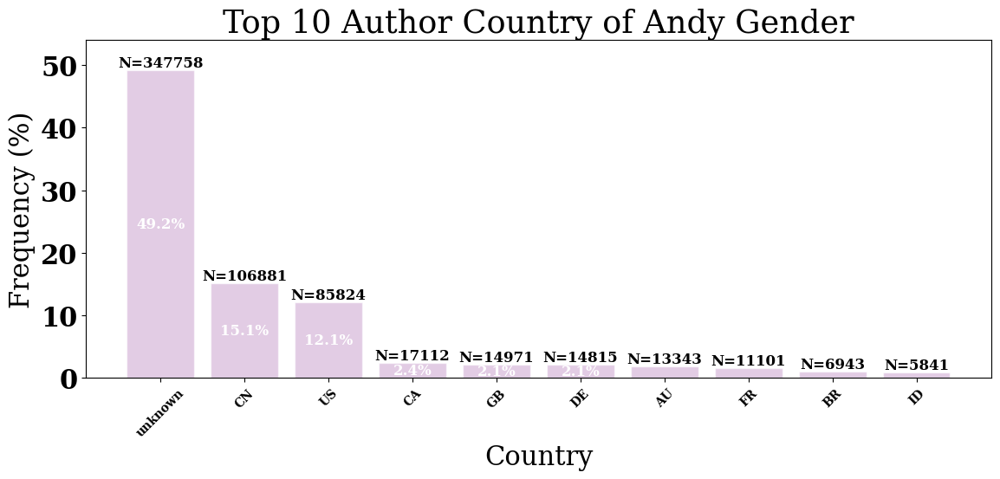

In [116]:
cat_top_plot(article_author_data_original[article_author_data_original.predicted_gender=='andy'].author_country, top_n=10, title='Top 10 Author Country of Andy Gender', xlabel='Country', ylabel='Frequency (%)', norm=True, multiply=100, rot=45, xmargins=None, ymargins=0.1, save_name=save_name)


In [ ]:
#maybe do the same with country code as with the short name one where we put country name as label and country code as x-tick

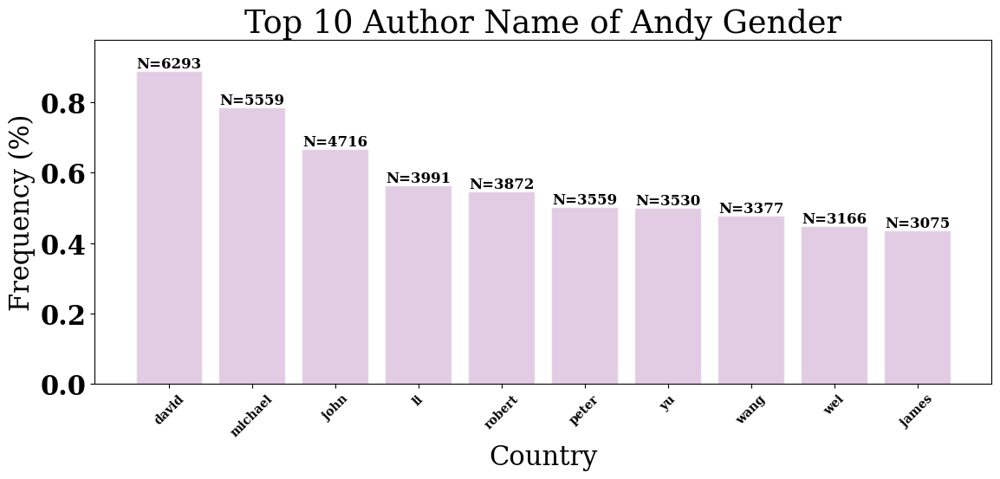

In [55]:
cat_top_plot(article_author_data_original[article_author_data_original.predicted_gender=='andy'].extracted_first_name, top_n=10, title='Top 10 Author Name of Andy Gender', xlabel='Country', ylabel='Frequency (%)', norm=True, multiply=100, rot=45, xmargins=None, ymargins=0.1, save_name=save_name)


In [ ]:
#combine the two plots in one and do the same for "unknown" gender 

In [98]:
import matplotlib.pyplot as plt
import numpy as np

def plot_dual_axis(data1, data2, labels=('Dataset 1', 'Dataset 2'), title=None, xlabel=None, ylabel1=None, ylabel2=None):
    fig, ax1 = plt.subplots(figsize=(10, 6))

    color1 = 'tab:blue'
    ax1.set_xlabel(xlabel)
    ax1.set_ylabel(ylabel1, color=color1)
    width = 0.4  # Width of the bars for Dataset 1
    bars1 = ax1.bar(np.arange(len(data1)), data1, width=width, color=color1, alpha=0.6)
    ax1.tick_params(axis='y', labelcolor=color1)

    # Creating a second y-axis on the right
    ax2 = ax1.twinx()
    color2 = 'tab:red'
    ax2.set_ylabel(ylabel2, color=color2)
    width = 0.4  # Width of the bars for Dataset 2
    bars2 = ax2.bar(np.arange(len(data2)) + width, data2, width=width, color=color2, alpha=0.6)

    # Combine legends for both datasets
    plt.legend([bars1[0], bars2[0]], labels, loc='upper left')

    plt.title(title)
    plt.show()



In [99]:

data1 = np.array([25, 50, 30, 40, 35])
data2 = np.array([50, 75, 40, 60, 70])
categories = ['A', 'B', 'C', 'D', 'E']



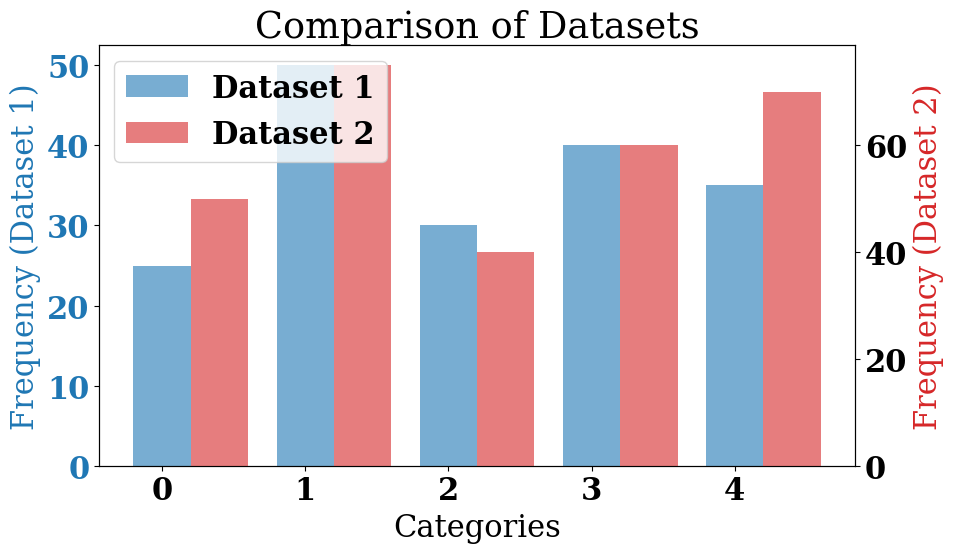

In [100]:
plot_dual_axis(data1, data2, labels=('Dataset 1', 'Dataset 2'), title='Comparison of Datasets', xlabel='Categories', ylabel1='Frequency (Dataset 1)', ylabel2='Frequency (Dataset 2)')


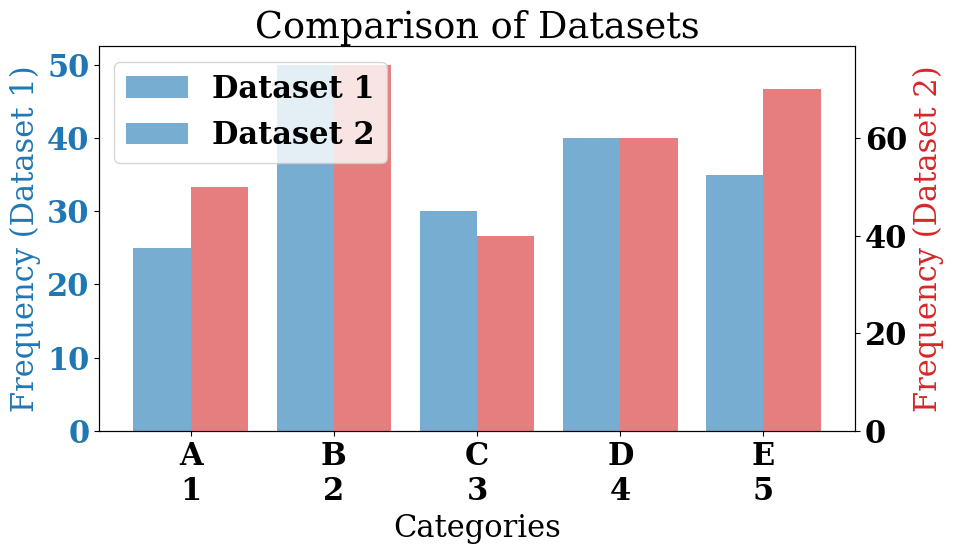

In [101]:
import matplotlib.pyplot as plt
import numpy as np

def plot_dual_axis(data1, data2, labels=('Dataset 1', 'Dataset 2'), title=None, xlabel=None, ylabel1=None, ylabel2=None):
    fig, ax1 = plt.subplots(figsize=(10, 6))

    color1 = 'tab:blue'
    ax1.set_xlabel(xlabel)
    ax1.set_ylabel(ylabel1, color=color1)
    width = 0.4  # Width of the bars for Dataset 1
    bars1 = ax1.bar(np.arange(len(data1)), data1, width=width, color=color1, alpha=0.6, label=labels[0])
    ax1.tick_params(axis='y', labelcolor=color1)

    # Creating a second y-axis on the right
    ax2 = ax1.twinx()
    color2 = 'tab:red'
    ax2.set_ylabel(ylabel2, color=color2)
    width = 0.4  # Width of the bars for Dataset 2
    bars2 = ax2.bar(np.arange(len(data2)) + width, data2, width=width, color=color2, alpha=0.6, label=labels[1])

    # Combine legends for both datasets
    bars = bars1 + bars2
    plt.legend(bars, labels, loc='upper left')

    # Set x-ticks
    categories_data1 = ['A', 'B', 'C', 'D', 'E']
    categories_data2 = ['1', '2', '3', '4', '5']
    combined_labels = [f'{cat1}\n{cat2}' for cat1, cat2 in zip(categories_data1, categories_data2)]
    plt.xticks(np.arange(len(data1)) + width / 2, combined_labels)

    plt.title(title)
    plt.show()

data1 = np.array([25, 50, 30, 40, 35])
data2 = np.array([50, 75, 40, 60, 70])

plot_dual_axis(data1, data2, labels=('Dataset 1', 'Dataset 2'), title='Comparison of Datasets', xlabel='Categories', ylabel1='Frequency (Dataset 1)', ylabel2='Frequency (Dataset 2)')


## Final data

In [ ]:
save_name='article_author_data_final'

In [ ]:
cat_plot_compare(article_author_data_original.predicted_gender, article_author_data_final.predicted_gender, title='Gender dist. before and after final update', xlabel='Gender', ylabel='Frequency (%)', norm=True, multiply=100, font=font, rot=0, xmargins=0.02, ymargins=0.1, save_name='duplicatenameupdategenderdistcleanfifth', label1='Before update', label2='After update')


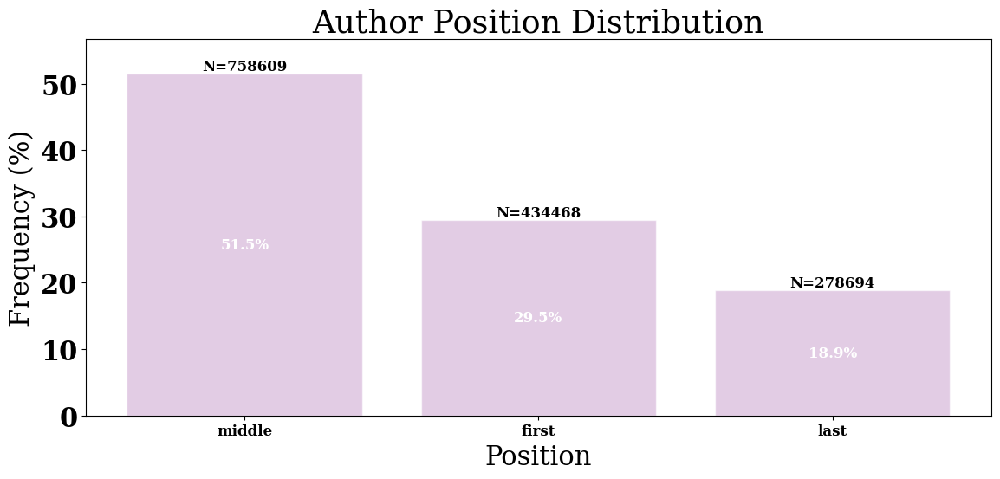

In [119]:
cat_plot(article_author_data_final.author_position, title='Author Position Distribution', xlabel='Position', ylabel='Frequency (%)', norm=True, multiply=100, xmargins=None, ymargins=0.1, save_name=save_name)


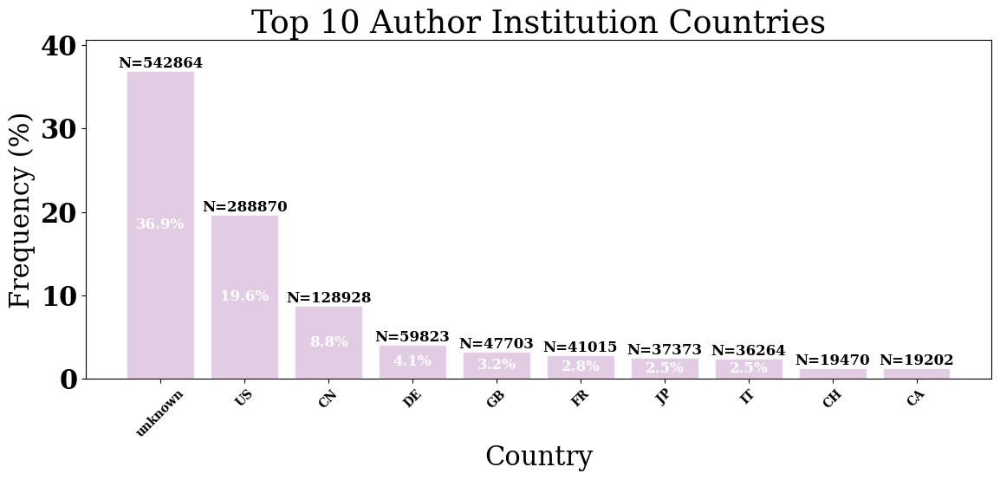

In [120]:
cat_top_plot(article_author_data_final.institution_country_code, top_n=10, title='Top 10 Author Institution Countries', xlabel='Country', ylabel='Frequency (%)', norm=True, multiply=100, rot=45, xmargins=None, ymargins=0.1, save_name=save_name)


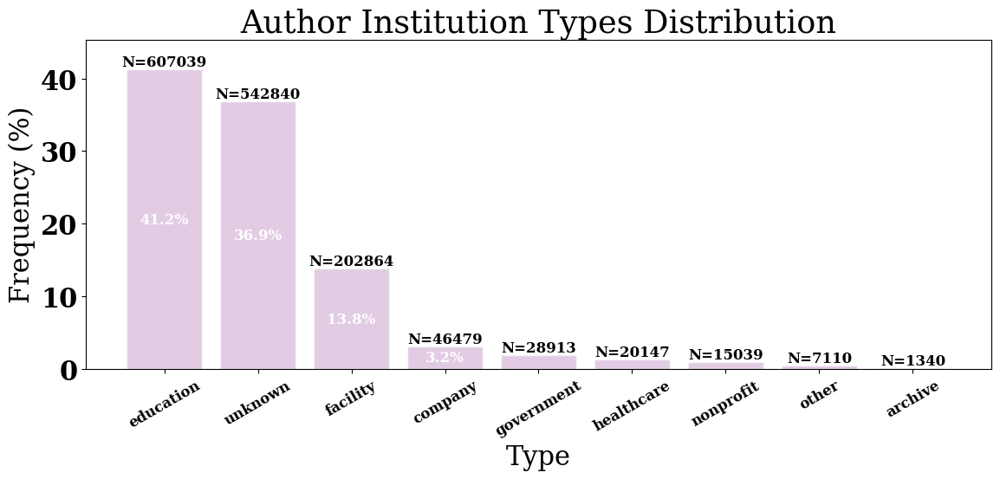

In [121]:
cat_plot(article_author_data_final.institution_type, title='Author Institution Types Distribution', xlabel='Type', ylabel='Frequency (%)', norm=True, multiply=100, rot=30, ymargins=0.1, save_name=save_name)


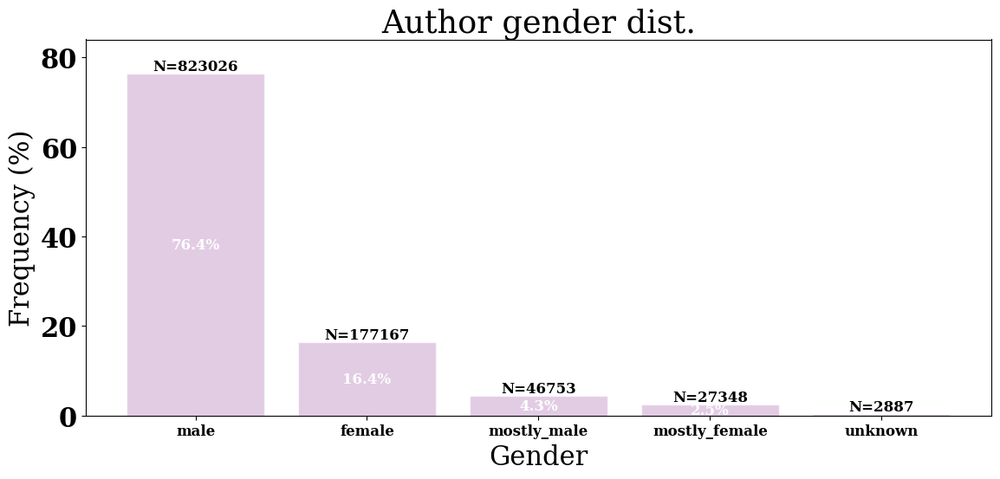

In [122]:
cat_plot(article_author_data_final.predicted_gender, title='Author gender dist.', xlabel='Gender', ylabel='Frequency (%)', ymargins=0.1, norm=True, multiply=100, rot=0, save_name=save_name)


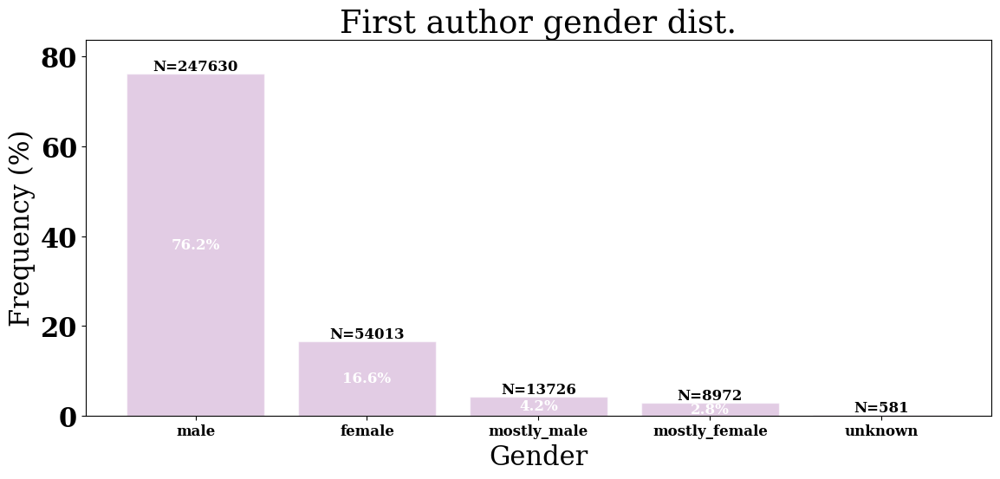

In [123]:
cat_plot(article_author_data_final[article_author_data_final.author_position=='first'].predicted_gender, title='First author gender dist.', xlabel='Gender', ylabel='Frequency (%)', ymargins=0.1, norm=True, multiply=100, rot=0, save_name=save_name)


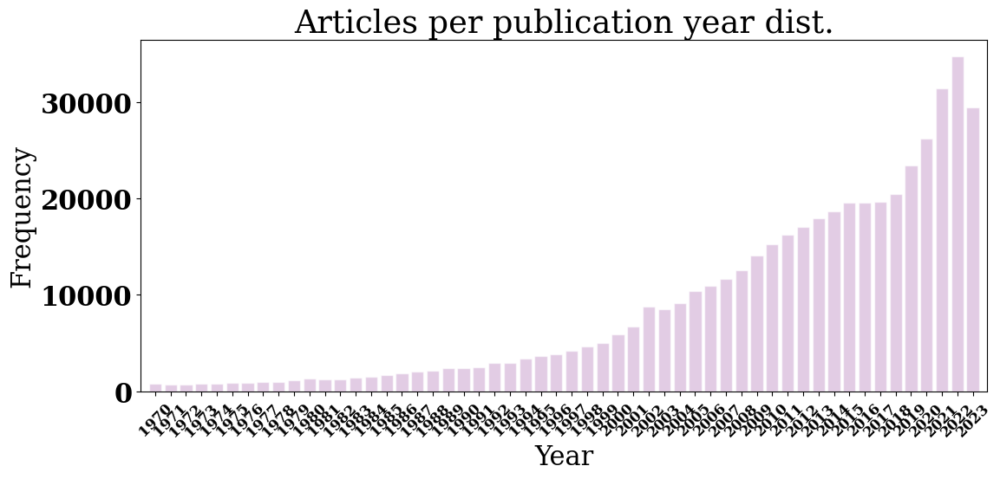

In [124]:
cat_plot(article_author_data_final.drop_duplicates(subset=['article_id'], keep='first').publication_year, title='Articles per publication year dist.', xlabel='Year', ylabel='Frequency', xmargins=0.01, norm=False, multiply=1, rot=45, save_name=save_name)


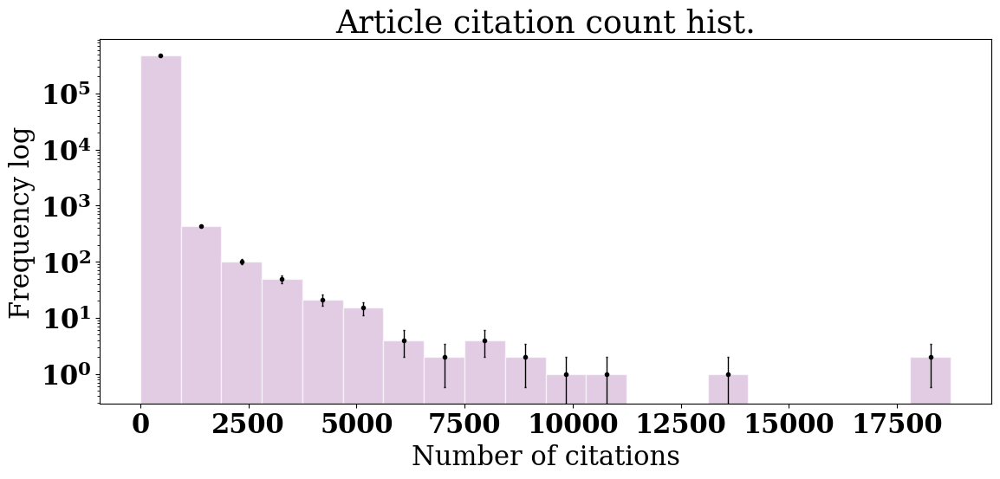

In [125]:
hist_plot([article_author_data_final.drop_duplicates(subset=['article_id'], keep='first').cited_by_count], N_bins=None, log=True, title='Article citation count hist.', xlabel='Number of citations', ylabel='Frequency log', save_name=save_name, disp_legend=False)


In [126]:
#define short names outside plotting function 
data_cats=article_author_data_final.drop_duplicates(subset=['article_id'], keep='first').journal_name.value_counts().reset_index()[0:20]
data_cats = data_cats.iloc[:, 0]

excluded_words = ['THE', 'AND', 'OF', 'FOR']
#short_names = []

def extract_first_letters(words):
    short_name = ''
    skip_next = False
    
    for word in words:
        if skip_next:
            skip_next = ')' not in word
        elif '(' in word:
            skip_next = ')' not in word
        else:
            short_name += word[0]

    return short_name

for cat in data_cats:
    words = [word.upper() for word in cat.split() if word.upper() not in excluded_words]
    unique_short_name = extract_first_letters(words)
    
    # Check for duplicates and add a unique identifier
    count = short_names.count(unique_short_name)
    if count > 0:
        unique_short_name += str(count + 1)
    
    short_names.append(unique_short_name)

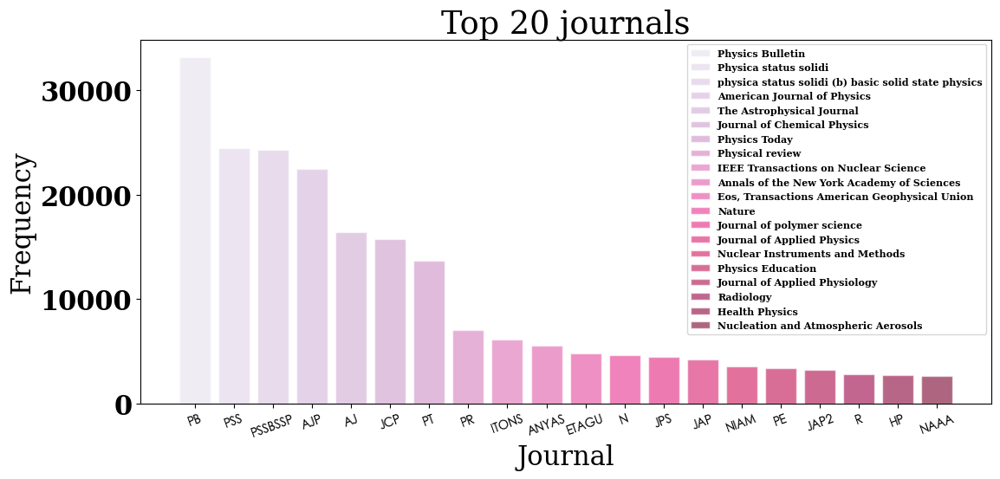

In [127]:
cat_top_plot_short_names(article_author_data_final.drop_duplicates(subset=['article_id'], keep='first').journal_name, top_n=20, title='Top 20 Appearing journals', xlabel='Journal', ylabel='Frequency', norm=False, multiply=1, font='Heiti TC', rot=20, save_name=save_name)


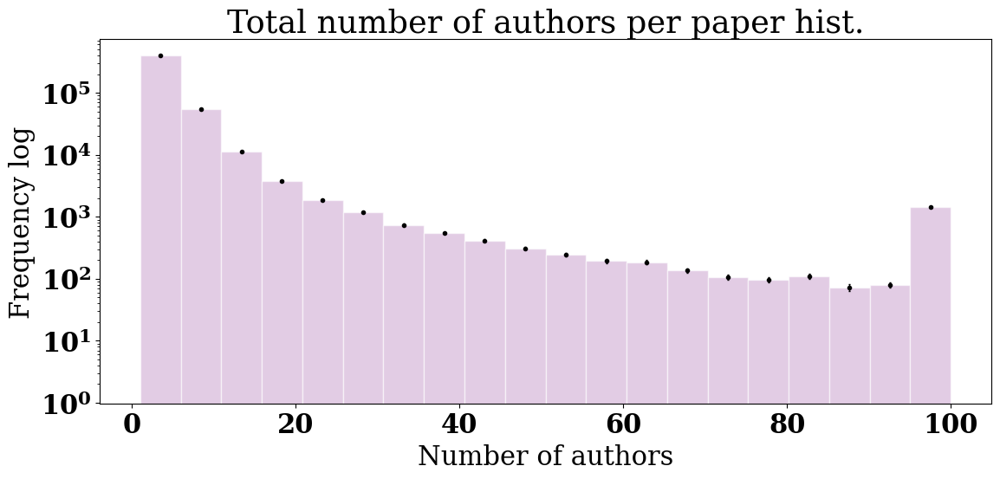

In [128]:
hist_plot([article_author_data_final.drop_duplicates(subset=['article_id'], keep='first').total_author_counts], log=True, title='Total number of authors per paper hist.', xlabel='Number of authors', ylabel='Frequency log', save_name=save_name, disp_legend=False)


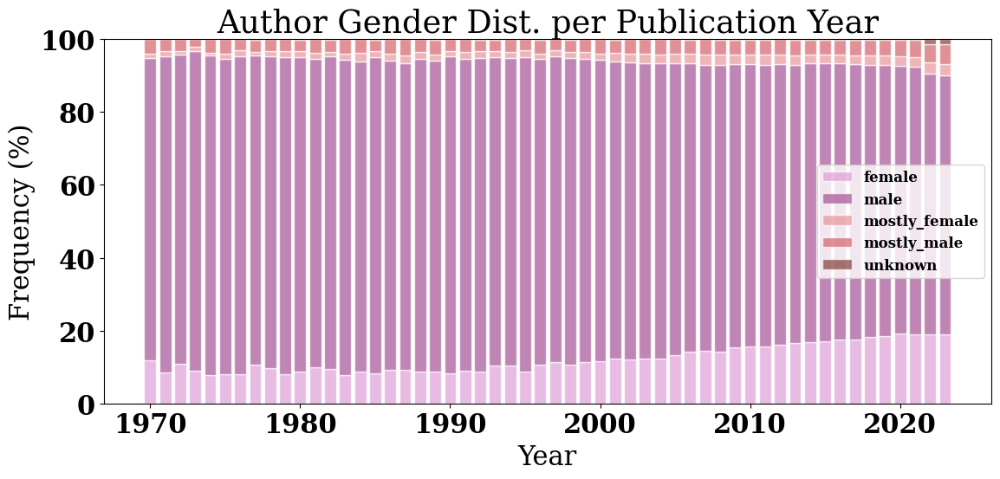

In [129]:
#calculate gender dist per year 
gender_year_counts = article_author_data_final.groupby(['publication_year', 'predicted_gender']).size().unstack(fill_value=0).reset_index()

#plot in stacked bar plot
stacked_bar_plot_normalized(gender_year_counts, 'publication_year', gender_year_counts.columns.difference(['publication_year']), title='Author Gender Dist. per Publication Year', xlabel='Year', ylabel='Frequency (%)', save_name=save_name)


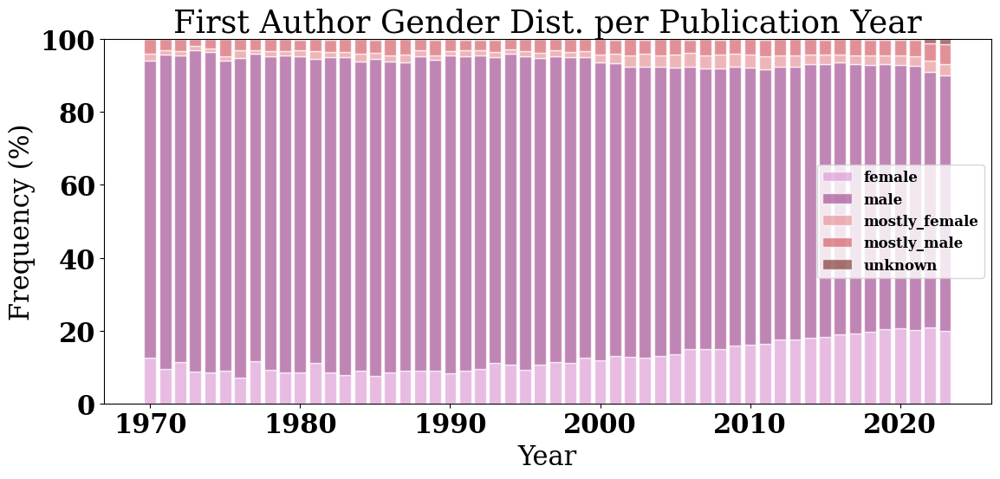

In [130]:
#calculate gender dist per year 
first_author_gender_year_counts = article_author_data_final[article_author_data_final.author_position=='first'].groupby(['publication_year', 'predicted_gender']).size().unstack(fill_value=0).reset_index()

#plot in stacked bar plot
stacked_bar_plot_normalized(first_author_gender_year_counts, 'publication_year', gender_year_counts.columns.difference(['publication_year']), title='First Author Gender Dist. per Publication Year', xlabel='Year', ylabel='Frequency (%)', save_name=save_name)


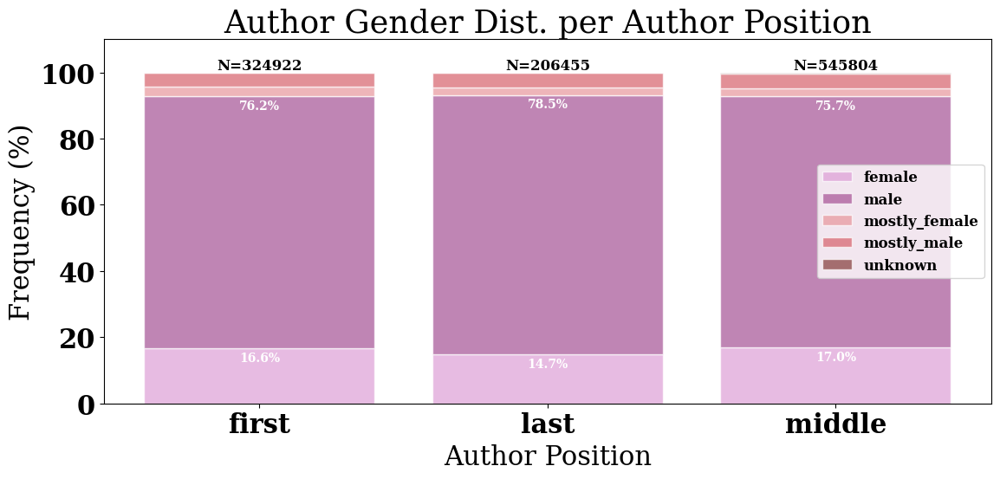

In [131]:
gender_position_counts=article_author_data_final.groupby(['author_position', 'predicted_gender']).size().unstack(fill_value=0).reset_index()

stacked_bar_plot_normalized(gender_position_counts, 'author_position', gender_position_counts.columns.difference(['author_position']), title='Author Gender Dist. per Author Position', xlabel='Author Position', ylabel='Frequency (%)', ymargins=0.1, save_name=save_name)


## World map 

In [132]:
#calc percentage of country appearing
df_country_proportion=article_author_data_final.author_first_country.value_counts(normalize=True).mul(100).reset_index()
df_country_count=article_author_data_final.author_first_country.value_counts(normalize=False).reset_index()

In [133]:
df_country=pd.merge(df_country_proportion, df_country_count, on='author_first_country')


In [134]:
# generate country code for map plotting 
def alpha3code(column):
    CODE=[]
    for country in column:
        try:
            code=pycountry.countries.get(alpha_2=country).alpha_3
           # .alpha_3 means 3-letter country code 
           # .alpha_2 means 2-letter country code
            CODE.append(code)
        except:
            CODE.append('None')
    return CODE
# create a column for code 
df_country['map_code']=alpha3code(df_country.author_first_country)


In [135]:
#import world dataset
world = gpd.read_file('ne_110m_admin_0_countries.shx')


In [136]:
world = world[['ADMIN', 'ISO_A3', 'GU_A3', 'CONTINENT',  'geometry']] 
world.columns=['map_name', 'map_code', 'GU_A3', 'continent',  'geometry']


In [137]:
world['map_code'][world['map_code']=='-99']=world['GU_A3']

In [138]:
world=world.drop(columns=['GU_A3'])

In [139]:
# Data for the rows to add for the world map 
add_country_data = {
    'map_name': ['Singapore', 'Virgin Islands, British', 'Hong Kong', 'Malta','Macao', 'Bahrain', 'Mauritius', 'Monaco','Barbados','Réunion',
                 'Holy See (Vatican City State)','Bermuda','Martinique','French Guiana','Faroe Islands','Guadeloupe','Svalbard and Jan Mayen',
                 'Liechtenstein','Montserrat','Palau','Curaçao','Dominica','Cayman Islands','Grenada','Guam','French Polynesia','Cabo Verde',
                 'Sao Tome And Principe','Antigua And Barbuda'],
    'map_code': ['SGP', 'VGB','HKG','MLT','MAC','BHR','MUS','MCO','BRB','REU',
                 'VAT','BMU','MTQ','GUF','FRO','GLP','SJM',
                 'LIE','MSR','PLW','CUW','DMA','CYM','GRD','GUM','PYF','CPV',
                 'STP','ATG']
                }

# Create a new DataFrame with the rows to add
new_rows_df = pd.DataFrame(add_country_data)

# add new rows to the world map
world = pd.concat([world, new_rows_df], ignore_index=True)

In [140]:
# then merge complete world with our data 
merge_map=pd.merge(world,df_country,on='map_code')

In [141]:
# last thing we need to do is - merge again with our location data which contains each country’s latitude and longitude
location=pd.read_csv('https://raw.githubusercontent.com/melanieshi0120/COVID-19_global_time_series_panel_data/master/data/countries_latitude_longitude.csv')
location=location.rename(columns={"name": "map_name"})


In [142]:
#countries that ARE in both data but needs a renaming to merge correctly 

merge_map['map_name'] = merge_map['map_name'].replace({'United Republic of Tanzania': 'Tanzania', 'Democratic Republic of the Congo': 'Dem. Rep. Congo',
'Dominican Republic	':'Dominican Rep.', 'The Bahamas': 'Bahamas', 'Ivory Coast': 'Côte d', 'Central African Republic': 'Central African Rep.',
'Republic of the Congo': 'Congo', 'Bosnia and Herzegovina':'Bosnia and Herz.', 'North Macedonia': 'Macedonia', 'Republic of Serbia': 'Serbia',
'South Sudan':'S. Sudan'})


In [143]:
#countries that ARE NOT  in data and should be added

add_country_data={
    'map_name': ['Norway', 'Greenland', 'East Timor', 'Lesotho', 'France', 'Puerto Rico', 'eSwatini', 'Palestine', 'Myanmar', 'North Korea',
             'Turkmenistan', 'New Caledonia', 'Singapore', 'Virgin Islands, British', 'Hong Kong', 'Malta', 'Macao', 'Bahrain', 'Mauritius',
             'Monaco', 'Barbados', 'Réunion', 'Holy See (Vatican City State)', 'Bermuda', 'Martinique', 'French Guiana', 'Faroe Islands',
             'Guadeloupe', 'Svalbard and Jan Mayen', 'Liechtenstein', 'Montserrat', 'Palau', 'Curaçao', 'Dominica', 'Cayman Islands',
             'Grenada', 'Guam', 'French Polynesia', 'Cabo Verde', 'Sao Tome And Principe', 'Antigua And Barbuda'],
    'latitude': [60.472024, 71.706940, 33.819340, -29.609988, 46.603354, 18.2208, -26.326080, 31.952162, 21.9162, 40.339851,
                38.969719, -20.904305, 1.290270, 18.423500, 22.396427, 35.937496, 22.198746, 26.066700, -20.348404,
                 43.738419, 13.193887, -21.115141, 30.033760, 32.307800, 14.641528, 4.938000, 61.892635,
                16.264999, 77.553604, 47.141041, 16.706110, 7.514980, 12.121610, 15.414999, 19.313299, 
                 12.116500, 13.444304, -17.679743, 16.538799, 0.336310, 17.060816],
    'longitude': [8.468946, -42.604301, -118.071167, 28.233608, 1.888334, -66.5901, 31.146080, 35.233154, 95.9560, 127.510094,
                 59.556278, 165.618042, 103.851959, -64.619830, 114.109497, 14.375416, 113.543877, 50.557701, 57.552151,
                  7.424616, -59.543198, 55.536385, -95.811600, -64.750504, -61.024174, -52.335049, -6.911806,
                 -61.550999, 23.670273, 9.521450, -62.213371, 134.582520, -68.949417, -61.370975, -81.254601, 
                  -61.679001, 144.793732, -149.406845, -23.041800, 6.734240, -61.796429]
}


# Create a new DataFrame with the rows to add
new_rows_df = pd.DataFrame(add_country_data)

# add new rows to the world map
location = pd.concat([location, new_rows_df], ignore_index=True)

In [144]:
merge_map=merge_map.merge(location,on='map_name').sort_values(by='proportion',ascending=False).reset_index()

In [145]:
mergeworld = pd.merge(merge_map, world, how='outer')

In [146]:
world['map_name'] = world['map_name'].replace({'United Republic of Tanzania': 'Tanzania', 'Democratic Republic of the Congo': 'Dem. Rep. Congo',
'Dominican Republic	':'Dominican Rep.', 'The Bahamas': 'Bahamas', 'Ivory Coast': 'Côte d', 'Central African Republic': 'Central African Rep.',
'Republic of the Congo': 'Congo', 'Bosnia and Herzegovina':'Bosnia and Herz.', 'North Macedonia': 'Macedonia', 'Republic of Serbia': 'Serbia',
'South Sudan':'S. Sudan'})

In [147]:
mergeworld = pd.merge(merge_map, world, how='outer')

updated coordinates Singapore https://github.com/johan/world.geo.json/pull/40/files

In [148]:
#we found coordinates on singapore so include those 
coordinates_singapore = [
    (103.60313415527344, 1.26675774823251),
    (103.61755371093749, 1.3244212231757635),
    (103.65325927734375, 1.3896342476555246),
    (103.66630554199219, 1.4143460858068593),
    (103.67179870605467, 1.4294476354255539),
    (103.68278503417969, 1.439057660807751),
    (103.69583129882812, 1.4438626583311722),
    (103.72055053710938, 1.4589640128389818),
    (103.73771667480469, 1.4582775898253464),
    (103.75419616699219, 1.4493540716333067),
    (103.7603759765625, 1.4500404973607948),
    (103.80363464355467, 1.4788701887242242),
    (103.8269805908203, 1.4754381021049132),
    (103.86680603027342, 1.4582775898253464),
    (103.8922119140625, 1.4321933610794366),
    (103.89701843261717, 1.4287612034988086),
    (103.91555786132812, 1.4267019064882447),
    (103.93478393554688, 1.4321933610794366),
    (103.96018981933592, 1.4218968729661605),
    (103.985595703125, 1.4246426076343077),
    (104.00070190429688, 1.4212104387885494),
    (104.02130126953125, 1.4397440896459617),
    (104.04396057128906, 1.445921939876798),
    (104.08721923828125, 1.4246426076343077),
    (104.09477233886719, 1.3971851147344805),
    (104.08103942871094, 1.3573711816421556),
    (104.12704467773438, 1.290097884072079),
    (104.12704467773438, 1.2777413679950957),
    (103.98216247558594, 1.2537146393239096),
    (103.81256103515625, 1.1754546449158993),
    (103.73634338378906, 1.1301452152248344),
    (103.65394592285156, 1.1905576261723045),
    (103.56536865234375, 1.1960495988987414),
    (103.60313415527344, 1.26675774823251)
]

polygon_singapore = Polygon(coordinates_singapore)


In [149]:
#make sure France only includes FRANCE

coordinates_france = [
    [
        (6.18632, 49.46380),
        (6.65823, 49.20196),
        (8.09928, 49.01778),
        (7.59368, 48.33302),
        (7.46676, 47.62058),
        (7.19220, 47.44977),
        (6.73657, 47.54180),
        (6.76871, 47.28771),
        (6.03739, 46.72578),
        (6.02261, 46.27299),
        (6.50010, 46.42967),
        (6.84359, 45.99115),
        (6.80236, 45.70858),
        (7.09665, 45.33310),
        (6.74996, 45.02852),
        (7.00756, 44.25477),
        (7.54960, 44.12790),
        (7.43518, 43.69384),
        (6.52925, 43.12889),
        (4.55696, 43.39965),
        (3.10041, 43.07520),
        (2.98600, 42.47302),
        (1.82679, 42.34338),
        (0.70159, 42.79573),
        (0.33805, 42.57955),
        (-1.50277, 43.03401),
        (-1.90135, 43.42280),
        (-1.38423, 44.02261),
        (-1.19380, 46.01492),
        (-2.22572, 47.06436),
        (-2.96328, 47.57033),
        (-4.49155, 47.95495),
        (-4.59235, 48.68416),
        (-3.29581, 48.90169),
        (-1.61651, 48.64442),
        (-1.93349, 49.77634),
        (-0.98947, 49.34738),
        (1.33876, 50.12717),
        (1.63900, 50.94661),
        (2.51357, 51.14851),
        (2.65842, 50.79685),
        (3.12325, 50.78036),
        (3.58818, 50.37899),
        (4.28602, 49.90750),
        (4.79922, 49.98537),
        (5.67405, 49.52948),
        (5.89776, 49.44267),
        (6.18632, 49.46380)
    ],
    [
        (8.74601, 42.62812),
        (9.39000, 43.00998),
        (9.56002, 42.15249),
        (9.22975, 41.38001),
        (8.77572, 41.58361),
        (8.54421, 42.25652),
        (8.74601, 42.62812)
    ]
]


polygons_france = [Polygon(coords) for coords in coordinates_france]
multipolygon_france = MultiPolygon(polygons_france)


In [150]:
#french guina appears under France but we split them
coordinates_french_guiana = [
    (-51.65780, 4.15623),
    (-52.24934, 3.24109),
    (-52.55642, 2.50471),
    (-52.93966, 2.12486),
    (-53.41847, 2.05339),
    (-53.55484, 2.33490),
    (-53.77852, 2.37670),
    (-54.08806, 2.10556),
    (-54.52475, 2.31185),
    (-54.26971, 2.73239),
    (-54.18173, 3.18978),
    (-54.00693, 3.62004),
    (-54.39954, 4.21261),
    (-54.47863, 4.89676),
    (-53.95804, 5.75655),
    (-53.61845, 5.64653),
    (-52.88214, 5.40985),
    (-51.82334, 4.56577),
    (-51.65780, 4.15623)
]

polygon_french_guiana = Polygon(coordinates_french_guiana)


In [151]:
mergeworld['geometry'][mergeworld['map_name']=='France']=multipolygon_france
mergeworld['geometry'][mergeworld['map_name']=='French Guiana']=polygon_french_guiana
mergeworld['continent'][mergeworld['map_name']=='French Guiana']='South America'

/var/folders/23/_5nwl30d12q_2dv4hhpqjfl00000gn/T/ipykernel_65022/1471707212.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mergeworld['continent'][mergeworld['map_name']=='French Guiana']='South America'


In [152]:
mergeworld=mergeworld.rename(columns={'count':'proportion_count'})

we get population size data from this site https://data.worldbank.org/indicator/SP.POP.TOTL?most_recent_year_desc=false

In [153]:
population_size=pd.read_csv('pop_size_data_2022.csv', sep=';')
population_size=population_size.rename(columns={'2022':'total_population_2022'})
population_size=population_size[population_size.map_code.isin([mergeworld.map_code[i] for i in range(len(mergeworld))])]

In [154]:
mergeworld=pd.merge(mergeworld, population_size, on='map_code', how='outer')

In [155]:
mergeworld['per_capita']=mergeworld.proportion_count/mergeworld.total_population_2022

In [156]:
mergeworld_update=mergeworld

In [157]:
import warnings
from pandas.errors import SettingWithCopyWarning

# Suppress SettingWithCopyWarning
with warnings.catch_warnings():
    warnings.simplefilter("ignore", category=SettingWithCopyWarning)

    mergeworld_update['latitude'][mergeworld_update['map_name']=='United States of America']=34
    mergeworld_update['longitude'][mergeworld_update['map_name']=='United States of America']=-115

    mergeworld_update['latitude'][mergeworld_update['map_name']=='China']=31
    mergeworld_update['longitude'][mergeworld_update['map_name']=='China']=85

    mergeworld_update['latitude'][mergeworld_update['map_name']=='Japan']=30
    mergeworld_update['longitude'][mergeworld_update['map_name']=='Japan']=135

    mergeworld_update['latitude'][mergeworld_update['map_name']=='Canada']=54
    mergeworld_update['longitude'][mergeworld_update['map_name']=='Canada']=-125

    mergeworld_update['latitude'][mergeworld_update['map_name']=='India']=15
    mergeworld_update['longitude'][mergeworld_update['map_name']=='India']=72

    mergeworld_update['latitude'][mergeworld_update['map_name']=='Russia']=59
    mergeworld_update['longitude'][mergeworld_update['map_name']=='Russia']=88

    mergeworld_update['latitude'][mergeworld_update['map_name']=='Indonesia']=-10
    mergeworld_update['longitude'][mergeworld_update['map_name']=='Indonesia']=98

    mergeworld_update['latitude'][mergeworld_update['map_name']=='Australia']=-30
    mergeworld_update['longitude'][mergeworld_update['map_name']=='Australia']=120
    
    mergeworld_update['latitude'][mergeworld_update['map_name']=='South Korea']=37
    mergeworld_update['longitude'][mergeworld_update['map_name']=='South Korea']=130

    mergeworld_update['latitude'][mergeworld_update['map_name']=='Brazil']=-15
    mergeworld_update['longitude'][mergeworld_update['map_name']=='Brazil']=-58

    mergeworld_update['latitude'][mergeworld_update['map_name']=='Germany']=51
    mergeworld_update['longitude'][mergeworld_update['map_name']=='Germany']=1

    mergeworld_update['latitude'][mergeworld_update['map_name']=='United Kingdom']=55
    mergeworld_update['longitude'][mergeworld_update['map_name']=='United Kingdom']=-35

    mergeworld_update['latitude'][mergeworld_update['map_name']=='France']=43
    mergeworld_update['longitude'][mergeworld_update['map_name']=='France']=-14

    mergeworld_update['latitude'][mergeworld_update['map_name']=='Italy']=31
    mergeworld_update['longitude'][mergeworld_update['map_name']=='Italy']=1

    mergeworld_update['latitude'][mergeworld_update['map_name']=='Switzerland']=38
    mergeworld_update['longitude'][mergeworld_update['map_name']=='Switzerland']=14.5

    mergeworld_update['latitude'][mergeworld_update['map_name']=='Spain']=35
    mergeworld_update['longitude'][mergeworld_update['map_name']=='Spain']=-35

    mergeworld_update['latitude'][mergeworld_update['map_name']=='Netherlands']=-60
    mergeworld_update['longitude'][mergeworld_update['map_name']=='Netherlands']=40

    mergeworld_update['latitude'][mergeworld_update['map_name']=='Sweden']=-40
    mergeworld_update['longitude'][mergeworld_update['map_name']=='Sweden']=40

    mergeworld_update['latitude'][mergeworld_update['map_name']=='Belgium']=-20
    mergeworld_update['longitude'][mergeworld_update['map_name']=='Belgium']=40

    mergeworld_update['latitude'][mergeworld_update['map_name']=='Poland']=41.5
    mergeworld_update['longitude'][mergeworld_update['map_name']=='Poland']=20

    mergeworld_update['latitude'][mergeworld_update['map_name']=='Norway']=66
    mergeworld_update['longitude'][mergeworld_update['map_name']=='Norway']=20
    
    mergeworld_update['latitude'][mergeworld_update['map_name']=='Austria']=-20
    mergeworld_update['longitude'][mergeworld_update['map_name']=='Austria']=-40


In [158]:
#define colors for world map

# Get the PuRd colormap
cmaptab = plt.get_cmap('tab20b')
num_colors = 20  # Number of colors
# Create a list of colors from the colormap
tab_colors = [cmaptab(i / num_colors) for i in range(num_colors)]

pink=tab_colors[19]
red=tab_colors[15]
yellow=tab_colors[10]
green=tab_colors[5]
purple=tab_colors[1]

#create legend for world map 
markersize=16
legend_elements = [Line2D([0], [0], marker='o', color='w', label='>10%',
                          markerfacecolor=pink, alpha=0.7, markersize=markersize),
                   Line2D([0], [0], marker='o', color='w', label='5-10%',
                          markerfacecolor=red, alpha=0.7, markersize=markersize),
                   Line2D([0], [0], marker='o', color='w', label='2-5%',
                          markerfacecolor=yellow, alpha=0.7, markersize=markersize),
                   Line2D([0], [0], marker='o', color='w', label='0.5-2%',
                          markerfacecolor=green, alpha=0.7, markersize=markersize),
                   Line2D([0], [0], marker='o', color='w', label='0.0-0.5%',
                          markerfacecolor=purple, alpha=0.7, markersize=markersize),
                   Line2D([0], [0], marker='o', color='w', label='NaN',
                          markerfacecolor='k', alpha=0.9, markersize=markersize),
                  ]



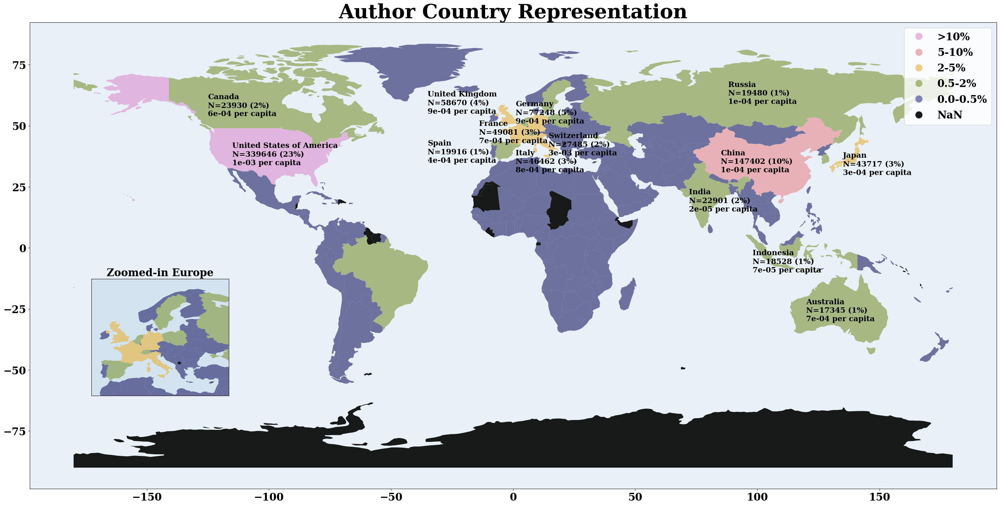

In [159]:

# Create a grid for the subplots
fig, (ax_main) = plt.subplots(figsize=(30, 25))

# Main plot
mergeworld_update.plot(column='proportion',
                scheme='natural_breaks',
                cmap='tab20b', 
                alpha=0.7,
                ax=ax_main,
                missing_kwds={'color': 'k', 'alpha':0.9}, 
                legend=False)

ax_main.set_title('Author Country Representation', fontsize=42, weight='bold')
ax_main.legend(handles=legend_elements, loc='upper right', fontsize=22)

# Add countries names and numbers for most appearing countries 
for i in range(len(mergeworld_update[mergeworld_update['proportion'] >= 1])):
    text_to_display = "{}\n{}\n{}".format(
        mergeworld_update.map_name[i],
        f'N={round(mergeworld_update.proportion_count[i])} ({round(mergeworld_update.proportion[i])}%)',
        f'{mergeworld_update.per_capita[i]:.0e} per capita'
    )
    
    ax_main.text(
        float(mergeworld_update.longitude[i]),
        float(mergeworld_update.latitude[i]),
        text_to_display,
        size=16,
        #color=purd_colors[8]
    )



# Europe subplot
#divider = make_axes_locatable(ax_main)
ax_europe = ax_main.inset_axes([0.01,0.2, 0.25, 0.25])
#cax = divider.append_axes("right", size="5%", pad=0.1)
mergeworld_update.plot(column='proportion',
                                                      scheme='natural_breaks',
                                                      cmap='tab20b',
                                                      alpha=0.7,
                                                      ax=ax_europe,
                                                      #cax=None,
                                                      missing_kwds={'color': 'k', 'alpha': 0.9},
                                                      legend=False)

# Set custom limits for the axes in the ax_europe subplot
ax_europe.set_xlim(-13, 40)
ax_europe.set_ylim(30, 75)
ax_main.set_facecolor('tab:blue')
ax_main.patch.set_alpha(0.1)
ax_europe.set_facecolor('tab:blue')
ax_europe.patch.set_alpha(0.1)
ax_europe.set_title('Zoomed-in Europe', fontsize=22, weight='bold')
ax_europe.set_xticks([])
ax_europe.set_yticks([])

save_name = 'article_author_data_final_worldmap'
save_path = f'Plots/{date.today()}/{save_name}'
plt.savefig(save_path)

plt.show()


# Publication rate 

In [877]:
save_name='publication_rate'

In [592]:
article_author_data_final.columns

Index(['article_id', 'doi', 'publication_year', 'publication_date', 'title',
       'cited_by_count', 'grants', 'abstract', 'journal_id', 'journal_name',
       'total_author_counts', 'author_position', 'author_countries',
       'is_corresponding', 'raw_affiliation_string', 'raw_author_name',
       'author.display_name', 'author_id', 'institution_country_code',
       'institution_name', 'institution_id', 'institution_type',
       'selected_full_name', 'extracted_first_name', 'country_name',
       'author_country_name', 'author_country_name_api', 'predicted_gender',
       'author_first_country', 'name_gender_api', 'gender_gender_api',
       'predicted_gender_num', 'binary_gender', 'JIF'],
      dtype='object')

In [593]:
publication_count=article_author_data_final.groupby('author_id')['predicted_gender'].value_counts().reset_index()

In [594]:
#histogram med antal counts per gender 

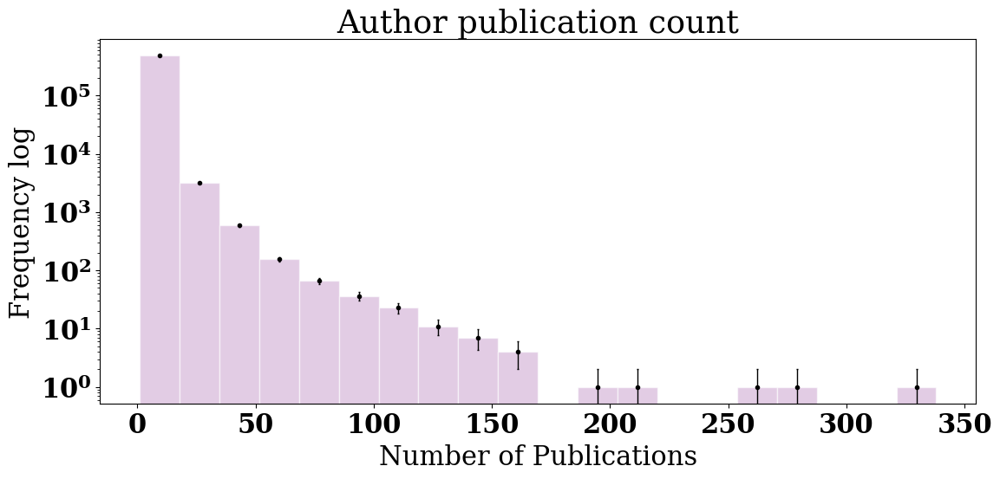

In [878]:
hist_plot([publication_count['count']], N_bins=None, log=True, title='Author publication count', xlabel='Number of Publications', ylabel='Frequency log', save_name=save_name, legend_labels=None, disp_legend=False)


In [596]:
#VI ER NÅET HERTIL - LÆS SCRIPT IGENNEM I MORGEN OG BEGYND HVOR VI SLAP BASICALLY 

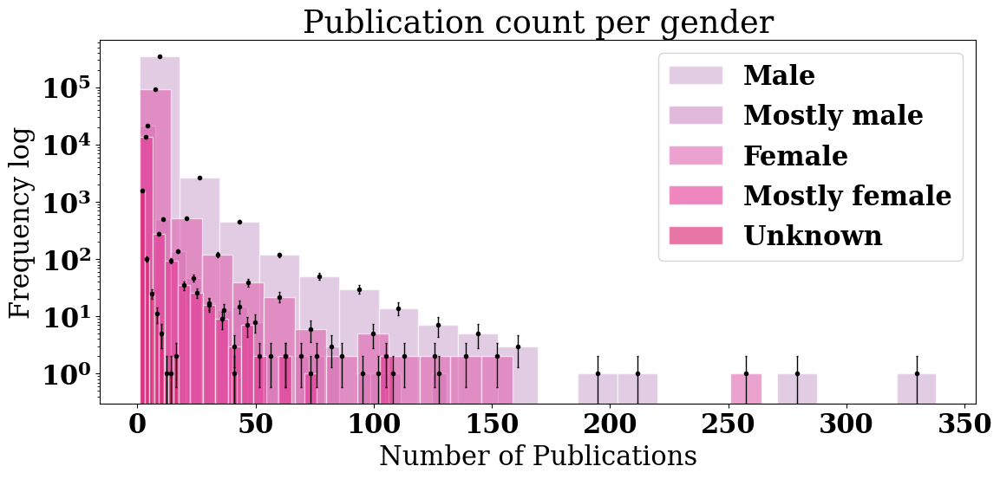

In [597]:
hist_plot([publication_count.groupby('predicted_gender').get_group('male')['count'],
 publication_count.groupby('predicted_gender').get_group('mostly_male')['count'],
 publication_count.groupby('predicted_gender').get_group('female')['count'],
 publication_count.groupby('predicted_gender').get_group('mostly_female')['count'],
 publication_count.groupby('predicted_gender').get_group('unknown')['count']], N_bins=None, log=True, title='Publication count per gender', xlabel='Number of Publications', ylabel='Frequency log', save_name='gender_publication_count', legend_labels=['Male', 'Mostly male', 'Female', 'Mostly female', 'Unknown'], disp_legend=True)


In [598]:
publication_count=article_author_data_final.groupby('author_id')['binary_gender'].value_counts().reset_index()

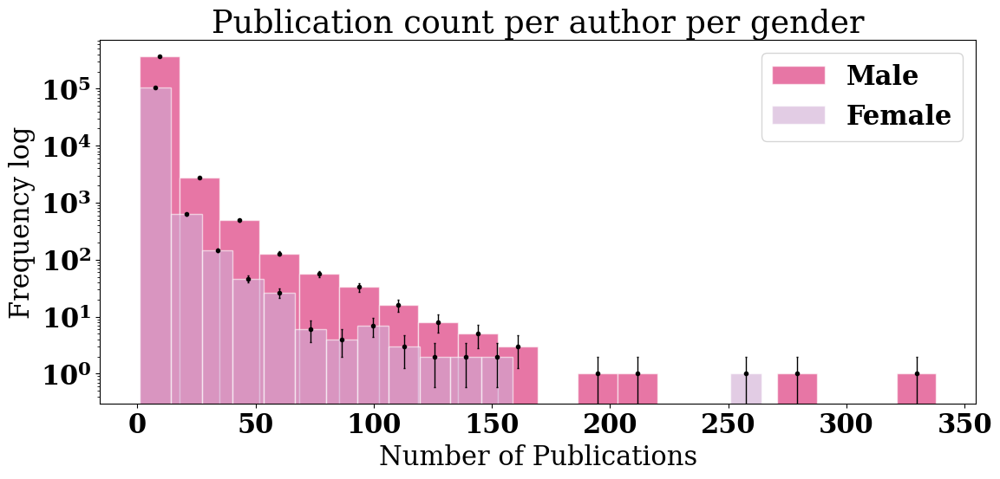

In [892]:
hist_plot([publication_count.groupby('binary_gender').get_group('male')['count'],
           publication_count.groupby('binary_gender').get_group('female')['count']], N_bins=None, log=True, title='Publication count per author per gender', xlabel='Number of Publications', ylabel='Frequency log', save_name='publication_count_per_gender', legend_labels=['Male','Female'], disp_legend=True)


In [ ]:
#lav en magen til ovenstående men bare med number of publications per year fordelt på mænd og kvinder histogram 

In [897]:
publication_count_year=article_author_data_final.groupby('author_id')[['publication_year', 'binary_gender']].value_counts().reset_index()

In [898]:
publication_count_year=publication_count_year.groupby('publication_year')['binary_gender'].value_counts().reset_index()

In [899]:
publication_count_year.groupby('binary_gender').get_group('female')['count'] #this doesn't make sense as a histogram
#it should be a cat plot but I think we already made it 

1        103
3         83
5         95
7        102
9         87
11       103
13       105
15       141
18       132
20       132
22       177
25       180
27       182
30       188
32       210
34       228
37       257
39       301
41       322
43       341
46       346
49       415
52       433
55       514
58       599
61       580
64       698
67       816
70       925
73      1030
76      1249
79      1473
82      1991
85      2015
88      2260
91      2727
94      3199
97      3371
100     3685
103     4549
106     5057
109     5489
112     5969
115     6730
118     7136
121     7573
124     8084
127     8476
130     9293
133    11009
136    12409
139    14100
142    14591
145    13028
Name: count, dtype: int64

In [900]:
#publication count per year per author 
publication_year=article_author_data_final.groupby('author_id')[['publication_year', 'predicted_gender']].value_counts().unstack(fill_value=0).reset_index()
publication_year.sort_values(by=['publication_year'])

predicted_gender,author_id,publication_year,female,male,mostly_female,mostly_male,unknown
278105,https://openalex.org/A5029879393,1970,0,0,0,1,0
356924,https://openalex.org/A5038302024,1970,0,1,0,0,0
108719,https://openalex.org/A5011702466,1970,0,1,0,0,0
588473,https://openalex.org/A5063084971,1970,0,1,0,0,0
622769,https://openalex.org/A5066774836,1970,0,1,0,0,0
...,...,...,...,...,...,...,...
96526,https://openalex.org/A5010391582,2023,0,2,0,0,0
662175,https://openalex.org/A5070990160,2023,0,0,0,0,4
328348,https://openalex.org/A5035236169,2023,0,1,0,0,0
96350,https://openalex.org/A5010370054,2023,0,1,0,0,0


In [901]:
publication_year

predicted_gender,author_id,publication_year,female,male,mostly_female,mostly_male,unknown
0,https://openalex.org/A5000000046,2006,0,1,0,0,0
1,https://openalex.org/A5000000092,2014,0,1,0,0,0
2,https://openalex.org/A5000000199,2021,1,0,0,0,0
3,https://openalex.org/A5000000900,2019,0,1,0,0,0
4,https://openalex.org/A5000001262,2021,0,1,0,0,0
...,...,...,...,...,...,...,...
859424,https://openalex.org/A9999999999,2018,0,1,0,0,0
859425,https://openalex.org/A9999999999,2019,0,18,0,0,0
859426,https://openalex.org/A9999999999,2020,0,24,0,0,0
859427,https://openalex.org/A9999999999,2021,0,218,0,0,0


In [902]:
publication_count.head(2)

,author_id,binary_gender,count
0,https://openalex.org/A5000000046,male,1
1,https://openalex.org/A5000000092,male,1


In [903]:
#publication count per year per author 
publication_rate=article_author_data_final.groupby('author_id')[['publication_year', 'predicted_gender']].value_counts().reset_index()
publication_rate=publication_rate.sort_values(by=['publication_year'])

In [904]:
#publication_rate=publication_rate[0:50000]

In [905]:
publication_rate

,author_id,publication_year,predicted_gender,count
851341,https://openalex.org/A5090864802,1970,male,1
530550,https://openalex.org/A5056731067,1970,male,1
629493,https://openalex.org/A5067285937,1970,male,1
380194,https://openalex.org/A5040653386,1970,male,2
779832,https://openalex.org/A5083297106,1970,male,1
...,...,...,...,...
606282,https://openalex.org/A5064753952,2023,mostly_female,2
746615,https://openalex.org/A5079789215,2023,male,1
746616,https://openalex.org/A5079789406,2023,male,1
606274,https://openalex.org/A5064753350,2023,female,1


In [906]:
(publication_rate.groupby('author_id')['count'].sum()>=150).sum()

11

100%|██████████████████████████████████| 483757/483757 [22:28<00:00, 358.83it/s]


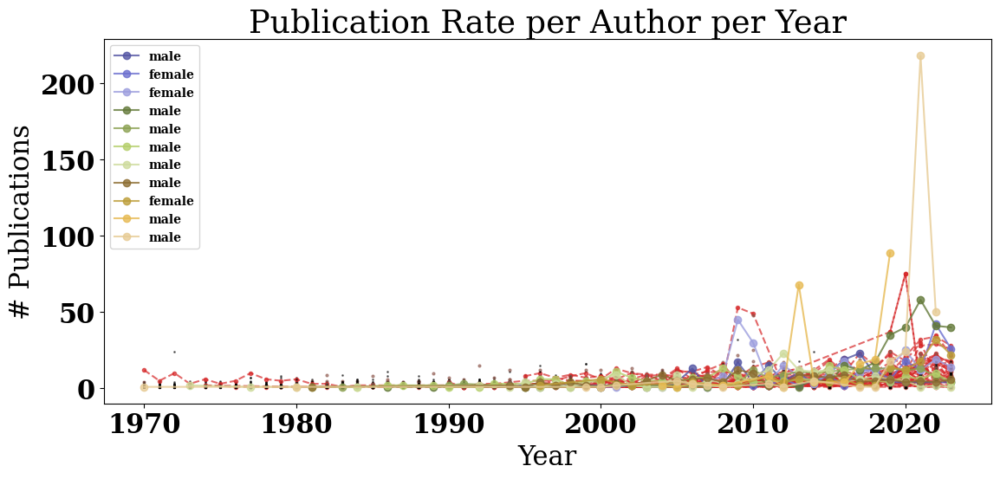

CPU times: user 8min 3s, sys: 6min 48s, total: 14min 52s
Wall time: 40min 13s


In [907]:
%%time
handles = []

# Get the 'tab20b' colormap with as many colors as unique genders
colors = plt.get_cmap('tab20b').colors
color_index = 1


for author_id, data in tqdm(publication_rate.groupby('author_id')):
    gender_values = data['predicted_gender'].unique()
    if len(gender_values) == 1:
        gender_label = gender_values[0]
        count_sum = data['count'].sum()

        if count_sum >= 150:
            color = colors[color_index % len(colors)]
            color_index += 1
            line = plt.plot(data['publication_year'], data['count'], marker='o', color=color, alpha=0.8, zorder=3, label=gender_label)[0]
            handles.append(line)
        elif 100 <= count_sum < 150:
            plt.plot(data['publication_year'], data['count'], linestyle='--', marker='o', markersize=3, color='tab:red', alpha=0.7, zorder=1)
        elif 50 <= count_sum < 100:
            plt.plot(data['publication_year'], data['count'], 'o',  markersize=2, color='tab:brown', alpha=0.6, zorder=1)
        else:
            plt.plot(data['publication_year'], data['count'], 'o', markersize=1, color='k', alpha=0.5, zorder=1)

plt.title('Publication Rate per Author per Year')
plt.xlabel('Year')
plt.ylabel('# Publications')
plt.legend(handles=handles, fontsize=10)

save_name = 'publication_rate_all'
save_path = f'Plots/{date.today()}/{save_name}'
plt.savefig(save_path)

plt.show()


In [607]:
#publication count per year per author per author position
publication_rate_first=article_author_data_final[article_author_data_final['author_position']=='first'].groupby('author_id')[['publication_year', 'predicted_gender']].value_counts().reset_index()
publication_rate_first=publication_rate_first.sort_values(by=['publication_year'])


In [34]:
publication_rate_middle=article_author_data_final[article_author_data_final['author_position']=='middle'].groupby('author_id')[['publication_year', 'predicted_gender']].value_counts().reset_index()
publication_rate_middle=publication_rate_middle.sort_values(by=['publication_year'])


In [35]:
publication_rate_last=article_author_data_final[article_author_data_final['author_position']=='last'].groupby('author_id')[['publication_year', 'predicted_gender']].value_counts().reset_index()
publication_rate_last=publication_rate_last.sort_values(by=['publication_year'])


In [36]:
print(len(publication_rate_first), len(publication_rate_middle), len(publication_rate_last))

283697 450756 178629


In [43]:
condition=publication_rate_last.groupby('author_id')['count'].sum()>100
len(condition[condition])

5

100%|█████████████████████████████████| 120223/120223 [01:55<00:00, 1040.67it/s]


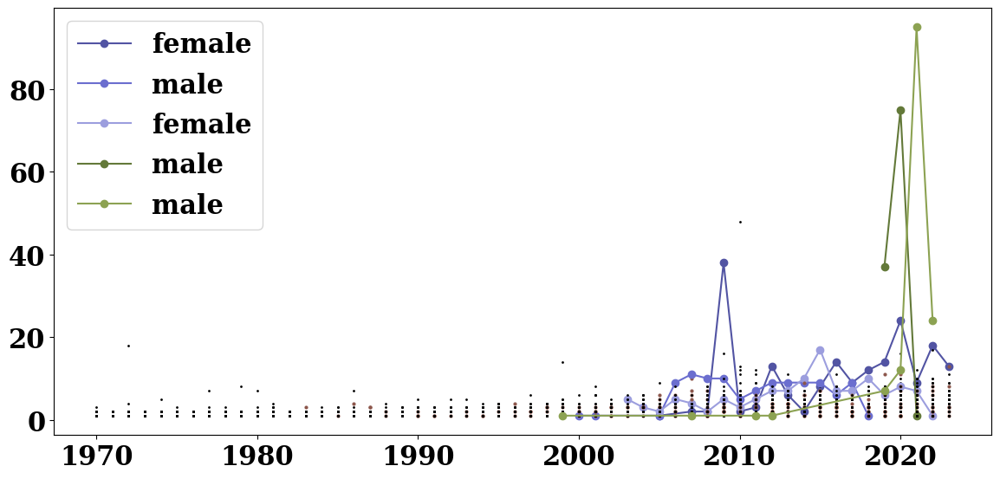

CPU times: user 1min 14s, sys: 20.6 s, total: 1min 34s
Wall time: 3min


In [568]:
%%time
handles = []

# Get the 'tab20b' colormap with as many colors as unique genders
colors = plt.get_cmap('tab20b').colors
color_index = 1


for author_id, data in tqdm(publication_rate_last.groupby('author_id')):
    gender_values = data['predicted_gender'].unique()
    if len(gender_values) == 1:
        gender_label = gender_values[0]
        count_sum = data['count'].sum()

        if count_sum >= 100:
            color = colors[color_index % len(colors)]
            color_index += 1
            line = plt.plot(data['publication_year'], data['count'], marker='o', color=color, label=gender_label)[0]
            handles.append(line)
        elif 75 <= count_sum < 100:
            plt.plot(data['publication_year'], data['count'], linestyle='--', marker='o',  markersize=3, color='tab:red')
        elif 50 < count_sum < 75:
            plt.plot(data['publication_year'], data['count'], 'o',  markersize=2, color='tab:brown')
        else:
            plt.plot(data['publication_year'], data['count'], 'o', markersize=1, color='k')

plt.legend(handles=handles)
plt.show()


In [ ]:
#ved ikke helt hvad vi skal stille op med det plot der 

In [ ]:
#let's plot dist between male female of author position over time: bar plot 

In [725]:
author_position_year=article_author_data_final.groupby(['author_position', 'publication_year', 'predicted_gender']).size().unstack(fill_value=0).reset_index()

In [726]:
author_position_year_first=author_position_year[author_position_year['author_position']=='first']

In [727]:
author_position_year_middle=author_position_year[author_position_year['author_position']=='middle']

In [728]:
author_position_year_last=author_position_year[author_position_year['author_position']=='last']

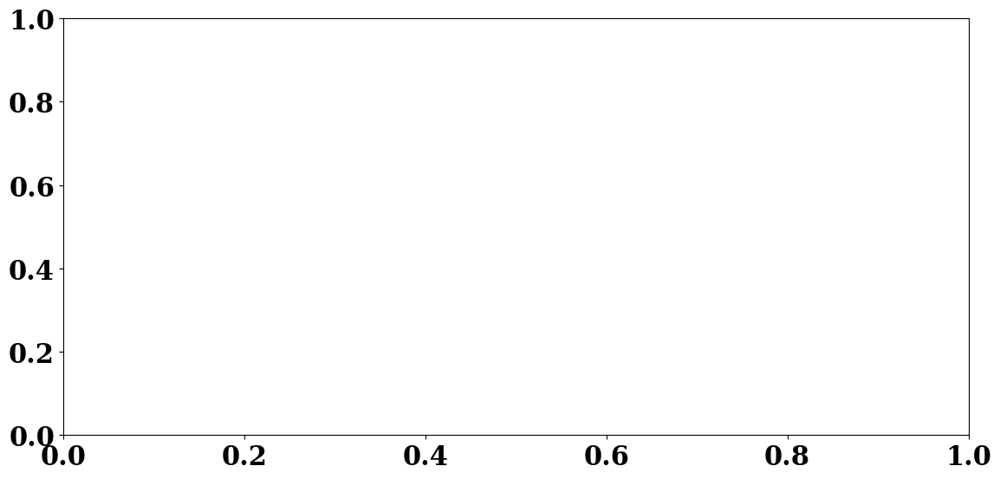

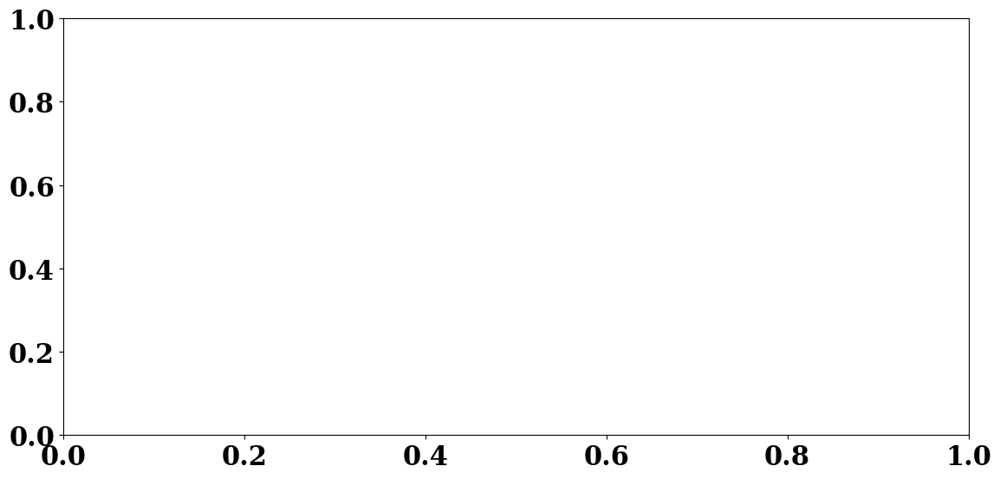

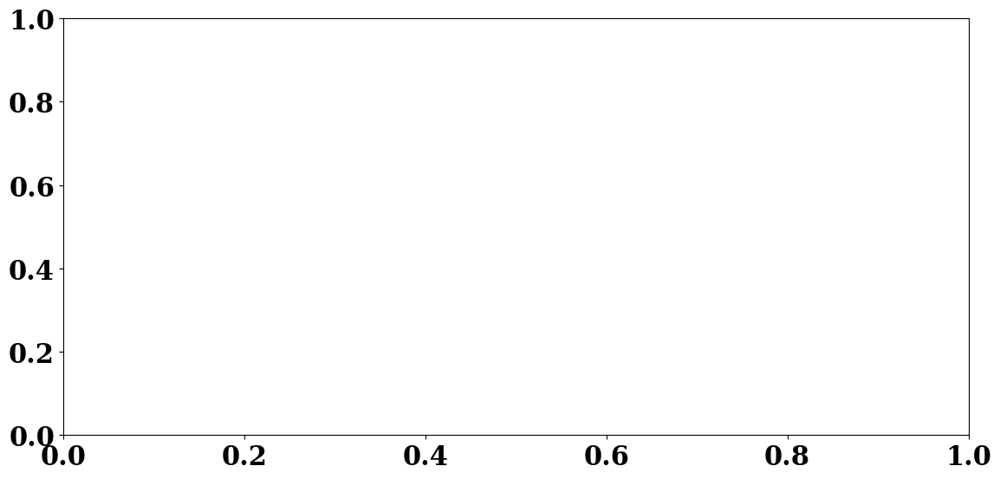

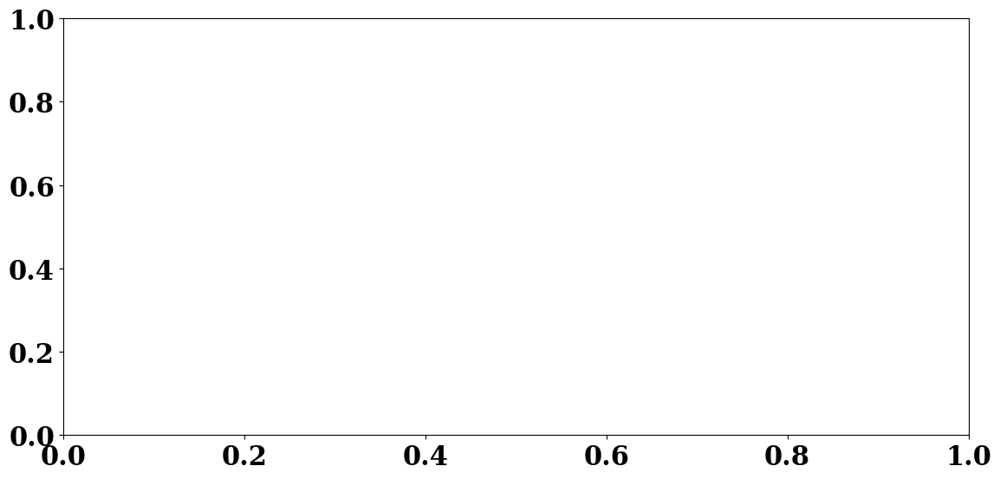

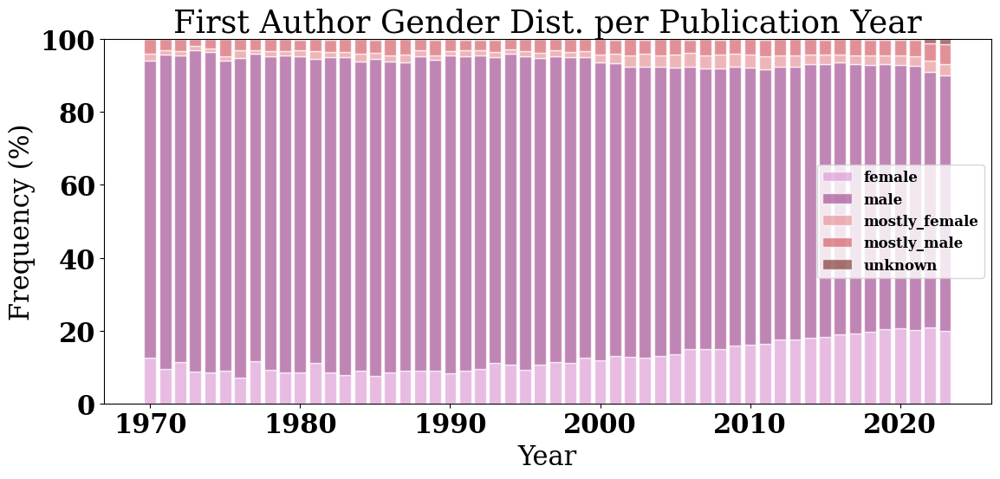

In [729]:
stacked_bar_plot_normalized(author_position_year_first, 'publication_year', ['female', 'male', 'mostly_female', 'mostly_male',
       'unknown'], title='First Author Gender Dist. per Publication Year', xlabel='Year', ylabel='Frequency (%)', save_name='test')


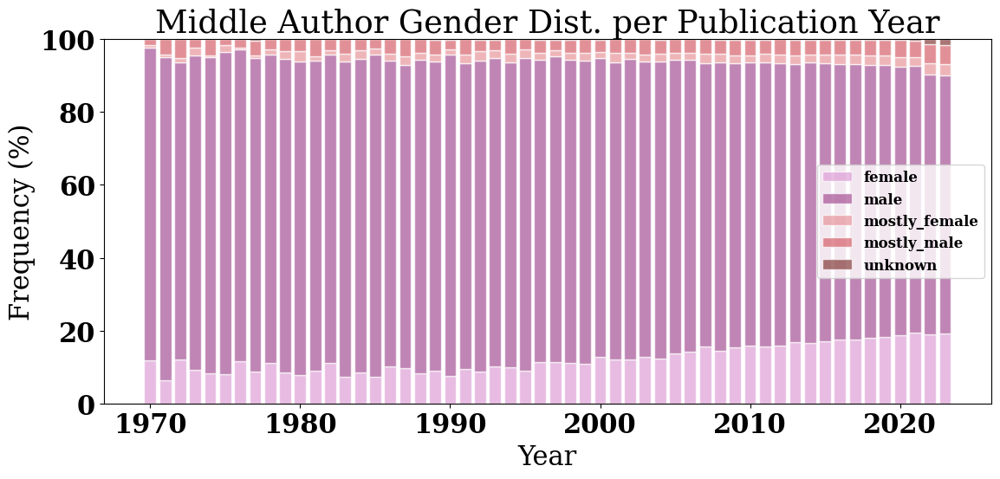

In [730]:
stacked_bar_plot_normalized(author_position_year_middle, 'publication_year', ['female', 'male', 'mostly_female', 'mostly_male',
       'unknown'], title='Middle Author Gender Dist. per Publication Year', xlabel='Year', ylabel='Frequency (%)', save_name='test')


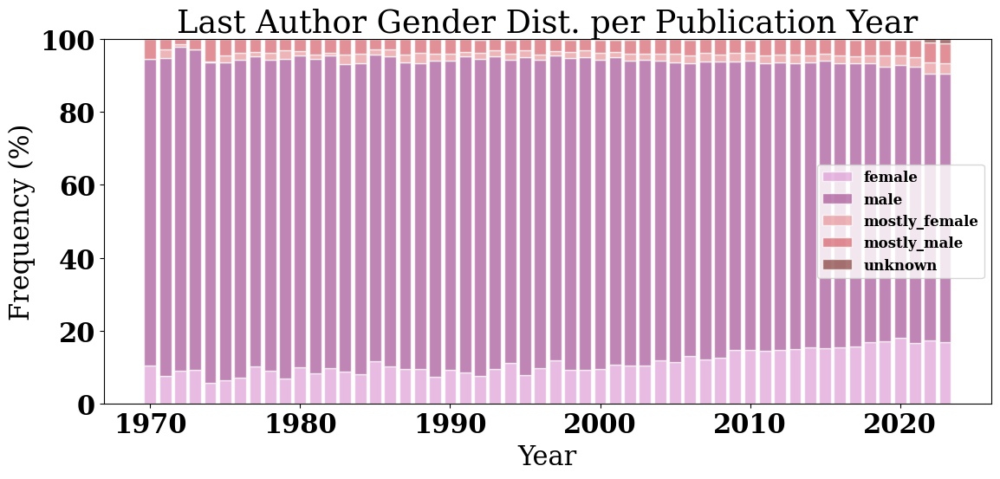

In [731]:
stacked_bar_plot_normalized(author_position_year_last, 'publication_year', ['female', 'male', 'mostly_female', 'mostly_male',
       'unknown'], title='Last Author Gender Dist. per Publication Year', xlabel='Year', ylabel='Frequency (%)', save_name='test')


In [732]:
#we should combine the three but what is the best way to do that?


In [774]:
def stacked_bar_plot_normalized_compare(dataframes, x_col, y_cols, title=None, xlabel=None, ylabel=None, xmargins=None, ymargins=None, save_name=None, labels=None):
    """
    Generate a stacked bar plot for normalized gender distribution over years.

    Parameters:
    - dataframes: List of DataFrames containing the data.
    - x_col: Column name for the years.
    - y_cols: List of column names representing different gender categories.
    - title: Title of the plot. Default is None.
    - xlabel: Label for the x-axis. Default is None.
    - ylabel: Label for the y-axis. Default is None.
    - xmargins: The size of the x-margins. Default is None.
    - ymargins: The size of the y-margins. Default is None.
    - save_name: The name to use when saving the plot.
    - labels: List of labels for each DataFrame in dataframes.

    Returns:
    - None
    """
    # Find the common set of publication years across all dataframes
    common_years = set(dataframes[0][x_col])
    for df in dataframes[1:]:
        common_years.intersection_update(df[x_col])

    # Filter each dataframe to include only the common years
    dataframes_filtered = [df[df[x_col].isin(common_years)] for df in dataframes]

    fig, ax = plt.subplots()

    # Create colors
    num_colors = 20
    cmap = plt.get_cmap('tab20b')
    colors = [cmap(i / num_colors) for i in range(num_colors)]
    reversed_colors = list(reversed(colors))
    selected_colors = [reversed_colors[i] for i in [0, 2, 4, 5, 7]]

    legend_handles=[]

    for i, df in enumerate(dataframes_filtered):
        # Normalize the data to percentages
        normalized_df = df.copy()
        total_col_name = 'total'
    
        # Calculate total within the function for the given y_cols
        normalized_df[total_col_name] = normalized_df[y_cols].sum(axis=1)

        
        for y_col in y_cols:
            normalized_df[y_col] = (normalized_df[y_col] / normalized_df['total']) * 100

        # Create an iterator for colors
        color_iterator = cycle(selected_colors)
        
        # Initialize the bottom values for stacking within the same DataFrame
        bottom_values = [0] * len(normalized_df)

        for j, y_col in enumerate(y_cols):
            color = next(color_iterator)
            x_values = np.arange(len(common_years)) + i * 0.3
            bars = ax.bar(x_values, normalized_df[y_col], bottom=bottom_values, edgecolor='white', color=color, alpha=0.7, width=0.3, label=f'{y_col}')
            
            # Update bottom values for stacking within the same DataFrame
            bottom_values = [bottom + value for bottom, value in zip(bottom_values, normalized_df[y_col])]

        # Add a legend handle for each category in the last dataframe
        if i == 0:
            for y_col in y_cols:
                plot_colors=next(color_iterator)
                legend_handles.append(plt.Line2D([0], [0], linewidth=3, color=plot_colors, markeredgecolor='white', markersize=10, label=f'{y_col}'))

    # Adding labels and title
    if xlabel:
        plt.xlabel(xlabel)
    if ylabel:
        plt.ylabel(ylabel)
    if title:
        plt.title(title)
    plt.margins(x=xmargins, y=ymargins)
    plt.xticks(np.arange(0, 60, 10), np.arange(1970, 2030, 10).astype(str))
    locs, labels = plt.yticks()
    plt.yticks(locs[1::], labels[1::])
    plt.legend(handles=legend_handles, fontsize=12)

    if save_name:
        save_path = f'Plots/{date.today()}/{save_name}'
        plt.savefig(save_path)

    # Display the plot
    plt.show()


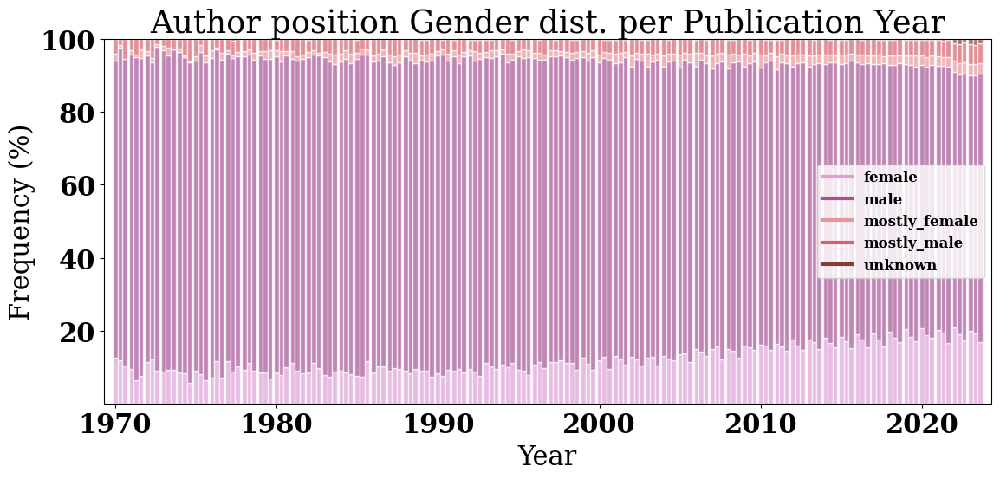

In [775]:
stacked_bar_plot_normalized_compare([author_position_year_first, author_position_year_middle, author_position_year_last], x_col="publication_year", y_cols=['female', 'male',
       'mostly_female', 'mostly_male', 'unknown'], title='Author position Gender dist. per Publication Year', xlabel='Year', ylabel='Frequency (%)',
                                    labels=['First author', 'Middle author', 'Last author'], xmargins=0.01, save_name='publication_rate')

#this works almost but let's try only for male and female - let's find a way to make it more clear which one is first, middle and last author 
#we need to update legend as well as update x-ticks and color to distinguish between author position 

In [776]:
author_position_year_binary=article_author_data_final.groupby(['author_position', 'publication_year', 'binary_gender']).size().unstack(fill_value=0).reset_index()


In [777]:
#let's also remove unknown right now 
author_position_year_binary=author_position_year_binary[['author_position','publication_year','female','male']]

In [778]:
author_position_year_binary['total']=author_position_year_binary['female']+author_position_year_binary['male']

In [779]:
author_position_year_first=author_position_year_binary[author_position_year_binary['author_position']=='first']

In [780]:
author_position_year_middle=author_position_year_binary[author_position_year_binary['author_position']=='middle']

In [781]:
author_position_year_last=author_position_year_binary[author_position_year_binary['author_position']=='last']

In [782]:
import matplotlib.pyplot as plt
import numpy as np
from itertools import cycle
from datetime import date




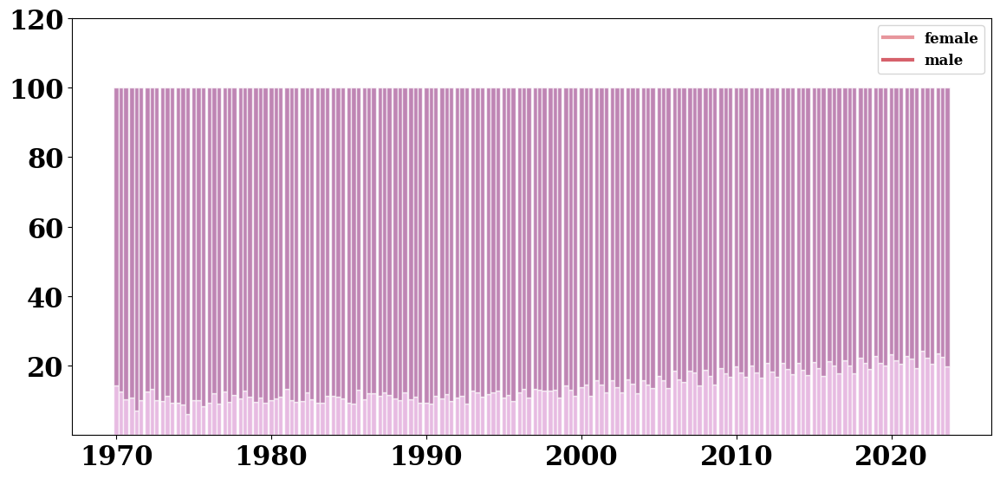

In [783]:
stacked_bar_plot_normalized_compare([author_position_year_first, author_position_year_middle, author_position_year_last], x_col="publication_year", y_cols=['female', 'male'], labels=['Dataset 1', 'Dataset 2', 'Dataset 3'])


In [784]:
#let's try with a Sankey plot 


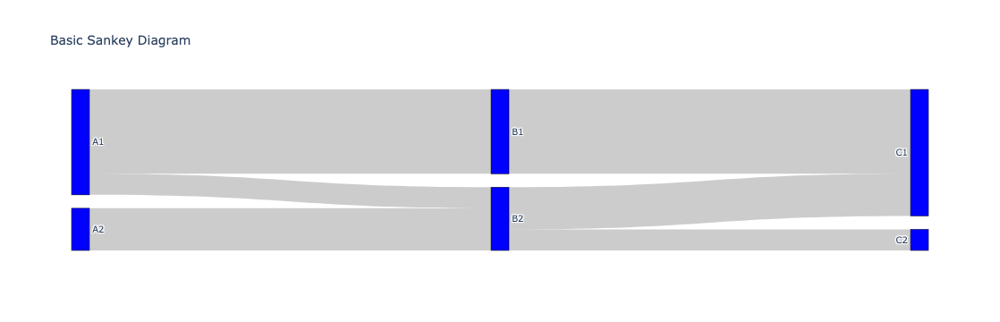

In [785]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = ["A1", "A2", "B1", "B2", "C1", "C2"],
      color = "blue"
    ),
    link = dict(
      source = [0, 1, 0, 2, 3, 3], # indices correspond to labels, eg A1, A2, A1, B1, ...
      target = [2, 3, 3, 4, 4, 5],
      value = [8, 4, 2, 8, 4, 2]
  ))])

fig.update_layout(title_text="Basic Sankey Diagram", font_size=10)
fig.show()

In [786]:
#first let's try with made up example data just from 1 year to another 

In [809]:
! pip install pysankey


[notice] A new release of pip is available: 23.3.1 -> 23.3.2
[notice] To update, run: python3.11 -m pip install --upgrade pip


In [810]:
import pandas as pd
from pySankey import sankey

pd.options.display.max_rows = 8
df = pd.read_csv(
    'fruits.txt', sep=' ', names=['true', 'predicted']
)
colorDict = {
    'apple':'#f71b1b',
    'blueberry':'#1b7ef7',
    'banana':'#f3f71b',
    'lime':'#12e23f',
    'orange':'#f78c1b'
}
sankey.sankey(
    df['true'], df['predicted'], aspect=20, colorDict=colorDict,
    fontsize=12, figure_name="fruit"
)
# Result is in "fruit.png"

ModuleNotFoundError: No module named 'pysankey'

In [811]:
! pip install pysankey


[notice] A new release of pip is available: 23.3.1 -> 23.3.2
[notice] To update, run: python3.11 -m pip install --upgrade pip


In [812]:
! pip install sankey

  Using cached sankey-0.0.2-py3-none-any.whl

[notice] A new release of pip is available: 23.3.1 -> 23.3.2
[notice] To update, run: python3.11 -m pip install --upgrade pip


In [813]:
pip install pySankeyBeta


[notice] A new release of pip is available: 23.3.1 -> 23.3.2
[notice] To update, run: /opt/homebrew/Cellar/jupyterlab/4.0.7/libexec/bin/python -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [816]:
from pySankey import sankey


ModuleNotFoundError: No module named 'pysankey'

In [815]:
# Example dataset
data = {
    'author_position_year_1970': ['first', 'middle', 'last', 'first', 'last', 'last'],
    'author_position_year_1975': ['first', 'last', 'last', 'middle', 'middle', 'last']
}

df = pd.DataFrame(data)


colorDict = {
    'first':'#f71b1b',
    'middle':'#1b7ef7',
    'last':'#f3f71b',
}
sankey.Sankey(
    df['author_position_year_1970'], df['author_position_year_1971'], aspect=20, colorDict=colorDict,
    leftLabels=None, rightLabels=None, fontsize=12, figure_name="test sankey"
)
# Result is in "fruit.png"

NameError: name 'sankey' is not defined

Streamchart: https://python-graph-gallery.com/streamchart-basic-matplotlib/

In [817]:
#let's take numbers from the actual data 
teststream=author_position_year[author_position_year['publication_year'].between(2000, 2004)]

In [818]:
teststream[teststream['author_position']=='last']

predicted_gender,author_position,publication_year,female,male,mostly_female,mostly_male,unknown
84,last,2000,197,1780,39,77,1
85,last,2001,257,2020,38,80,2
86,last,2002,337,2708,63,126,4
87,last,2003,323,2621,53,119,1
88,last,2004,415,2912,67,137,1


In [826]:
#this is great we just need to write it into a general plot function that works for our own data and make a few updates
#put on legend 
#plot in percentage rather than actual count 


In [827]:
x=author_position_year_binary.publication_year.unique()


author_position_year_binary['total']=author_position_year_binary[['female', 'male']].sum(axis=1)
author_position_year_binary['percentage_female']=author_position_year_binary.female/author_position_year_binary.total*100
author_position_year_binary['percentage_male']=author_position_year_binary.male/author_position_year_binary.total*100


y_cats = [
    author_position_year_binary[author_position_year_binary['author_position'] == 'first'].percentage_female.squeeze().values,
    author_position_year_binary[author_position_year_binary['author_position'] == 'middle'].percentage_female.squeeze().values,
    author_position_year_binary[author_position_year_binary['author_position'] == 'last'].percentage_female.squeeze().values,
    author_position_year_binary[author_position_year_binary['author_position'] == 'first'].percentage_male.squeeze().values,
    author_position_year_binary[author_position_year_binary['author_position'] == 'middle'].percentage_male.squeeze().values,
    author_position_year_binary[author_position_year_binary['author_position'] == 'last'].percentage_male.squeeze().values,
]



In [833]:
from scipy import stats

In [834]:
def gaussian_smooth(x, y, grid, sd):
    weights = np.transpose([stats.norm.pdf(grid, m, sd) for m in x])
    weights = weights / weights.sum(0)
    return (weights * y).sum(1)

In [835]:
fig, ax = plt.subplots(figsize=(10, 7))
grid = np.linspace(1965, 2030, num=500)

y_smoothed = [gaussian_smooth(x, y_, grid, 1) for y_ in y_cats]
ax.stackplot(grid, y_smoothed, baseline="sym");

ff_patch = mpatches.Patch(color=purd_colors[3], label='Female first author')
fm_patch = mpatches.Patch(color=purd_colors[4], label='Female middle author')
fl_patch = mpatches.Patch(color=purd_colors[5], label='Female last author')
mf_patch = mpatches.Patch(color=purd_colors[6], label='Male first author')
mm_patch = mpatches.Patch(color=purd_colors[7], label='Male middle author')
ml_patch = mpatches.Patch(color=purd_colors[8], label='Male last author')

ax.legend(handles=[ff_patch, fm_patch, fl_patch, mf_patch, mm_patch, ml_patch], fontsize=10)

plt.xlabel('Year')


Text(0.5, 0, 'Year')

In [836]:
fig, ax = plt.subplots(figsize=(10, 7))
ax.stackplot(x, y_cats);

ff_patch = mpatches.Patch(color=purd_colors[3], label='Female first author')
fm_patch = mpatches.Patch(color=purd_colors[4], label='Female middle author')
fl_patch = mpatches.Patch(color=purd_colors[5], label='Female last author')
mf_patch = mpatches.Patch(color=purd_colors[6], label='Male first author')
mm_patch = mpatches.Patch(color=purd_colors[7], label='Male middle author')
ml_patch = mpatches.Patch(color=purd_colors[8], label='Male last author')

ax.legend(handles=[ff_patch, fm_patch, fl_patch, mf_patch, mm_patch, ml_patch], fontsize=10)

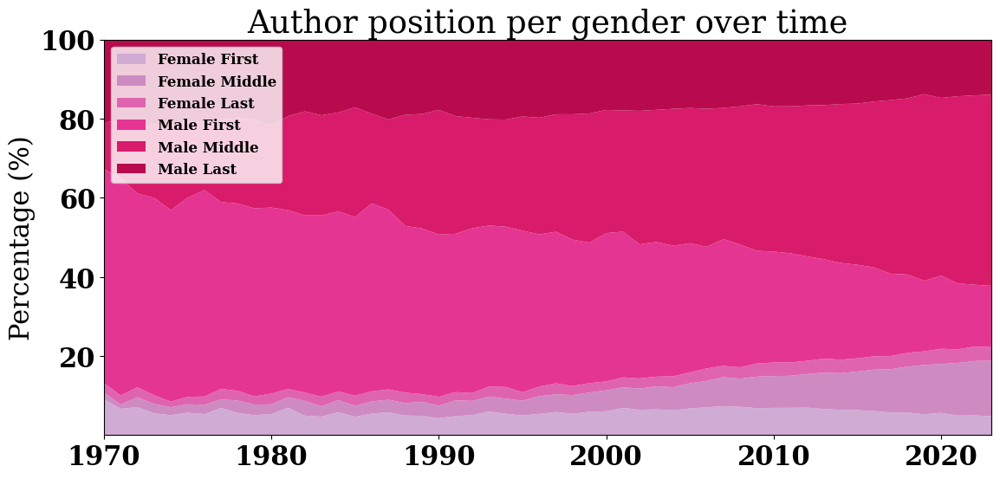

In [891]:
# libraries
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
 
# Make data
data = pd.DataFrame({'female_first':author_position_year_binary[author_position_year_binary['author_position'] == 'first'].female.squeeze().values, 
                     'female_middle':author_position_year_binary[author_position_year_binary['author_position'] == 'middle'].female.squeeze().values, 
                     'female_last':author_position_year_binary[author_position_year_binary['author_position'] == 'last'].female.squeeze().values,
                    'male_first':author_position_year_binary[author_position_year_binary['author_position'] == 'first'].male.squeeze().values,
                    'male_middle': author_position_year_binary[author_position_year_binary['author_position'] == 'middle'].male.squeeze().values,
                    'male_last': author_position_year_binary[author_position_year_binary['author_position'] == 'last'].male.squeeze().values
                    })
 
# We need to transform the data from raw data to percentage (fraction)
data_perc = data.divide(data.sum(axis=1), axis=0) *100
 
# Make the plot
plt.stackplot(range(0,54),  data_perc["female_first"],  data_perc["female_middle"],  data_perc["female_last"], data_perc["male_first"], data_perc["male_middle"], data_perc["male_last"], labels=['Female First','Female Middle','Female Last', 'Male First', 'Male Middle', 'Male Last'])
plt.legend(loc='upper left', fontsize=12)
plt.margins(0,0)
plt.title('Author position per gender over time')
plt.ylabel('Percentage (%)')
plt.xticks(np.arange(0,60,10), np.arange(1970,2030,10).astype(str))
loc, label = plt.yticks()
plt.yticks(loc[1::], label[1::])

save_name = 'publication_rate_all_stacked'
save_path = f'Plots/{date.today()}/{save_name}'
plt.savefig(save_path)

plt.show()

In [888]:
len()

6

In [887]:
len()

6

In [839]:
#how long is the year span that they publish within? 

def calculate_year_span_and_publications(df):
    """
    Calculate the year span and total publications for each author.

    Parameters:
    - df (pd.DataFrame): The input DataFrame.

    Returns:
    - pd.DataFrame: A DataFrame with 'author_id', 'predicted_gender', 'min_year', 'max_year', 'year_span', and 'total_publications' columns.
    """
    # Group by 'author_id' and calculate min, max, and year span
    result_df = df.groupby('author_id').agg(
        binary_gender=('binary_gender', 'first'),
        min_year=('publication_year', 'min'),
        max_year=('publication_year', 'max'),
        total_publications=('count', 'count')
    ).reset_index()

    result_df['year_span'] = result_df['max_year'] - result_df['min_year']
    result_df['publications_per_year']=result_df['total_publications']/result_df['year_span']
    result_df.replace([np.inf, -np.inf], 0, inplace=True)


    return result_df


In [840]:
publication_year_span = calculate_year_span_and_publications(article_author_data_final.groupby('author_id')[['publication_year','binary_gender']].value_counts().reset_index())
publication_year_span 

,author_id,binary_gender,min_year,max_year,total_publications,year_span,publications_per_year
0,https://openalex.org/A5000000046,male,2006,2006,1,0,0.000000
1,https://openalex.org/A5000000092,male,2014,2014,1,0,0.000000
2,https://openalex.org/A5000000199,female,2021,2021,1,0,0.000000
3,https://openalex.org/A5000000900,male,2019,2019,1,0,0.000000
4,https://openalex.org/A5000001262,male,2021,2021,1,0,0.000000
...,...,...,...,...,...,...,...
483752,https://openalex.org/A5093126499,male,2023,2023,1,0,0.000000
483753,https://openalex.org/A5093126708,male,2023,2023,1,0,0.000000
483754,https://openalex.org/A5093126709,male,2023,2023,1,0,0.000000
483755,https://openalex.org/A5093126710,female,2023,2023,1,0,0.000000


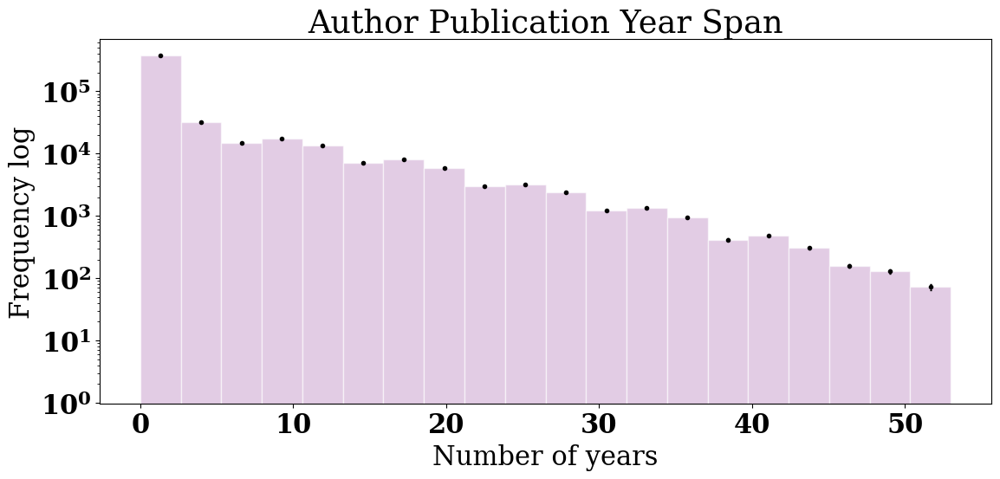

In [893]:
hist_plot([publication_year_span.year_span], N_bins=None, log=True, title='Author Publication Year Span', xlabel='Number of years', ylabel='Frequency log', save_name='publication_year_span', disp_legend=False)


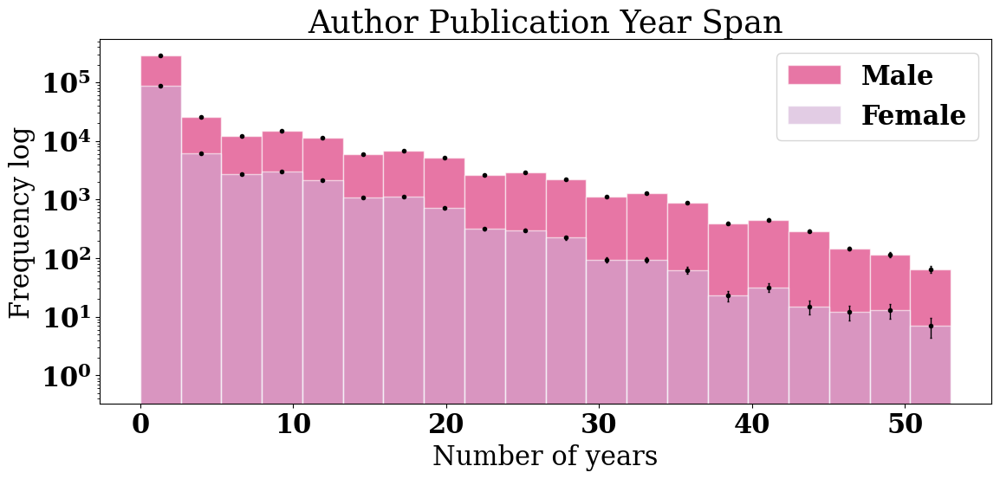

In [894]:
hist_plot([publication_year_span.groupby('binary_gender').get_group('male').year_span,
          publication_year_span.groupby('binary_gender').get_group('female').year_span], N_bins=None, log=True, title='Author Publication Year Span', xlabel='Number of years', ylabel='Frequency log', save_name='pub_year_span_gender', legend_labels=['Male', 'Female'], disp_legend=True)
#fix farverne på det her! 

In [844]:
def scatter_plot(x, y, title=None, xlabel=None, ylabel=None, label=None, font='font', xmargins=None, save_name=save_name):
    """
    Create a plot between two variables for two given lists of numbers.

    Parameters:
    - x (list): The input x data.
    - y (list): The input y data.
    - title (str): The title of the plot. Default is None.
    - xlabel (str): The label for the x-axis. Default is None.
    - ylabel(str): The label for the y-axis. Default is Frequncy.
    - font(str): font type. If Chinese letters then use: 'Heiti TC'. Default is 'font'.
    - xmargins (float): The margins for the x-axis. Default is None.
    - new_figure (bool): Whether to create a new figure or plot in the same figure. Default is True.

    Returns:
    - None
    """
    fig, ax = plt.subplots()
    ax.scatter(x, y, label=label)
    plt.margins(x=xmargins)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    if label != None:
        plt.legend()

    save_name=save_name
    save_path = f'Plots/{date.today()}/save_name'
    plt.savefig(save_path)

    plt.show()


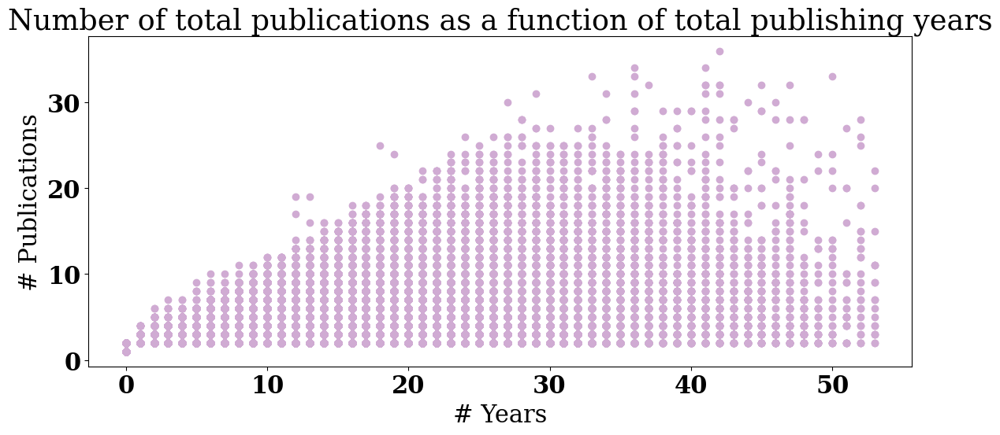

In [845]:
scatter_plot(publication_year_span.year_span, publication_year_span.total_publications, title='Number of total publications as a function of total publishing years', xlabel='# Years', ylabel='# Publications', label=None, font='font', xmargins=None)


In [846]:
testing=publication_year_span.groupby('year_span')['total_publications'].value_counts().reset_index()

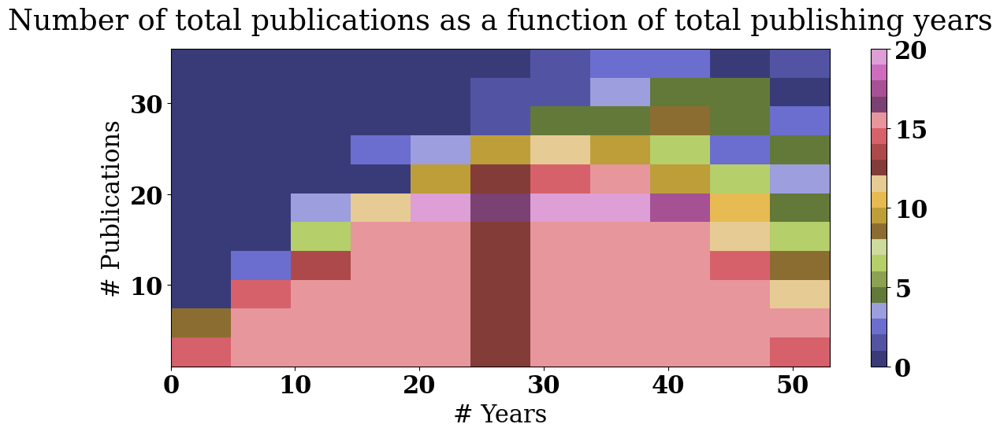

In [847]:
plt.hist2d(testing['year_span'], testing['total_publications'], bins=Sturges_bins(testing), cmap='tab20b')
#plt.xlim(0,5)
#plt.ylim(0,5)
plt.colorbar()
plt.xlabel('# Years')
plt.ylabel('# Publications')
plt.title('Number of total publications as a function of total publishing years', pad=18)
plt.savefig(f'Plots/{date.today()}/2dhist_publicationyears.png')
plt.show()

#work on this plot it looks really dumb 

In [848]:

def scatter_plot_compare(x, y, title=None, xlabel=None, ylabel=None, labels=None, font=None, xmargins=None, save_name=None):
    """
    Create a scatter plot for multiple datasets.

    Parameters:
    - x_list (list of lists): List of x data for each dataset.
    - y_list (list of lists): List of y data for each dataset.
    - titles (list): List of titles for each dataset. Default is None.
    - xlabels (list): List of x-axis labels for each dataset. Default is None.
    - ylabels (list): List of y-axis labels for each dataset. Default is None.
    - labels (list): List of legend labels for each dataset. Default is None.
    - font(str): Font type. If Chinese letters then use: 'Heiti TC'. Default is None.
    - xmargins (float): The margins for the x-axis. Default is None.
    - save_name (str): The name for saving the plot. Default is None.

    Returns:
    - None
    """
    fig, ax = plt.subplots()
    
    for x, y, label in zip(x, y, labels):
        ax.scatter(x, y, label=label)

    plt.margins(x=xmargins)
    plt.title(title if title else None)
    plt.xlabel(xlabel if xlabel else None)
    plt.ylabel(ylabel if ylabel else None) 
    if labels and len(labels) > 1:
        plt.legend()

    save_path = f'Plots/{date.today()}/{save_name}' if save_name else None
    plt.savefig(save_path)
    plt.show()



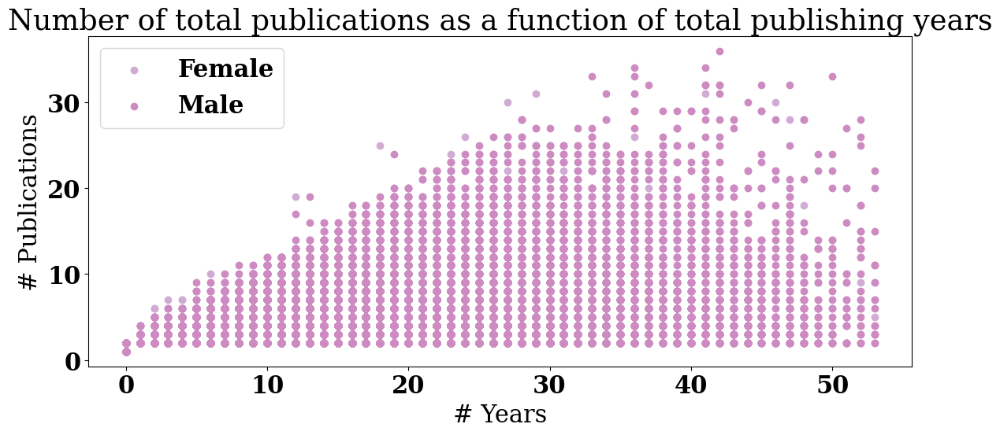

In [849]:
#scatter plot grouped by gender 
scatter_plot_compare(
    x=[publication_year_span.groupby('binary_gender').get_group('female').year_span, publication_year_span.groupby('binary_gender').get_group('male').year_span],
    y=[publication_year_span.groupby('binary_gender').get_group('female').total_publications, publication_year_span.groupby('binary_gender').get_group('male').total_publications],
    title="Number of total publications as a function of total publishing years",
    xlabel='# Years',
    ylabel='# Publications',
    labels=["Female", "Male"],
    save_name="save_name"
)

#also very ugly plot 

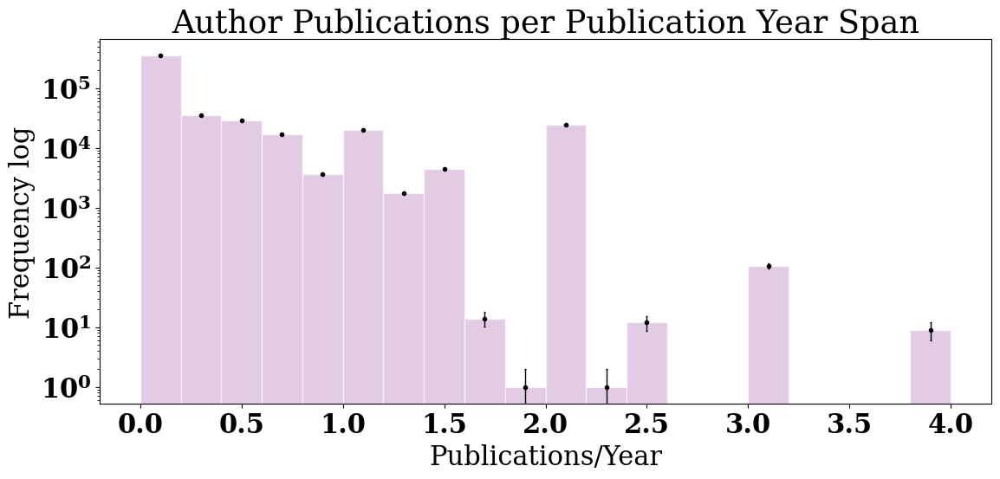

In [895]:
#calculate ratio per author and create new plot
hist_plot([publication_year_span.publications_per_year], N_bins=None, log=True, title='Author Publications per Publication Year Span', xlabel='Publications/Year', ylabel='Frequency log', save_name='pub_per_year', disp_legend=False)


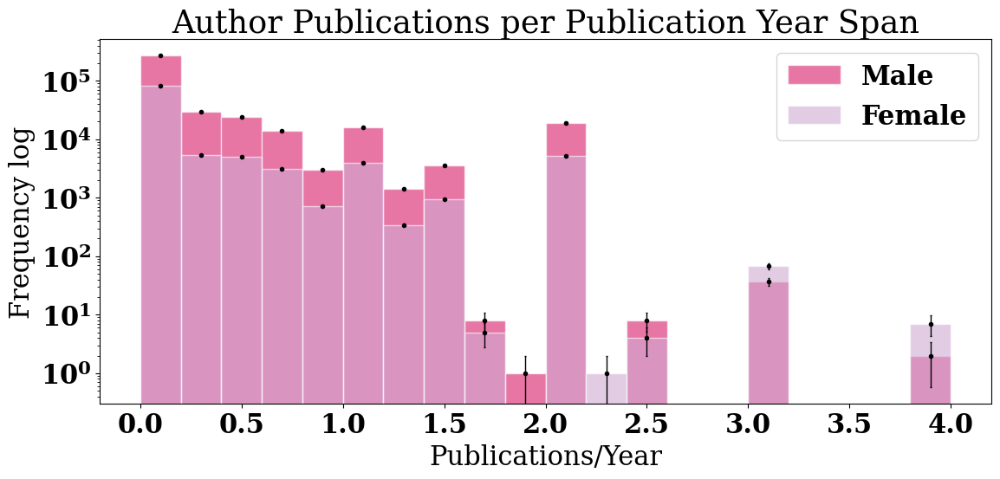

In [896]:
#calculate ratio per author and group by gender 
hist_plot([publication_year_span.groupby('binary_gender').get_group('male').publications_per_year,
          publication_year_span.groupby('binary_gender').get_group('female').publications_per_year], N_bins=None, log=True, title='Author Publications per Publication Year Span', xlabel='Publications/Year', ylabel='Frequency log', save_name='pub_per_year_gender', legend_labels=['Male', 'Female'], disp_legend=True)


In [ ]:

def cat_value_plot(data, title=None, xlabel=None, ylabel='Frequency', norm=False, multiply=1, font=None, rot=0, xmargins=None, save_name=None, legend_labels=None):
    """
    Create a categorical plot for a given DataFrame column.

    Parameters:
    - data (pd.DataFrame): The input DataFrame column.
    - top_n (int): The number of top categories to display. Default is 10.
    - title (str): The title of the plot. Default is None.
    - xlabel (str): The label for the x-axis. Default is None.
    - ylabel(str): The label for the y-axis. Default is Frequncy.
    - norm(True/False): Whether to normalize data or not. Default is False.
    - multiply(int): Multiply data to achieve percentage. This should be 100 if norm=True. Default is 1.
    - rot(int): Rotation scale of x-tick-labels. Default is 0.
    - font(str): Font type. If Chinese letters, use: 'Heiti TC'. Default is None.
    - xmargins (int): The size of the x-margins. Default is None.

    Returns:
    - None
    """
    
    value_counts = data.value_counts(normalize=norm).mul(multiply).reset_index()[0:top_n]
    count_n = data.value_counts().reset_index()
    count_n = count_n.iloc[:, 1]
    count = value_counts.iloc[:, 1]
    cats = data.iloc[:, 0][0:top_n]
    count= data.iloc[:, 1][0:top_n]

    # Create short versions of journal names for x-ticks
    short_names = short_names

    #create legend labels
    if legend_labels is None:
        legend_labels = [f'{short_names[i]}: {cats[i]}' for i in range(len(cats))]

    #create colors 
    num_colors = len(short_names)+3
    cmap = plt.get_cmap('PuRd')
    purd_colors = [cmap(i / num_colors) for i in range(num_colors)]

    # Create plot
    fig, ax = plt.subplots()
    bars = ax.bar(short_names, count, width=0.8, alpha=0.6, edgecolor='white',color=purd_colors[3::], label=legend_labels)

    # Add text on top of each bar if the number of bars is 5 or less
    if len(bars) <= 5:
        for i, bar in enumerate(bars):
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width() / 2, height, f'N={count_n.iloc[i]}', ha='center', va='bottom', color='black', fontsize=12)

    # Add text in the center of each bar if the bar percentage count is 2 percent or more and we have less than 10 categories
    for cat, short_name, c in zip(cats, short_names, count):
        if top_n <= 10 and c >= 2:
            ax.text(short_name, c / 2, f'{c:.1f}', ha='center', va='center', color='white', fontsize=12)

    plt.xticks(short_names, font=font, size=10, rotation=rot)
    plt.margins(x=xmargins)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend(title=None, fontsize=8, loc="upper right")

    save_name = save_name
    save_path = f'Plots/{date.today()}/{save_name}'
    plt.savefig(save_path)

    plt.show()


In [ ]:
cat_value_top_plot_short_names(article_author_data_final.drop_duplicates(subset=['journal_name'], keep='first')[['journal_name', 'JIF']].dropna(), top_n=10, title='Top 10 JIF Scoring Journals', xlabel='Journal Name', ylabel='Journal Impact Factor (JIF)', norm=False, multiply=1, font=None, rot=0, xmargins=None, save_name=save_name, legend_labels=np.array(data_cats), short_names=short_names)


# Impact factor 

In [858]:
save_name='impact_factor'

In [859]:
jif=pd.read_csv('Data backup/jif_data.csv')

In [860]:
jif=jif.drop(columns={'Unnamed: 0', 'ISSN'})

In [861]:
#merge jif on our data 
jif

,JIF,journal_name
0,NaN,Physics Bulletin
1,NaN,Physica status solidi
2,1.3,physica status solidi (b) basic solid state ph...
3,0.9,American Journal of Physics
4,4.7,The Astrophysical Journal
...,...,...
2687,7.4,Blood Reviews
2688,NaN,Fifth Australia-New Zealand Conference on Geom...
2689,4.6,Development
2690,NaN,Environmental technology letters


In [862]:
article_author_data_final=pd.merge(article_author_data_final, jif, on='journal_name', how='left')

In [863]:
article_author_data_final['JIF'].mean()

4.967269898984008

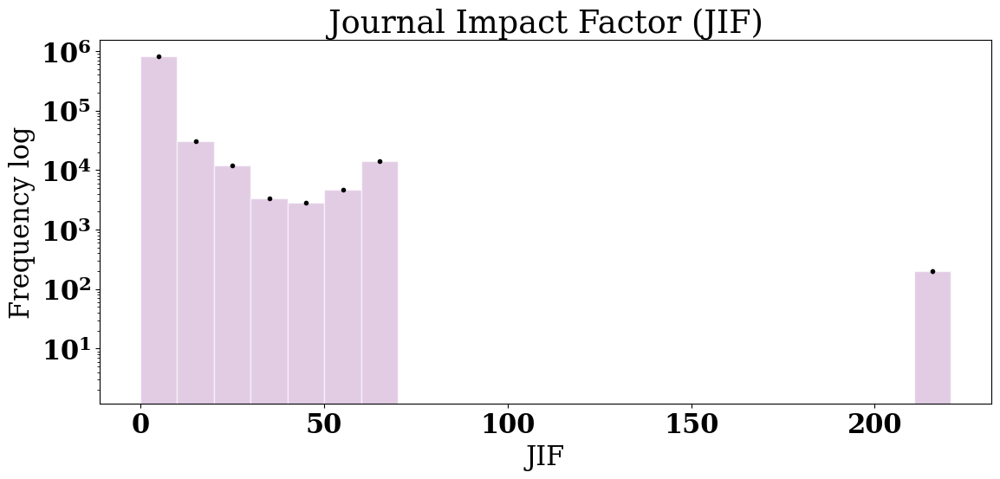

In [908]:
hist_plot([article_author_data_final.JIF], N_bins=None, log=True, title='Journal Impact Factor (JIF)', xlabel='JIF', ylabel='Frequency log', xmargins=None, save_name='impact_factor_all', legend_labels=None, disp_legend=False)


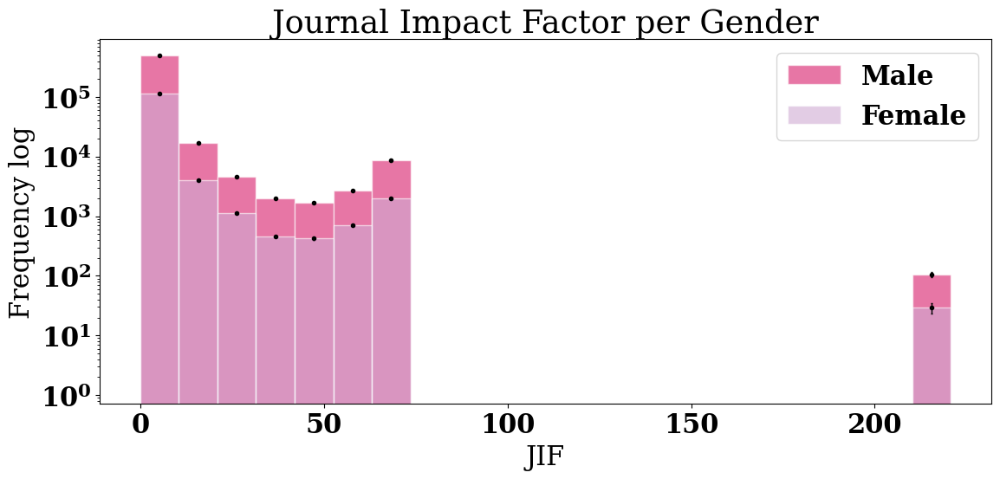

In [909]:
hist_plot([article_author_data_final.groupby('binary_gender').get_group('male')['JIF'],
           article_author_data_final.groupby('binary_gender').get_group('female')['JIF']], N_bins=None, log=True, title='Journal Impact Factor per Gender', xlabel='JIF', ylabel='Frequency log', save_name='impact_factor_all_gender', legend_labels=['Male','Female'], disp_legend=True)


In [866]:
#top JIF scoring journal

In [948]:
#define short names outside plotting function 
data_cats=article_author_data_final.drop_duplicates(subset=['journal_name'], keep='first')[['journal_name', 'JIF']].dropna()
data_cats=data_cats.sort_values(by='JIF', ascending=False).iloc[:, 0][0:10]
data_cats_labels=data_cats.reset_index()

excluded_words = ['THE', 'AND', 'OF', 'FOR']
short_names = []

def extract_first_letters(words):
    short_name = ''
    skip_next = False
    
    for word in words:
        if skip_next:
            skip_next = ')' not in word
        elif '(' in word:
            skip_next = ')' not in word
        else:
            short_name += word[0]

    return short_name

for cat in data_cats:
    words = [word.upper() for word in cat.split() if word.upper() not in excluded_words]
    unique_short_name = extract_first_letters(words)
    
    # Check for duplicates and add a unique identifier
    count = short_names.count(unique_short_name)
    if count > 0:
        unique_short_name += str(count + 1)
    
    short_names.append(unique_short_name)

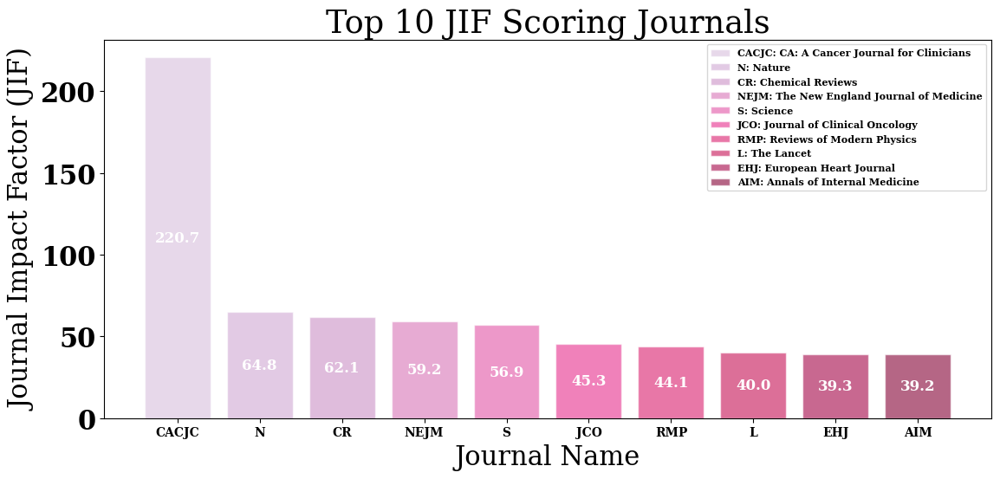

In [955]:
cat_value_top_plot_short_names(article_author_data_final.drop_duplicates(subset=['journal_name'], keep='first')[['journal_name', 'JIF']].dropna(), top_n=10, title='Top 10 JIF Scoring Journals', xlabel='Journal Name', ylabel='Journal Impact Factor (JIF)', norm=False, multiply=1, font=None, rot=0, xmargins=None, save_name='top10jif', legend_labels=np.array([f'{short_names[i]}: {data_cats_labels.journal_name[i]}' for i in range(len(data_cats_labels))]), short_names=short_names)


In [869]:
#top 20 appearing journals with their corresponding JIF score 

In [870]:
short_names = [] 

def cat_top_plot_short_names(data, top_n=10, title=None, xlabel=None, ylabel='Frequency', norm=False, multiply=1, font=None, rot=0, xmargins=None, save_name=None, legend_labels=None, short_names=short_names):
    """
    Create a categorical plot for a given DataFrame column.

    Parameters:
    - data (pd.DataFrame): The input DataFrame column.
    - top_n (int): The number of top categories to display. Default is 10.
    - title (str): The title of the plot. Default is None.
    - xlabel (str): The label for the x-axis. Default is None.
    - ylabel(str): The label for the y-axis. Default is Frequncy.
    - norm(True/False): Whether to normalize data or not. Default is False.
    - multiply(int): Multiply data to achieve percentage. This should be 100 if norm=True. Default is 1.
    - rot(int): Rotation scale of x-tick-labels. Default is 0.
    - font(str): Font type. If Chinese letters, use: 'Heiti TC'. Default is None.
    - xmargins (int): The size of the x-margins. Default is None.

    Returns:
    - None
    """
    
    # count the number and/or percentage within each category and set the top categories
    top_n = top_n
    value_counts = data.value_counts(normalize=norm).mul(multiply).reset_index()[0:top_n]
    count_n = data.value_counts().reset_index()
    count_n = count_n.iloc[:, 1]
    count = value_counts.iloc[:, 1]
    cats = value_counts.iloc[:, 0]

    # Create short versions of journal names for x-ticks
    short_names = short_names

    #create legend labels
    if legend_labels is None:
        legend_labels = [f'{short_names[i]}: {cats[i]}' for i in range(len(cats))]

    #create colors 
    num_colors = len(short_names)+3
    cmap = plt.get_cmap('PuRd')
    purd_colors = [cmap(i / num_colors) for i in range(num_colors)]

    # Create plot
    fig, ax = plt.subplots()
    bars = ax.bar(short_names, count, width=0.8, alpha=0.6, edgecolor='white',color=purd_colors[3::], label=legend_labels)

    # Add text on top of each bar if the number of bars is 5 or less
    if len(bars) <= 5:
        for i, bar in enumerate(bars):
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width() / 2, height, f'N={count_n.iloc[i]}', ha='center', va='bottom', color='black', fontsize=12)

    # Add text in the center of each bar if the bar percentage count is 2 percent or more and we have less than 10 categories
    for cat, short_name, c in zip(cats, short_names, count):
        if top_n <= 10 and c >= 2:
            ax.text(short_name, c / 2, f'{c:.1f}%', ha='center', va='center', color='white', fontsize=12)

    plt.xticks(short_names, font=font, size=10, rotation=rot)
    plt.margins(x=xmargins)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend(title=None, fontsize=8, loc="upper right")

    save_name = save_name
    save_path = f'Plots/{date.today()}/{save_name}{data.name}'
    plt.savefig(save_path)

    plt.show()


In [871]:
#define short names outside plotting function 
data_cats=article_author_data_final.drop_duplicates(subset=['article_id'], keep='first').journal_name.value_counts().reset_index()[0:20]
data_cats = data_cats.iloc[:, 0]

excluded_words = ['THE', 'AND', 'OF', 'FOR']
short_names = []

def extract_first_letters(words):
    short_name = ''
    skip_next = False
    
    for word in words:
        if skip_next:
            skip_next = ')' not in word
        elif '(' in word:
            skip_next = ')' not in word
        else:
            short_name += word[0]

    return short_name

for cat in data_cats:
    words = [word.upper() for word in cat.split() if word.upper() not in excluded_words]
    unique_short_name = extract_first_letters(words)
    
    # Check for duplicates and add a unique identifier
    count = short_names.count(unique_short_name)
    if count > 0:
        unique_short_name += str(count + 1)
    
    short_names.append(unique_short_name)

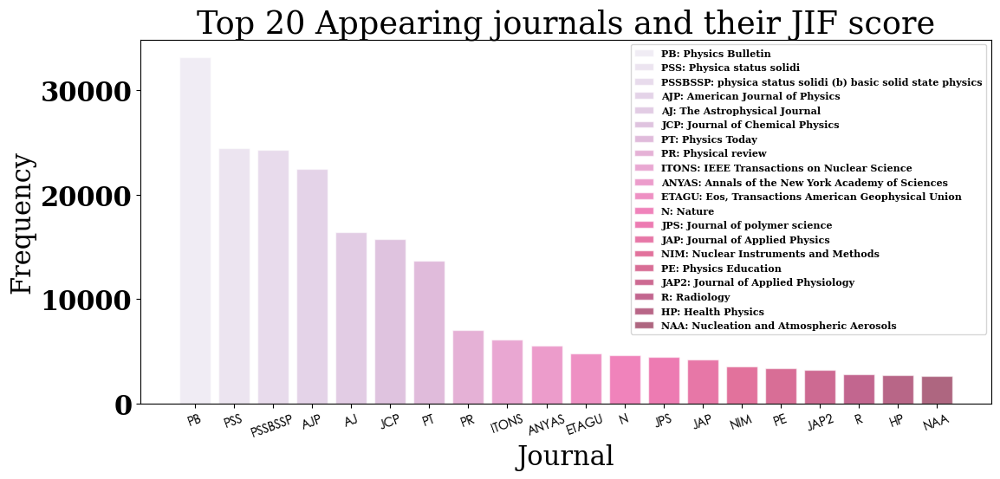

In [872]:
cat_top_plot_short_names(article_author_data_final.drop_duplicates(subset=['article_id'], keep='first').journal_name, top_n=20, title='Top 20 Appearing journals and their JIF score', xlabel='Journal', ylabel='Frequency', norm=False, multiply=1, font='Heiti TC', rot=20,save_name=save_name, short_names=short_names)


In [873]:
import matplotlib.pyplot as plt
import pandas as pd

def test_func(data, jif_data, top_n=10, title=None, xlabel=None, ylabel='Frequency', ylabel2='Score', norm=False, multiply=1, font=None, rot=0, xmargins=None, save_name=None, legend_labels=None, short_names=short_names):
    """
    Create a categorical plot for a given DataFrame column.

    Parameters:
    - data (pd.DataFrame): The input DataFrame column.
    - jif_data (pd.Series): The Journal Impact Factor (JIF) data for each journal.
    - top_n (int): The number of top categories to display. Default is 10.
    - title (str): The title of the plot. Default is None.
    - xlabel (str): The label for the x-axis. Default is None.
    - ylabel(str): The label for the y-axis. Default is Frequncy.
    - norm(True/False): Whether to normalize data or not. Default is False.
    - multiply(int): Multiply data to achieve percentage. This should be 100 if norm=True. Default is 1.
    - rot(int): Rotation scale of x-tick-labels. Default is 0.
    - font(str): Font type. If Chinese letters, use: 'Heiti TC'. Default is None.
    - xmargins (int): The size of the x-margins. Default is None.

    Returns:
    - None
    """
    
    # count the number and/or percentage within each category and set the top categories
    top_n = top_n
    value_counts = data.value_counts(normalize=norm).mul(multiply).reset_index()[0:top_n]
    count_n = data.value_counts().reset_index()
    count_n = count_n.iloc[:, 1]
    count = value_counts.iloc[:, 1]
    cats = value_counts.iloc[:, 0]
    jif = jif_data['JIF'][jif_data['journal_name'].isin(np.array(cats))]

    # Create short versions of journal names for x-ticks
    short_names = short_names

    #create legend labels
    if legend_labels is None:
        legend_labels = [f'{short_names[i]}: {cats[i]}' for i in range(len(cats))]

    #create colors 
    num_colors = len(short_names)+3
    cmap = plt.get_cmap('PuRd')
    purd_colors = [cmap(i / num_colors) for i in range(num_colors)]

    # Create plot
    fig, ax = plt.subplots()
    bars = ax.bar(short_names, count, width=0.8, alpha=0.6, edgecolor='white',color=purd_colors[3::], label=legend_labels)

    # Add text on top of each bar if the number of bars is 5 or less
    if len(bars) <= 5:
        for i, bar in enumerate(bars):
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width() / 2, height, f'N={count_n.iloc[i]}', ha='center', va='bottom', color='black', fontsize=12)

    # Add text in the center of each bar if the bar percentage count is 2 percent or more and we have less than 10 categories
    for cat, short_name, c in zip(cats, short_names, count):
        if top_n <= 10 and c >= 2:
            ax.text(short_name, c / 2, f'{c:.1f}%', ha='center', va='center', color='white', fontsize=12)

    plt.xticks(short_names, font=font, size=10, rotation=rot)

    # Create secondary y-axis for JIF
    ax2 = ax.twinx()
    ax2.scatter(short_names, jif, color='tab:purple', marker='o', s=45, label='JIF')

    plt.margins(x=xmargins)
    plt.title(title)
    plt.xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax2.set_ylabel(ylabel2)
    ax.legend(title=None, fontsize=8, loc="upper right")
    ax2.legend(fontsize=8, loc="upper left")

    save_name = save_name
    save_path = f'Plots/{date.today()}/{save_name}{data.name}'
    plt.savefig(save_path)

    plt.show()


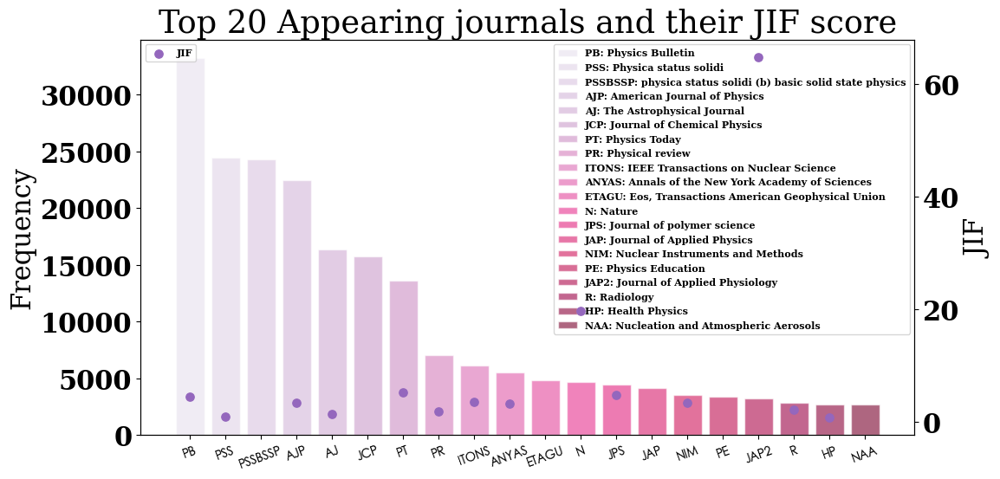

In [874]:
test_func(article_author_data_final.drop_duplicates(subset=['article_id'], keep='first').journal_name, article_author_data_final.drop_duplicates(subset=['journal_name'], keep='first'), top_n=20, title='Top 20 Appearing journals and their JIF score', xlabel='Journal', ylabel='Frequency', ylabel2='JIF', norm=False, multiply=1, font='Heiti TC', rot=20,save_name=save_name, short_names=short_names)

#add black X if JIF is Nan? and add JIF legend? 

In [875]:
import matplotlib.pyplot as plt
import pandas as pd

def test_func(data, jif_data, top_n=10, title=None, xlabel=None, ylabel='Frequency', ylabel2='Score', norm=False, multiply=1, font=None, rot=0, xmargins=None, save_name=None, legend_labels=None, short_names=short_names):
    """
    Create a categorical plot for a given DataFrame column.

    Parameters:
    - data (pd.DataFrame): The input DataFrame column.
    - jif_data (pd.Series): The Journal Impact Factor (JIF) data for each journal.
    - top_n (int): The number of top categories to display. Default is 10.
    - title (str): The title of the plot. Default is None.
    - xlabel (str): The label for the x-axis. Default is None.
    - ylabel(str): The label for the y-axis. Default is Frequncy.
    - norm(True/False): Whether to normalize data or not. Default is False.
    - multiply(int): Multiply data to achieve percentage. This should be 100 if norm=True. Default is 1.
    - rot(int): Rotation scale of x-tick-labels. Default is 0.
    - font(str): Font type. If Chinese letters, use: 'Heiti TC'. Default is None.
    - xmargins (int): The size of the x-margins. Default is None.

    Returns:
    - None
    """
    
    # count the number and/or percentage within each category and set the top categorie
    top_n = top_n
    value_counts = data.value_counts(normalize=norm).mul(multiply).reset_index()[0:top_n]
    count_n = data.value_counts().reset_index()
    count_n = count_n.iloc[:, 1]
    count = value_counts.iloc[:, 1]
    cats = value_counts.iloc[:, 0]
    jif = jif_data['JIF'][jif_data['journal_name'].isin(np.array(cats))]

    # Create short versions of journal names for x-ticks
    short_names = short_names

    #create legend labels
    if legend_labels is None:
        legend_labels = [f'{short_names[i]}: {cats[i]}' for i in range(len(cats))]

    #create colors 
    num_colors = len(short_names)+3
    cmap = plt.get_cmap('PuRd')
    purd_colors = [cmap(i / num_colors) for i in range(num_colors)]

    # Create plot
    fig, ax2 = plt.subplots()

    ax2.scatter(short_names, jif, color='tab:purple', marker='o', s=45, label='JIF')
    plt.xticks(short_names, font=font, size=10, rotation=rot)


    ax = ax2.twinx()
    bars = ax.bar(short_names, count, width=0.8, alpha=0.6, edgecolor='white',color=purd_colors[3::], label=legend_labels)

    # Add text on top of each bar if the number of bars is 5 or less
    if len(bars) <= 5:
        for i, bar in enumerate(bars):
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width() / 2, height, f'N={count_n.iloc[i]}', ha='center', va='bottom', color='black', fontsize=12)

    # Add text in the center of each bar if the bar percentage count is 2 percent or more and we have less than 10 categories
    for cat, short_name, c in zip(cats, short_names, count):
        if top_n <= 10 and c >= 2:
            ax.text(short_name, c / 2, f'{c:.1f}%', ha='center', va='center', color='white', fontsize=12)


    plt.margins(x=xmargins)
    plt.title(title)
    plt.xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax2.set_ylabel(ylabel2)
    ax.legend(title=None, fontsize=8, loc="upper right")
    ax2.legend(fontsize=8, loc="upper left")

    save_name = save_name
    save_path = f'Plots/{date.today()}/{save_name}{data.name}'
    plt.savefig(save_path)

    plt.show()


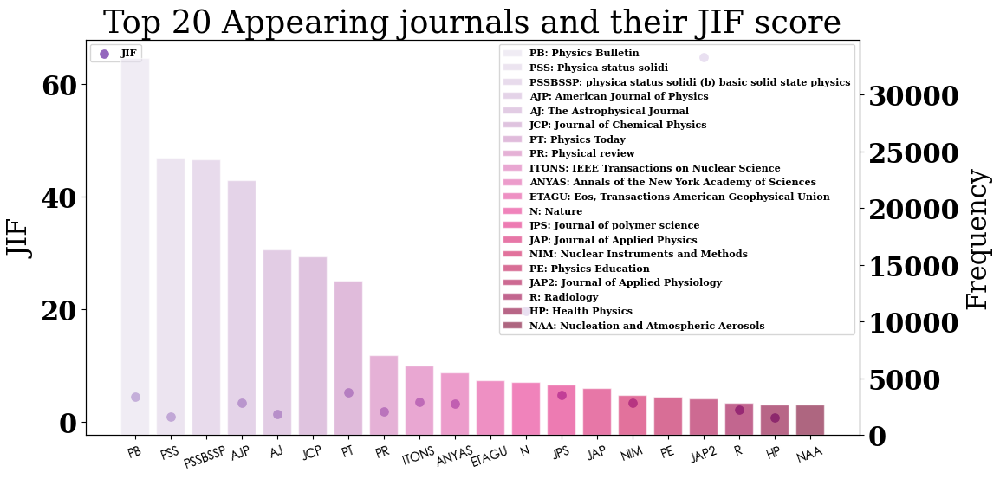

In [876]:
test_func(article_author_data_final.drop_duplicates(subset=['article_id'], keep='first').journal_name, article_author_data_final.drop_duplicates(subset=['journal_name'], keep='first'), top_n=20, title='Top 20 Appearing journals and their JIF score', xlabel='Journal', ylabel='Frequency', ylabel2='JIF', norm=False, multiply=1, font='Heiti TC', rot=20,save_name=save_name, short_names=short_names)


# Topic model 

In [2658]:
text_data=article_author_data_final.drop_duplicates(subset=['article_id'], keep='first')[['article_id', 'journal_name', 'title', 'abstract']]

## Clean abstract data

In [2659]:
text_data['abstract_clean']=text_data['abstract']

In [2199]:
pd.options.display.max_colwidth=None
#check text data of an abstract sample to get an idea of stopwords to consider 
abstract_sample=text_data.abstract.sample(100)
abstract_sample

787452                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   Semiconductor microcavity polar

In [2200]:
#seems like there is something with chinese letters that we need to take into account 
# preindicator like "article", "paper" or "abstract" also seems to appear 
#links to doi are also appearing and potentially github links 
#list of author names
#list of journal name
#publication year and month (and date) 
#vol and issue and pages description also seems to appear 
#Keywords may appear as well - if keywords appear this should be where to end the abstract - maybe we can use keywords to split abstract first
#Publication/Published/Published Online seem to appear similarly listing all the Publication info 
#also Latex langauge like $$\overline{\mathrm{MS}}$$ 
#they also mention the country that the studies are made in- do we want to leave country names out or not? 
#generally headliners seems to appear as well such as "abstract" "introduction:" "background:" "results:" "conclusion:" etc. 
#sometimes also references appear 

### Links

In [2201]:
#let's first check the cases of links in the abstract
links_abstract=[]

for abstract in text_data['abstract_clean']:
    if 'https' in abstract:
        links_abstract.append(abstract)
        

In [2202]:
len(links_abstract)

26504

In [2203]:
def remove_links(text):
    # Define a pattern to match URLs
    url_pattern = re.compile(r'https?://\S+')

    # Use the pattern to find all URLs in the text
    matches = re.findall(url_pattern, text)

    # Replace each URL with an empty string
    for match in matches:
        text = text.replace(match, '')

    return text



In [2204]:
text_data['abstract_clean'] = text_data['abstract_clean'].apply(remove_links)


In [2205]:
#let's check number of links after the update 
links_abstract_updated=[]

for abstract in text_data['abstract_clean']:
    if 'https' in abstract:
        links_abstract_updated.append(abstract)
        

In [2206]:
len(links_abstract_updated)

118

In [2207]:
links_abstract_updated #there is very few instances of https and URL left so maybe just add them as stopwords 

['PreviousNext No AccessSymposium on the Application of Geophysics to Engineering and Environmental Problems 2007Summary of New Developments in TDR for SoilsAuthors: Vincent P. DrnevichPE, PhDRobert L. NowackPhDVincent P. DrnevichSchool of Civil Engineering, Purdue University, West Lafayette, Indiana 47907Search for more papers by this author and Robert L. NowackDept. of Earth and Atmospheric Sciences, Purdue University, West Lafayette, Indiana 47907Search for more papers by this author SectionsAboutPDF/ePub ToolsAdd to favoritesDownload CitationsTrack CitationsPermissions ShareFacebookTwitterLinked InRedditEmail Abstract Time Domain Reflectometry (TDR) is a method to determine the electromagnetic properties of soils and recent research indicates that TDR is an increasingly powerful tool to assess the engineering properties of soils. There were symposia and workshops on this topic held in 1994 and 2001 at Northwestern University and one in September 2006 at Purdue University. The autho

### Keywords

In [2208]:
#let's check for keywords 
keywords_abstract=[]

for abstract in text_data['abstract_clean']:
    if 'keywords' in abstract:
        keywords_abstract.append(abstract)
        

In [2209]:
len(keywords_abstract)

305

In [2210]:
keywords_abstract #hmm sometimes keywords just appear in the middle of text- however it is only 305 texts so maybe 
#it is not even necessary to clean on keywords. Let's instead search for keywords: so this shouldn't be part of the text

['Two computerized data bases are compared. SPIN, from AIP publishes each month up to 2000 abstracts of papers from about 70 journals in the field of Physics. CA Condensates offers each week about 6000 titles of papers, with keywords but no abstracts. This represents ambitiously the whole world production in the field of chemistry. As chemistry is understood very broadly by CAS editors, a part of physics is also covered. This paper attempts to state if this part is large or not. The potential contents of SPIN for January 1971 is checked in Chemical Abstracts Index 1971. The average overlap of the two bases for the 70 Physics journals considered is 76 per cent. Some fields are almost entirely covered by CAC as atomic and molecular physics, solid state physics, nuclear physics. …. Other fields are poorly covered : they are astrophysics (except spectroscopy), acoustics, geophysics …. SPIN coverage is unfortunately limited and moreover the total overlap between the two bases is too large. 

In [2211]:
#let's check for keywords 
keywords_abstract=[]

for abstract in text_data['abstract_clean']:
    if 'keywords:' in abstract:
        keywords_abstract.append(abstract)
        

In [2212]:
len(keywords_abstract)

27

In [2213]:
keywords_abstract #all keywords: or Inspec keywords: but maybe it's fine that they are there 
#most appears at the end of text except two that are part of a sentence in abstract
#we leave the keywords texts as they are for now especially since it is only 27 cases 

['Abstract : Nuclear reactors have been a reliable energy source for many years. Commercial nuclear power plants have an unparalleled safety record. In fact, no power plants of conventional nature such as coal, petroleum, or hydroelectric have a better safety record. Nuclear plants are virtually pollution-free. But perhaps their biggest attractive feature is fuel economy. Only a hydroelectric power plant has a clear cut lead on fuel cost, but they are restricted geographically to sufficient waterways that support them. These reasons, and many more, make nuclear reactors technically attractive as an energy source. It is the purpose of this paper to summarize some basic reactor physics along with a simple description of different reactor types and their designs. This will yield some insight as to the technology and feasibility of nuclear reactors as power generators without imposing too much technical detail. When the facts are weighed against preconceived notions, nuclear energy is seen

### Copyright

In [2214]:
#let's check for copyright
copyright_abstract=[]

for abstract in text_data['abstract_clean']:
    if '©' in abstract:
        copyright_abstract.append(abstract)
        

In [2215]:
len(copyright_abstract)

10646

In [2216]:
copyright_abstract # they seem to appear at the end of text in most cases 

['Previous article Next article Leibniz Rule for Fractional Derivatives Generalized and an Application to Infinite SeriesThomas J. OslerThomas J. Osler ToolsAdd to favoritesExport CitationTrack CitationsEmail SectionsAbout[1] M. A. Bassam, Some properties of Holmgren-Riesz transform, Ann. Scuola Norm. Sup. Pisa (3), 15 (1961), 1–24 MR0130538 (24:A398) 0099.31402 Google Scholar[2] Arthur Erdélyi, , Wilhelm Magnus, , Fritz Oberhettinger and , Francesco G. Tricomi, Higher transcendental functions. Vol. I, McGraw-Hill Book Company, Inc., New York-Toronto-London, 1953xxvi+302 MR0058756 (15,419i) 0051.30303 Google Scholar[3] Arthur Erdélyi, , Wilhelm Magnus, , Fritz Oberhettinger and , Francesco G. Tricomi, Higher transcendental functions. Vol. II, McGraw-Hill Book Company, Inc., New York-Toronto-London, 1953xvii+396 MR0058756 (15,419i) 0052.29502 Google Scholar[4] Arthur Erdélyi, , Wilhelm Magnus, , Fritz Oberhettinger and , Francesco G. Tricomi, Higher transcendental functions. Vol. III, M

In [2219]:
copyright_text_data=text_data['abstract_clean'][text_data['abstract_clean'].isin(copyright_abstract)]

In [2220]:
#we can now clean all abstract that include copyright but not at first few words
def clean_abstract_from_copyright(text):
    # Case-insensitive search for the first occurrence of "references"
    match = re.search(r'(?i)©', text)
    
    if match and match.start() > 20:
        # If a match is found and it's not the first word, remove everything from that point onward
        return text[:match.start()].strip()
    else:
        # If no match is found or it's the first word, return the original text
        return text

In [2221]:
text_data['abstract_clean'][text_data['abstract_clean'].isin(copyright_abstract)] = text_data['abstract_clean'][text_data['abstract_clean'].isin(copyright_abstract)].apply(clean_abstract_from_copyright)


In [2222]:
#let's check for copyright
copyright_abstract_clean=[]

for abstract in text_data['abstract_clean']:
    if '©' in abstract:
        copyright_abstract_clean.append(abstract)
        

In [2223]:
len(copyright_abstract_clean)

38

In [2224]:
copyright_abstract_clean #for the remaining we remove the introductory text

['©1997 American Institute of Physics. The electronic version of this article is the complete one and can be found online at: ',
 '©2000 American Institute of Physics. The electronic version of this article is the complete one and can be found online at: ',
 '© 2004 American Institute of Physics. This paper was published in Applied Physics Letters and is made available as an electronic reprint (preprint) with permission of American Institute of Physics. The paper can be found at: [DOI:  One print or electronic copy may be made for personal use only. Systematic or multiple reproduction, distribution to multiple locations via electronic or other means, duplication of any material in this paper for a fee or for commercial purposes, or modification of the content of the paper is prohibited and is subject to penalties under law.',
 'Page 10 © 2006 Illinois State University Physics Dept. Many of the 42 Modeling Method physics teachers involved in the Chicago ITQ Science Project over the past

In [2225]:
#we remove the introductory text including copyright after investegating the above
def remove_introductory_text(text):
    # Check for the first occurrence of words (case-sensitive)
    match = re.search(r'\b(?:The|This|Many|String|Peter|We|There|Childbirth|Low|With|Improvements|It|NA62|GeN-FOAM|Prismatic|Refuges)\b', text)
    
    if match:
        # If there is a match, remove the part up to the match
        return text[match.start():].strip()
    else:
        # If no match, return an empty string
        return ''

In [2226]:
text_data['abstract_clean'][text_data['abstract_clean'].isin(copyright_abstract_clean)] = text_data['abstract_clean'][text_data['abstract_clean'].isin(copyright_abstract_clean)].apply(remove_introductory_text)


In [2227]:
#let's check for copyright final
copyright_abstract_final=[]

for abstract in text_data['abstract_clean']:
    if '©' in abstract:
        copyright_abstract_final.append(abstract)
        

In [2228]:
len(copyright_abstract_final)

2

In [2229]:
copyright_abstract_final #perfect 

['The Mathematica© software is a powerful tool to solve numerous problems in physics, essentially when the analytical solution is not possible. The channeling and related phenomena is just that case. Here we suggest to introduce a "standard" in calculations of channeling and related phenomena using Mathematica© software. The new computer code "Basic Channeling with Mathematica©" BCM-1.0, at the first stage, will include a set of packages to make symbolic calculation of the planar channeling phenomena.',
 'It is easy enough to recall a portrait of the professors smugly content in a ‘calm and confident aloofness’ (Gadamer), the dispirited students drowning ‘in a sea of boredom’ (Arendt), and their crowning achievement revealed to be either an ‘unspeakable triviality’ (William James) or ‘totally insignificant’ for the coming requirements of the age (Lukács).15 Yet, whatever the institutional reality, until this ‘movement’ in thought can be fully assimilated, what is truly at stake, in the

### Latex

In [ ]:
#scan for documents matching latex formats 

In [2356]:

def find_latex_matches(text):
    # Find $$ and their content
    matches = re.search(r'\$\$.*?\$\$', text) or re.search(r'\$.*?\$', text)

    # Find LaTeX commands like \text or \text{}
    matches = matches or re.search(r'\\[a-zA-Z]+\*?(\{.*?\})?', text)

    # Find references like [210]
    matches = matches or re.search(r'\[.*?\]', text)

    return bool(matches)



In [2357]:
latex_abstract = text_data[text_data['abstract_clean'].apply(find_latex_matches)]


In [2358]:
len(latex_abstract)

64309

In [2359]:
latex_abstract

article_id  \
21       https://openalex.org/W2131943432   
47       https://openalex.org/W1990035106   
50       https://openalex.org/W2035906688   
91       https://openalex.org/W2039236270   
94       https://openalex.org/W2041811691   
...                                   ...   
1471218  https://openalex.org/W4386812706   
1471237  https://openalex.org/W4386823675   
1471374  https://openalex.org/W4387004961   
1471496  https://openalex.org/W4387339091   
1471658  https://openalex.org/W4387643579   

                                         journal_name  \
21                    Computer Physics Communications   
47                      Journal of Applied Physiology   
50                                  Nuclear Physics A   
91                      Journal of Applied Physiology   
94                         British Journal of Surgery   
...                                               ...   
1471218                                        Unknow   
1471237                         Physica status solidi   
1471374                           Proceedings of SPIE   
1471496                                           pac   
1471658  Transactions of the American Nuclear Society   

                                                                                                            title  \
21                                                                     A multi-configuration Hartree-Fock program   
47                                       Predictions for High-Energy Elastic and Inelastic Scatterings inϕ3Theory   
50                      Leibniz Rule for Fractional Derivatives Generalized and an Application to Infinite Series   
91                                                                 Pseudoparabolic Partial Differential Equations   
94                                                                       On the 27-plet unitary symmetry operator   
...                                                                                                           ...   
1471218  On global wave height climatology and trends from multiplatform altimeter measurements and wave hindcast   
1471237                                   Dissipation wavenumber and regularity for electron magnetohydrodynamics   
1471374                         High-throughput screening of MXenes for hydrogen storage via graph neural network   
1471496                                           A static memory sparse spectral method for time-fractional PDEs   
1471658                    Demonstration of sub-micron UCN position resolution using room-temperature CMOS sensor   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        

In [2327]:
#strip text for latex commands and special characters 
def strip_latex(text):
    # Remove $$ and their content
    text = re.sub(r'\$\$.*?\$\$', '', text)
    text = re.sub(r'\$.*?\$', '', text)


    # Remove LaTeX commands like \text or \text{}
    text = re.sub(r'\\[a-zA-Z]+\*?(\{.*?\})?', '', text)

    # Remove leftover $ (if any)
    text = text.replace('$', '')

    # remove refrencee e.g. [210]
    text = re.sub(r'\[.*?\]', '', text)

    return text


In [2328]:
#sample to test function 

In [2329]:
latex_sample=text_data['abstract_clean'].loc[1208233]
latex_sample

"Time reversal symmetry breaking Weyl semimetals are unique among Weyl materials in allowing the minimal number of Weyl points, thus offering the clearest signatures of the associated physics. Here we present neutron diffraction, density-functional theory, and transport measurement results which indicate that ${\\mathrm{EuCd}}_{2}{\\mathrm{As}}_{2}$, under ambient field, strain, and pressure, is such a material with a single pair of Weyl points. Our work reveals a magnetic structure (magnetic space group $C{2}^{\\ensuremath{'}}/{m}^{\\ensuremath{'}}$) with Eu moments pointing along the [210] direction in plane and canted $\\ensuremath{\\sim}$ ${30}^{\\ensuremath{\\circ}}$ out of plane. Density functional theory calculations using this structure show that the observed canting drastically alters the relevant electronic bands, relative to the in-plane order, leading to a single set of well-defined Weyl points. Furthermore, we find the canting angle can tune the distance of the Weyl points

In [2330]:
latex_sample_stripped = strip_latex(latex_sample)
latex_sample_stripped

'Time reversal symmetry breaking Weyl semimetals are unique among Weyl materials in allowing the minimal number of Weyl points, thus offering the clearest signatures of the associated physics. Here we present neutron diffraction, density-functional theory, and transport measurement results which indicate that , under ambient field, strain, and pressure, is such a material with a single pair of Weyl points. Our work reveals a magnetic structure (magnetic space group ) with Eu moments pointing along the  direction in plane and canted   out of plane. Density functional theory calculations using this structure show that the observed canting drastically alters the relevant electronic bands, relative to the in-plane order, leading to a single set of well-defined Weyl points. Furthermore, we find the canting angle can tune the distance of the Weyl points above the Fermi level, with the smallest distance at low canting angles. Finally, transport measurements of the anomalous Hall effect and lo

In [2361]:
# apply on all latex containing abstracts 

In [2365]:
text_data['abstract_clean'][text_data['abstract_clean'].isin(latex_abstract['abstract_clean'])]=text_data['abstract_clean'][text_data['abstract_clean'].isin(latex_abstract['abstract_clean'])].apply(strip_latex)


In [2370]:
latex_abstract.index

Index([     21,      47,      50,      91,      94,     111,     123,     128,
           149,     152,
       ...
       1470337, 1470538, 1470634, 1471147, 1471187, 1471218, 1471237, 1471374,
       1471496, 1471658],
      dtype='int64', length=64309)

In [2386]:
latex_abstract['abstract_clean'].loc[152]

'We study in pure quantum electrodynamics the scattering amplitudes at infinite energy due to multiphoton exchange, with interactions among the exchange photons. Such processes, elastic or inelastic, lead to logarithmic dependence on $s$. The $\\mathrm{ln}s$ dependence is found to be associated with the invariance of subgraphs under a boost along the direction of the high-energy collision. Theoretically, our results lead towards a more efficient way of handling a large class of diagrams, and a better understanding of $j$-plane cut behavior. We speculate that several features of our results generalize to hadron physics. Among these are features in common with the limiting fragmentation hypothesis, and the appearance of pionization in a many-fireball structure. Finally, in the absence of radiative corrections, we demonstrate that the ${e}^{\\ensuremath{-}}$, ${e}^{\\ensuremath{\\mp}}$ elastic scattering amplitude can be expressed as an eikonal form, with $\\ensuremath{\\chi}(\\mathbf{b})

In [2387]:
text_data['abstract_clean'].loc[152] #it looks good 

'We study in pure quantum electrodynamics the scattering amplitudes at infinite energy due to multiphoton exchange, with interactions among the exchange photons. Such processes, elastic or inelastic, lead to logarithmic dependence on . The  dependence is found to be associated with the invariance of subgraphs under a boost along the direction of the high-energy collision. Theoretically, our results lead towards a more efficient way of handling a large class of diagrams, and a better understanding of -plane cut behavior. We speculate that several features of our results generalize to hadron physics. Among these are features in common with the limiting fragmentation hypothesis, and the appearance of pionization in a many-fireball structure. Finally, in the absence of radiative corrections, we demonstrate that the ,  elastic scattering amplitude can be expressed as an eikonal form, with  being generated by the sum of all connected pieces.'

## Sample text

In [2439]:
sample_text_data=text_data.loc[[9676, 464937]]

In [2440]:
sample_text_data

article_id                       journal_name  \
9676    https://openalex.org/W1978282676  - Official Conference Proceedings   
464937  https://openalex.org/W2434761910              Physica status solidi   

                                                                                                                                  title  \
9676      Longitudinal dissociation in the His bundle. Bundle branch block due to asynchronous conduction within the His bundle in man.   
464937  Use the subthreshold-current technique to separate radiation induced defects in gate controlled lateral pnp bipolar transistors   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

In [2493]:
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer
import gensim
from gensim.parsing.preprocessing import STOPWORDS

# Add custom stopwords to the NLTK set
custom_stopwords = set(["physics"]) # we need to update this 
nltk_stopwords = set(stopwords.words('english'))
nltk_stopwords.update(custom_stopwords)

# Define functions for preprocessing text data
stemmer = PorterStemmer()

def lemmatize_stemming(text):
    return stemmer.stem(WordNetLemmatizer().lemmatize(text, pos='v'))

def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if token not in nltk_stopwords and len(token) > 3:
            result.append(lemmatize_stemming(token))
    return result


In [2494]:
processed_docs_abstract = sample_text_data['abstract_clean'].map(preprocess)

In [2495]:
processed_docs_abstract[464937]

['通过扫描栅极所加电压',
 '获得漏极',
 '电流随栅极电压的变化特性',
 '中带电压法',
 '横向pnp双极晶体管',
 '电荷分离',
 'abstract',
 'paper',
 'design',
 'fabric',
 'test',
 'structur',
 'bipolar',
 'devic',
 'gate',
 'deposit',
 'oxid',
 'layer',
 'cover',
 'base',
 'region',
 'normal',
 'later',
 'bipolar',
 'transistor',
 'characterist',
 'drain',
 'current',
 'collector',
 'current',
 'versu',
 'gate',
 'voltag',
 'record',
 'sweep',
 'voltag',
 'appli',
 'gate',
 'subthreshold',
 'current',
 'techniqu',
 'use',
 'separ',
 'radiat',
 'induc',
 'oxid',
 'trap',
 'charg',
 'interfac',
 'trap',
 'gate',
 'control',
 'later',
 'bipolar',
 'transistor',
 'irradi',
 'test',
 'structur',
 'measur',
 'bipolar',
 'transistor',
 'use',
 'experi',
 'introduc',
 'detail',
 'paper',
 'keyword',
 'subthreshold',
 'current',
 'techniqu',
 'gate',
 'control',
 'later',
 'bipolar',
 'transistor',
 'charg',
 'separ',
 '作者及机构信息',
 '中国科学院新疆理化技术研究所',
 '乌鲁木齐',
 '乌鲁木齐',
 '中国科学院研究生院',
 '模拟集成电路国家重点实验室',
 '基金项目',
 '国家自然科学基金',
 '资助的课题',
 'author',
 'c

### Chinese text

In [2470]:

def find_chinese_text(text):
    # Define a regular expression pattern to match Chinese characters
    chinese_pattern = re.compile(r'[\u4e00-\u9fff]+')

    # Find all occurrences of Chinese text
    matches = re.findall(chinese_pattern, text)

    return bool(matches)


In [2471]:
chinese_examples = text_data['abstract_clean'].apply(find_chinese_text)

In [2472]:
text_data[chinese_examples==True]

article_id  \
1373     https://openalex.org/W2225497901   
9676     https://openalex.org/W1978282676   
11153    https://openalex.org/W1986400202   
13269    https://openalex.org/W2257295485   
15135    https://openalex.org/W2067458842   
...                                   ...   
1389981  https://openalex.org/W4293907351   
1391550  https://openalex.org/W4386137969   
1439711  https://openalex.org/W4386056964   
1458109  https://openalex.org/W4387131197   
1461457  https://openalex.org/W4387654181   

                                         journal_name  \
1373                            Physica status solidi   
9676                - Official Conference Proceedings   
11153                                   Sch Counselor   
13269                       The Astrophysical Journal   
15135                      British Journal of Surgery   
...                                               ...   
1389981  Mathematical Methods in the Applied Sciences   
1391550                                          None   
1439711                                       Physica   
1458109    Annals of the New York Academy of Sciences   
1461457                              Physics Bulletin   

                                                                                                                                 title  \
1373                                                                                      Mechanical equilibrium of blood vessel walls   
9676     Longitudinal dissociation in the His bundle. Bundle branch block due to asynchronous conduction within the His bundle in man.   
11153                     Frequency and Cooccurrence of Vocal Tract Dysfunctions in the Speech of a Large Sample of Parkinson Patients   
13269                                                                THE FOUR-WAVE MIXING IN LIQUID CRYSTALS AND ITS RELAXATION EFFECT   
15135                     The initial chest x-ray in acute myocardial infarction. Prediction of early and late mortality and survival.   
...                                                                                                                                ...   
1389981                      Intensified haze formation and meteorological feedback by complex terrain in the North China Plain region   
1391550                              Sensing the Sinophone: Urban Memoryscapes in Contemporary Fiction by Astrid Møller-Olsen (review)   
1439711                A Generative Adversarial Network–based unified model integrating bias correction and downscaling for global SST   
1458109                                                         Relationship between climate change and tourism: an integrative review   
1461457                                                          Tracking of Cardiorespiratory Fitness from Childhood to Mid-Adulthood   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

In [2473]:

def strip_chinese(text):
    # Define a regular expression pattern to match Chinese characters
    chinese_pattern = re.compile(r'[\u4e00-\u9fff]+')

    # Replace all occurrences of Chinese text with an empty string
    stripped_text = re.sub(chinese_pattern, '', text)

    return stripped_text


In [2475]:
text_data['abstract_clean'][chinese_examples==True]=text_data['abstract_clean'][chinese_examples==True].apply(strip_chinese)

In [2477]:
text_data.loc[1439711] #looks like it works 

article_id                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

### Cities and countries (institution names) 

In [2943]:
# a good example of a challenging case with names and more 
case=text_data.loc[[1439711, 13269]]
case

,article_id,journal_name,title,abstract,abstract_clean
1439711,https://openalex.org/W4386056964,Physica,A Generative Adversarial Network–based unified model integrating bias correction and downscaling for global SST,"This paper proposes a global sea surface temperature (SST) bias correction and downscaling unifying model based on the generative adversarial network. The generator of the model uses a bias correction module to correct the numerical model forecasting results. Then it uses a reusable shared downscaling module to improve the resolution of the corrected data gradually. The discriminator of the model evaluates the quality of the bias correction and downscaling results as a criterion for adversarial training. And a physics-informed dynamics penalty term is included in the adversarial loss function to improve the performance of the model. Based on the 1°-resolution SST forecasting results of the GFDL SPEAR (Seamless System for Prediction and Earth System Research) model, we select the Remote Sensing System observations as the refined targets and carry out validation experiments for three typical events at different scales and regions (ENSO, Indian Ocean dipole, and oceanic heatwave events). The model reduces the forecasting error by about 90.3% while increasing the resolution to 0.0625°×0.0625°, breaking the limitation of the resolution of the observation data, and the structural similarity with the observation results is as high as 96.46%. 本文提出了一种基于生成对抗网络的全球海表面温度(sea surface temperature, SST)偏差订正及降尺度整合模型.该模型的生成器使用偏差订正模块将数值模式预测结果进行校正, 再用可复用的共享降尺度模块将订正后的数据分辨率逐次提高.该模型的判别器可鉴别偏差订正及降尺度结果的质量, 以此为标准进行对抗训练.同时, 在对抗损失函数中含有物理引导的动力学惩罚项以提高模型的性能.我们基于分辨率为1°的GFDL SPEAR模式的SST预测结果, 选择遥感系统(Remote Sensing System)的观测资料作为真值, 面向月尺度ENSO与IOD事件以及天尺度海洋热浪事件开展了验证试验:模型在将分辨率提高到0.0625°×0.0625°的同时将预测误差减少约90.3%, 突破了观测数据分辨率的限制, 且与观测结果的结构相似性高达96.46%","This paper proposes a global sea surface temperature (SST) bias correction and downscaling unifying model based on the generative adversarial network. The generator of the model uses a bias correction module to correct the numerical model forecasting results. Then it uses a reusable shared downscaling module to improve the resolution of the corrected data gradually. The discriminator of the model evaluates the quality of the bias correction and downscaling results as a criterion for adversarial training. And a physics-informed dynamics penalty term is included in the adversarial loss function to improve the performance of the model. Based on the 1°-resolution SST forecasting results of the GFDL SPEAR (Seamless System for Prediction and Earth System Research) model, we select the Remote Sensing System observations as the refined targets and carry out validation experiments for three typical events at different scales and regions (ENSO, Indian Ocean dipole, and oceanic heatwave events). The model reduces the forecasting error by about 90.3% while increasing the resolution to 0.0625°×0.0625°, breaking the limitation of the resolution of the observation data, and the structural similarity with the observation results is as high as 96.46%. 本文提出了一种基于生成对抗网络的全球海表面温度(sea surface temperature, SST)偏差订正及降尺度整合模型.该模型的生成器使用偏差订正模块将数值模式预测结果进行校正, 再用可复用的共享降尺度模块将订正后的数据分辨率逐次提高.该模型的判别器可鉴别偏差订正及降尺度结果的质量, 以此为标准进行对抗训练.同时, 在对抗损失函数中含有物理引导的动力学惩罚项以提高模型的性能.我们基于分辨率为1°的GFDL SPEAR模式的SST预测结果, 选择遥感系统(Remote Sensing System)的观测资料作为真值, 面向月尺度ENSO与IOD事件以及天尺度海洋热浪事件开展了验证试验:模型在将分辨率提高到0.0625°×0.0625°的同时将预测误差减少约90.3%, 突破了观测数据分辨率的限制, 且与观测结果的结构相似性高达96.46%"
13269,https://openalex.org/W2257295485,The Astrophysical Journal,THE FOUR-WAVE MIXING IN LIQUID CRYSTALS AND ITS RELAXATION EFFECT,"摘要 Abstract 作者及机构信息 初桂荫3, 朱化南3, 俞祖和3, 张治国3, 邱元武3, 姬国枢3, 叶佩弦3, 沈元壤1, 周赫田2 (1)Physics Department. University of California,Berkeley,CA94720,USA.; (2)北京大学物理系; (3)中国科学院物理研究所 Authors and contacts CHU GUI-YIN3, ZHU HUA-NAN3, YU ZHU-HE3, ZHANG ZHI-GUO3, QIU YUAN-WU3, JI GUO-SHU3, YE PEI-XUAN3, SHEN YUAN-RANG1, ZHOU HE-TIAN2 (1)Physics Department. University of California,Berkeley,

In [2944]:
institution_name=article_author_data_final.institution_name.unique().tolist()

In [2902]:
#extract cities and countries from institution name

cities = set()
countries = set() 

def extract_cities_and_countries(data):
    for text in data:
        places = GeoText(text)
        cities.update(city.lower() for city in places.cities)
        countries.update(country.lower() for country in places.countries)

extract_cities_and_countries(institution_name)


In [2945]:
#extract cities and countries from abstract text rather than institution name 

cities = set()
countries = set() 

def extract_cities_and_countries(data):
    for text in data:
        places = GeoText(text)
        cities.update(city.lower() for city in places.cities)
        countries.update(country.lower() for country in places.countries)

extract_cities_and_countries(case['abstract_clean'].to_list())


In [2982]:
import geograpy
from geotext import GeoText

cities = set()
countries = set()
regions = set()

def extract_cities_and_countries(data):
    for text in data:
        # Using geograpy
        places_geograpy = geograpy.get_geoPlace_context(text=text)
        cities.update(city.lower() for city in places_geograpy.cities)
        countries.update(country.lower() for country in places_geograpy.countries)
        regions.update(region.lower() for region in places_geograpy.regions)

        # Using geotext
        places_geotext = GeoText(text)
        cities.update(city.lower() for city in places_geotext.cities)
        countries.update(country.lower() for country in places_geotext.countries)

extract_cities_and_countries(case['abstract_clean'].to_list())


In [2984]:
case['abstract_clean']

1439711    This paper proposes a global sea surface temperature (SST) bias correction and downscaling unifying model based on the generative adversarial network. The generator of the model uses a bias correction module to correct the numerical model forecasting results. Then it uses a reusable shared downscaling module to improve the resolution of the corrected data gradually. The discriminator of the model evaluates the quality of the bias correction and downscaling results as a criterion for adversarial training. And a physics-informed dynamics penalty term is included in the adversarial loss function to improve the performance of the model. Based on the 1°-resolution SST forecasting results of the GFDL SPEAR (Seamless System for Prediction and Earth System Research) model, we select the Remote Sensing System observations as the refined targets and carry out validation experiments for three typical events at different scales and regions (ENSO, Indian Ocean dipole, and oceanic heatwav

In [3001]:

from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import gensim

# Load NLTK's WordNet Lemmatizer
wn_lemmatizer = WordNetLemmatizer()

custom_stopwords = set(["abstract", "physics"])
custom_stopwords.update(cities)
custom_stopwords.update(countries)

# Update NLTK's English stopwords with custom stopwords
nltk_stopwords = set(stopwords.words('english'))
nltk_stopwords.update(custom_stopwords)

# Define the preprocess function
def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        lowercase_token = token.lower()
        if lowercase_token not in nltk_stopwords and len(lowercase_token) > 3:
            result.append(wn_lemmatizer.lemmatize(lowercase_token))
    return result


In [3002]:
case['abstract_clean']

1439711    This paper proposes a global sea surface temperature (SST) bias correction and downscaling unifying model based on the generative adversarial network. The generator of the model uses a bias correction module to correct the numerical model forecasting results. Then it uses a reusable shared downscaling module to improve the resolution of the corrected data gradually. The discriminator of the model evaluates the quality of the bias correction and downscaling results as a criterion for adversarial training. And a physics-informed dynamics penalty term is included in the adversarial loss function to improve the performance of the model. Based on the 1°-resolution SST forecasting results of the GFDL SPEAR (Seamless System for Prediction and Earth System Research) model, we select the Remote Sensing System observations as the refined targets and carry out validation experiments for three typical events at different scales and regions (ENSO, Indian Ocean dipole, and oceanic heatwav

In [3003]:
processed_docs_case = case['abstract_clean'].map(preprocess)

In [3004]:
processed_docs_case

1439711    [paper, proposes, global, surface, temperature, bias, correction, downscaling, unifying, model, based, generative, adversarial, network, generator, model, us, bias, correction, module, correct, numerical, model, forecasting, result, us, reusable, shared, downscaling, module, improve, resolution, corrected, data, gradually, discriminator, model, evaluates, quality, bias, correction, downscaling, result, criterion, adversarial, training, informed, dynamic, penalty, term, included, adversarial, loss, function, improve, performance, model, based, resolution, forecasting, result, gfdl, spear, seamless, system, prediction, earth, system, research, model, select, remote, sensing, system, observation, refined, target, carry, validation, experiment, three, typical, event, different, scale, region, enso, ocean, dipole, oceanic, heatwave, event, model, reduces, forecasting, error, increasing, resolution, breaking, limitation, ...]
13269                                                  

### Author name 

In [2908]:
# a good example of a challenging case with names and more 
case=text_data.loc[[1439711, 13269]]
case

,article_id,journal_name,title,abstract,abstract_clean
1439711,https://openalex.org/W4386056964,Physica,A Generative Adversarial Network–based unified model integrating bias correction and downscaling for global SST,"This paper proposes a global sea surface temperature (SST) bias correction and downscaling unifying model based on the generative adversarial network. The generator of the model uses a bias correction module to correct the numerical model forecasting results. Then it uses a reusable shared downscaling module to improve the resolution of the corrected data gradually. The discriminator of the model evaluates the quality of the bias correction and downscaling results as a criterion for adversarial training. And a physics-informed dynamics penalty term is included in the adversarial loss function to improve the performance of the model. Based on the 1°-resolution SST forecasting results of the GFDL SPEAR (Seamless System for Prediction and Earth System Research) model, we select the Remote Sensing System observations as the refined targets and carry out validation experiments for three typical events at different scales and regions (ENSO, Indian Ocean dipole, and oceanic heatwave events). The model reduces the forecasting error by about 90.3% while increasing the resolution to 0.0625°×0.0625°, breaking the limitation of the resolution of the observation data, and the structural similarity with the observation results is as high as 96.46%. 本文提出了一种基于生成对抗网络的全球海表面温度(sea surface temperature, SST)偏差订正及降尺度整合模型.该模型的生成器使用偏差订正模块将数值模式预测结果进行校正, 再用可复用的共享降尺度模块将订正后的数据分辨率逐次提高.该模型的判别器可鉴别偏差订正及降尺度结果的质量, 以此为标准进行对抗训练.同时, 在对抗损失函数中含有物理引导的动力学惩罚项以提高模型的性能.我们基于分辨率为1°的GFDL SPEAR模式的SST预测结果, 选择遥感系统(Remote Sensing System)的观测资料作为真值, 面向月尺度ENSO与IOD事件以及天尺度海洋热浪事件开展了验证试验:模型在将分辨率提高到0.0625°×0.0625°的同时将预测误差减少约90.3%, 突破了观测数据分辨率的限制, 且与观测结果的结构相似性高达96.46%","This paper proposes a global sea surface temperature (SST) bias correction and downscaling unifying model based on the generative adversarial network. The generator of the model uses a bias correction module to correct the numerical model forecasting results. Then it uses a reusable shared downscaling module to improve the resolution of the corrected data gradually. The discriminator of the model evaluates the quality of the bias correction and downscaling results as a criterion for adversarial training. And a physics-informed dynamics penalty term is included in the adversarial loss function to improve the performance of the model. Based on the 1°-resolution SST forecasting results of the GFDL SPEAR (Seamless System for Prediction and Earth System Research) model, we select the Remote Sensing System observations as the refined targets and carry out validation experiments for three typical events at different scales and regions (ENSO, Indian Ocean dipole, and oceanic heatwave events). The model reduces the forecasting error by about 90.3% while increasing the resolution to 0.0625°×0.0625°, breaking the limitation of the resolution of the observation data, and the structural similarity with the observation results is as high as 96.46%. 本文提出了一种基于生成对抗网络的全球海表面温度(sea surface temperature, SST)偏差订正及降尺度整合模型.该模型的生成器使用偏差订正模块将数值模式预测结果进行校正, 再用可复用的共享降尺度模块将订正后的数据分辨率逐次提高.该模型的判别器可鉴别偏差订正及降尺度结果的质量, 以此为标准进行对抗训练.同时, 在对抗损失函数中含有物理引导的动力学惩罚项以提高模型的性能.我们基于分辨率为1°的GFDL SPEAR模式的SST预测结果, 选择遥感系统(Remote Sensing System)的观测资料作为真值, 面向月尺度ENSO与IOD事件以及天尺度海洋热浪事件开展了验证试验:模型在将分辨率提高到0.0625°×0.0625°的同时将预测误差减少约90.3%, 突破了观测数据分辨率的限制, 且与观测结果的结构相似性高达96.46%"
13269,https://openalex.org/W2257295485,The Astrophysical Journal,THE FOUR-WAVE MIXING IN LIQUID CRYSTALS AND ITS RELAXATION EFFECT,"摘要 Abstract 作者及机构信息 初桂荫3, 朱化南3, 俞祖和3, 张治国3, 邱元武3, 姬国枢3, 叶佩弦3, 沈元壤1, 周赫田2 (1)Physics Department. University of California,Berkeley,CA94720,USA.; (2)北京大学物理系; (3)中国科学院物理研究所 Authors and contacts CHU GUI-YIN3, ZHU HUA-NAN3, YU ZHU-HE3, ZHANG ZHI-GUO3, QIU YUAN-WU3, JI GUO-SHU3, YE PEI-XUAN3, SHEN YUAN-RANG1, ZHOU HE-TIAN2 (1)Physics Department. University of California,Berkeley,

In [3014]:
article_author_data_final['author.display_name'][13269:13275]

13269     Chu Gui-Yin
13270      Heyuan Zhu
13271       Yu Zhu-He
13272       Yu Zhu-He
13273    Zhiguo Zhang
13274      Yuanwu Qiu
Name: author.display_name, dtype: object

In [3067]:
#create list with author names 
article_author_data_final.raw_author_name[13269:13275] # seems like raw author name is the one printed in the paper 

13269      Chu Gui-Yin
13270      Zhu Hua-Nan
13271        Yu Zhu-He
13272        Yu Zhu-He
13273    Zhang Zhi-Guo
13274      Qiu Yuan-Wu
Name: raw_author_name, dtype: object

In [3055]:
author_name_list1=article_author_data_final['author.display_name'].dropna().unique().tolist() 
author_name_list1

['Rolf Landauer',
 'E.M. Lifshitz',
 'Thomas G. Kurtz',
 'Ya. B. Zel’dovich',
 'Yu. P. Raǐzer',
 'H. Scher',
 'Richard Zallen',
 'Roger Balian',
 'Claude Bloch',
 'Yu. A. Vladimirov',
 'David P. Stern',
 'Frederick R. W. McCourt',
 'J W Essam',
 'Michael E. Fisher',
 'J.W. Christian',
 'M.J. Martin',
 'P.H. Blichert-Toft',
 'Charlotte Froese Fischer',
 'James D. McCawley',
 'Robert M. Fitch',
 'Chung-hsuing Tsai',
 'Frank P. Tully',
 'Russell McCormmach',
 'Kenneth P. Wilkinson',
 'Carolyn Iltis',
 'Shedden Alexander',
 'David Rowan',
 'W.T. Millar',
 'Robert N. Scott',
 'Donald G. Truhlar',
 'Wayne A. Hendrickson',
 'Eaton E. Lattman',
 'Mathew Thomas',
 'William M. Coderre',
 'Eugene Hecht',
 'Timothy H. Boyer',
 'Ian Goldie',
 'Bengt Rosengren',
 'Erik Moberg',
 'Erland Hedelin',
 'Freeman J. Dyson',
 'Ray Freeman',
 'Shau‐Jin Chang',
 'Tung-Mow Yan',
 'Maurice Β. Line',
 'Thomas J. Osler',
 'Michael Hart',
 'U. Bonse',
 'Rolf Hagedorn',
 'William H. Hooke',
 'Christopher Mullins',


In [3056]:
author_name_list2=article_author_data_final.raw_author_name.dropna().unique().tolist() 
author_name_list2

['Rolf Landauer',
 'E.M. Lifshitz',
 'Thomas G. Kurtz',
 "Ya. B. Zel'dovich",
 'Yu. P. Raizer',
 'Harvey Scher',
 'Richard Zallen',
 'R Balian',
 'C Bloch',
 'Yu. A. Vladimirov',
 'David P. Stern',
 'F. R. McCourt',
 'JOHN W. ESSAM',
 'MICHAEL E. FISHER',
 'J W Christian',
 'M.J. Martin',
 'P.H. Blichert-toft',
 'John W. Essam',
 'Michael E. Fisher',
 'Charlotte Froese Fischer',
 'James D. McCawley',
 'Robert M. Fitch',
 'Chung-hsuing Tsai',
 'F. P. Tully',
 'Russell McCormmach',
 'Kenneth P. Wilkinson',
 'Carolyn Iltis',
 'S. Alexander',
 'D. Rowan',
 'W. Millar',
 'R. Scott',
 'Donald G. Truhlar',
 'W. A. Hendrickson',
 'E. E. Lattman',
 'M. B. Thomas',
 'W. M. Coderre',
 'Eugene Hecht',
 'Timothy H Boyer',
 'Ian Goldie',
 'Bengt Rosengren',
 'Erik Moberg',
 'Erland Hedelin',
 'Freeman J. Dyson',
 'Ray Freeman',
 'Shau-Jin Chang',
 'Tung-Mow Yan',
 'M.B. Line',
 'Thomas J. Osler',
 'Michael Hart',
 'Ulrich Bonse',
 'R. Hagedorn',
 'W. H. Hooke',
 'C. Mullins',
 'Robert Englman',
 'Jo

In [3072]:
#conc list 1 and 2 and then remove duplicates to have each name ones 
author_name_list=author_name_list1 + author_name_list2
author_name_list = set(author_name_list)
#get lowercase value of names 
author_name_list = [name.lower() for name in author_name_set]
#split list into each name element separated by , . or space 
split_pattern = re.compile(r'[,\.\s]+')
split_names = [name for name_set in map(split_pattern.split, author_name_list) for name in name_set]
#remove names that are less than 2 characters 
filtered_names = [name for name in split_names if len(name) >= 2]



In [3073]:
filtered_names

['luke',
 'mohr',
 'dennis',
 'richman',
 'michael',
 'grabowecky',
 'raj',
 'rené',
 'janssen',
 'yuantao',
 'gu',
 'susan',
 'kay',
 'sandra',
 'sau',
 'man',
 'chan',
 'zhi-gang',
 'chen',
 'xing-han',
 'zhang',
 'wakisaka',
 'ali',
 'alazmani',
 'jungho',
 'cho',
 'hong-li',
 'zheng',
 'gyorffy',
 'nirvana',
 'caballero',
 'shaoyu',
 'zhang',
 'eroglu',
 'chia',
 'chen',
 'chang',
 'hiroshi',
 'satō',
 'kan',
 'shi',
 'alam',
 'zaverkin',
 'damien',
 'minenna',
 'letsholathebe',
 'arend',
 'nijhuis',
 'dominique',
 'persano-adorno',
 'glaister',
 'mark',
 'gmerek',
 'phang',
 'piau',
 'naser',
 'khaji',
 'kaifei',
 'tu',
 'masatsugu',
 'ryoshi',
 'gian',
 'may',
 'morgado',
 'jared',
 'cole',
 'barabash',
 'nicholas',
 'penthorn',
 'zlateva',
 'martin',
 'pfeiffer',
 'algren',
 'malte',
 'yaxing',
 'mei',
 'ray',
 'hicks',
 'costi',
 'stephen',
 'cheney',
 'wu',
 'iradwikanari',
 'waluyo',
 'shintaro',
 'anju',
 'gayathri',
 'malamal',
 'geiersbach',
 'caroline',
 'hilário',
 'lope

In [3074]:

from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import gensim

# Load NLTK's WordNet Lemmatizer
wn_lemmatizer = WordNetLemmatizer()

# Define custom stopwords
custom_stopwords = set(["abstract", "physics"])
custom_stopwords.update(cities)
custom_stopwords.update(countries)
custom_stopwords.update(filtered_names)


# Update NLTK's English stopwords with custom stopwords
nltk_stopwords = set(stopwords.words('english'))
nltk_stopwords.update(custom_stopwords)

# Define the preprocess function
def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        lowercase_token = token.lower()
        if lowercase_token not in nltk_stopwords and len(lowercase_token) > 3:
            result.append(wn_lemmatizer.lemmatize(lowercase_token))
    return result


In [3075]:
case_processed = case['abstract_clean'].map(preprocess)

In [3076]:
case.loc[13269]

article_id                                                                                                                                                                                                                                                                                                                                                                                                                     https://openalex.org/W2257295485
journal_name                                                                                                                                                                                                                                                                                                                                                                                                                          The Astrophysical Journal
title                                                                                                   

In [3077]:
case_processed[13269]

['作者及机构信息',
 'department',
 '北京大学物理系',
 '中国科学院物理研究所',
 'author',
 'contact',
 'department',
 '北京大学物理系',
 '中国科学院物理研究所',
 '参考文献',
 '施引文献']

In [3078]:
case_processed[13269] # beautiful! 

['作者及机构信息',
 'department',
 '北京大学物理系',
 '中国科学院物理研究所',
 'author',
 'contact',
 'department',
 '北京大学物理系',
 '中国科学院物理研究所',
 '参考文献',
 '施引文献']

### Journal name

In [3081]:
journalname_list=text_data.journal_name.unique().tolist() # I am not sure whether we want to include this or not
journalname_list # let's keep journal names as it might give a good indicator of the topic I guess - we keep it for now 

['The philosophical magazine',
 'Advances in Physics',
 'Journal of Applied Probability',
 'Journal of Molecular Structure',
 'Journal of Chemical Physics',
 'Annals of Physics',
 'Photochemistry and Photobiology',
 'American Journal of Physics',
 'Annual Review of Physical Chemistry',
 'Reviews of Modern Physics',
 'Reports on Progress in Physics',
 'Atomic Data and Nuclear Data Tables',
 'Computer Physics Communications',
 'Language',
 'Isis',
 'Acta crystallographica',
 'British journal of urology',
 'The Physics of fluids',
 'Fortschritte der Physik',
 'Physica status solidi',
 'Acta radiologica',
 'Metal Science Journal',
 'Science',
 'Journal of Applied Physiology',
 'Siam Journal on Applied Mathematics',
 'Nuclear Physics A',
 'Nuclear Physics B',
 'Journal of Plasma Physics',
 'Archaeometry',
 'Journal of Luminescence',
 'Journal of Mathematical Physics',
 'physica status solidi (b) basic solid state physics',
 'Physical review',
 'Journal of Polymer Science Part C: Polymer Sym

## Custom stopwords

In [1965]:
months= ["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"]


In [1972]:
#check if journal names appear in abstract 
journalname_list=text_data.journal_name.unique().tolist() # I am not sure whether we want to include this or not
#as it actually might give some info as well 

https://pypi.org/project/geonamescache/ to get cities and countries? 

In [ ]:
months= ["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"]




In [2655]:
custom_stopwords = set(["article", "paper", "articles", "papers", "abstract", "vol" "iss", "Volume", "Issue", "ISSN",
                        "introduction", "objective", "aim", "method", "methodology", "results", "conclusion", "discussion",
                       "views", "icon", "review", "share", "Twitter", "Facebook", "Reddit", "Linkedin", "Reprints", "Cite"
                       "Previews", "Next", "https", "URL", "ISBN", "doi", "author", "authors", "department", "research", "physics"]) 

custom_stopwords.update(months)
custom_stopwords.update(authorname_list)



# Old topic model code

In [956]:
text_data=article_author_data_final.drop_duplicates(subset=['article_id'], keep='first')[['article_id', 'journal_name', 'title', 'abstract']]

In [957]:
len(text_data)

469812

In [958]:
#we run the topic model on abstract as well as title to see if that makes any differnce/increases accuracy 
text_abstract=text_data['abstract'].reset_index()
text_title=text_data['title'].reset_index()
text_journal=text_data['journal_name'].reset_index()

In [959]:
#define function for preprocessing text data
stemmer = PorterStemmer()

def lemmatize_stemming(text):
    return stemmer.stem(WordNetLemmatizer().lemmatize(text, pos='v'))
def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3:
            result.append(lemmatize_stemming(token))
    return result

In [ ]:
#define model parameters
num_topics=20
random_seed=2468
passes=5
workers=4

## Journal name

In [960]:
documents_journalname=text_journal

In [1091]:
processed_docs_journalname = documents_journalname['journal_name'].dropna().map(preprocess)

In [962]:
dictionary_journalname = gensim.corpora.Dictionary(processed_docs_journalname)

In [963]:
dictionary_journalname.filter_extremes(no_below=15, no_above=0.5)

In [964]:
bow_corpus_journalname = [dictionary_journalname.doc2bow(doc) for doc in processed_docs_journalname]

In [965]:
tfidf_journalname = models.TfidfModel(bow_corpus_journalname)
corpus_tfidf_journalname = tfidf_journalname[bow_corpus_journalname]

In [966]:
%%time

#Running LDA using TF-IDF
lda_model_tfidf_journalname = gensim.models.LdaMulticore(corpus_tfidf_journalname, num_topics=num_topics, id2word=dictionary_journalname, random_state=random_seed, passes=passes, workers=workers)


CPU times: user 17.9 s, sys: 345 ms, total: 18.3 s
Wall time: 21.3 s


In [967]:
#show topic and its words 
for idx_journalname, topic_journalname in lda_model_tfidf_journalname.print_topics():
    print('Topic: {} Word: {}'.format(idx_journalname, topic_journalname))

Topic: 0 Word: 0.732*"today" + 0.203*"physic" + 0.014*"macromolecular" + 0.011*"geographi" + 0.010*"infrar" + 0.008*"inquiri" + 0.003*"current" + 0.003*"gakkai" + 0.002*"biodiversita" + 0.002*"zasshi"
Topic: 1 Word: 0.289*"nuclear" + 0.162*"ieee" + 0.156*"transact" + 0.094*"scienc" + 0.090*"method" + 0.082*"instrument" + 0.037*"physic" + 0.013*"astronomisch" + 0.013*"control" + 0.013*"nachrichten"
Topic: 2 Word: 0.414*"review" + 0.092*"physic" + 0.084*"philosophi" + 0.079*"radiolog" + 0.064*"histori" + 0.044*"modern" + 0.042*"canadian" + 0.038*"scienc" + 0.025*"colloquium" + 0.024*"journal"
Topic: 3 Word: 0.103*"comput" + 0.100*"pubm" + 0.088*"materi" + 0.079*"european" + 0.060*"philosoph" + 0.058*"energi" + 0.045*"journal" + 0.037*"magazin" + 0.037*"social" + 0.034*"biopolym"
Topic: 4 Word: 0.308*"polym" + 0.291*"scienc" + 0.086*"journal" + 0.044*"space" + 0.036*"japan" + 0.030*"edit" + 0.030*"letter" + 0.027*"day" + 0.022*"institut" + 0.021*"electr"
Topic: 5 Word: 0.178*"technolog" +

In [969]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis_journalname = pyLDAvis.gensim.prepare(lda_model_tfidf_journalname, corpus_tfidf_journalname, dictionary_journalname)
pyLDAvis.save_html(vis, f'Plots/{date.today()}/topic_model_journalname_{num_topics}_topics.html')
vis_journalname


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
14    -0.049166  0.203137       1        1  13.312811
10     0.047121 -0.202550       2        1   5.999127
9     -0.183701 -0.079663       3        1   5.985502
19    -0.261481  0.141435       4        1   5.814272
13    -0.191837 -0.171175       5        1   5.656182
5      0.087255  0.024428       6        1   5.247123
1      0.162742  0.219021       7        1   5.133395
12     0.140239  0.031730       8        1   4.759471
18    -0.075727 -0.168020       9        1   4.667547
2     -0.073864 -0.028900      10        1   4.580223
15     0.035779  0.188876      11        1   4.563142
16     0.138632 -0.033381      12        1   4.529409
6     -0.048335 -0.166189      13        1   4.357667
17     0.090979  0.014031      14        1   4.345323
11    -0.037389 -0.063620      15        1   4.002405
4      0.212469 -0.101098      16        1   3.752780
3      0.118583 -0.022705      17        1   3.718920
0     -0.253463  0.135021      18        1   3.559012
8      0.165117 -0.008235      19        1   3.137499
7     -0.023952  0.087857      20        1   2.878189, topic_info=          Term          Freq         Total Category  logprob  loglift
76    bulletin  28495.000000  28495.000000  Default  30.0000  30.0000
65       today  17550.000000  17550.000000  Default  29.0000  29.0000
13    american  22308.000000  22308.000000  Default  28.0000  28.0000
107  astrophys  16322.000000  16322.000000  Default  27.0000  27.0000
9       chemic  14406.000000  14406.000000  Default  26.0000  26.0000
..         ...           ...           ...      ...      ...      ...
68    research    109.073516   7643.181561  Topic20  -5.1810  -0.7015
5      journal    332.138855  35664.231636  Topic20  -4.0674  -1.1283
3       physic    343.757502  43639.154423  Topic20  -4.0331  -1.2958
62    transact     92.891870   9003.085214  Topic20  -5.3416  -1.0259
38      scienc     97.257883  19119.269324  Topic20  -5.2956  -1.7331

[847 rows x 6 columns], token_table=      Topic      Freq         Term
term                              
406       3  0.977459     abstract
54        8  0.937359      academi
54       13  0.062460      academi
216       2  0.951050      académi
190      12  0.999467       acoust
...     ...       ...          ...
165       2  0.930169  zeitschrift
165       6  0.064554  zeitschrift
305      12  0.985163       zoolog
137      13  0.995811        zygon
356      15  0.998879       успехи

[638 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[15, 11, 10, 20, 14, 6, 2, 13, 19, 3, 16, 17, 7, 18, 12, 5, 4, 1, 9, 8])

In [1005]:
#assign topic label based on term frequency and weight 
topics_tfidf_journalname=pd.DataFrame(lda_model_tfidf_journalname.print_topics())

In [1006]:
topics = [
    "Physics Today and General Physics",
    "Nuclear Physics and Instrumentation",
    "Philosophy and History of Physics",
    "Astrophysics and Materials Science",
    "Polymer Science and Engineering",
    "Biomedical Physics and Optics",
    "Education and Mathematics",
    "Computing and Crystallography",
    "Atmospheric Physics and Fusion Energy",
    "Industrial Physics",
    "Societies and Energy",
    "Research and Communications",
    "Academy of Science",
    "Chemical Physics and Physiology",
    "Solid State Physics",
    "Geophysics and Electron Physics",
    "Societal and Geological Studies",
    "Scientific Letters, Symposium and Conferences and Astronomical Studies",
    "Radiology and Medical Physics",
    "Physics Bulletin and Particle Physics"
]


topics_tfidf_journalname['journalname_topic_label'] = topics


In [1007]:
topics_tfidf_journalname=topics_tfidf_journalname.rename(columns={0: "topic_index_journalname", 1: "topic_words_journalname"})
topics_tfidf_journalname

,topic_index_journalname,topic_words_journalname,journalname_topic_label
0,0,"0.732*""today"" + 0.203*""physic"" + 0.014*""macrom...",Physics Today and General Physics
1,1,"0.289*""nuclear"" + 0.162*""ieee"" + 0.156*""transa...",Nuclear Physics and Instrumentation
2,2,"0.414*""review"" + 0.092*""physic"" + 0.084*""philo...",Philosophy and History of Physics
3,3,"0.103*""comput"" + 0.100*""pubm"" + 0.088*""materi""...",Astrophysics and Materials Science
4,4,"0.308*""polym"" + 0.291*""scienc"" + 0.086*""journa...",Polymer Science and Engineering
5,5,"0.178*""technolog"" + 0.100*""report"" + 0.071*""ra...",Biomedical Physics and Optics
6,6,"0.283*""educ"" + 0.227*""mathemat"" + 0.068*""siam""...",Education and Mathematics
7,7,"0.207*""acta"" + 0.123*""plasma"" + 0.114*""atom"" +...",Computing and Crystallography
8,8,"0.221*""aerosol"" + 0.125*""vacuum"" + 0.121*""unit...",Atmospheric Physics and Fusion Energy
9,9,"0.504*""american"" + 0.256*""journal"" + 0.191*""ph...",Industrial Physics


## Title

In [973]:
documents_title=text_title

In [974]:
processed_docs_title = documents_title['title'].dropna().map(preprocess)

In [975]:
dictionary_title = gensim.corpora.Dictionary(processed_docs_title)

In [976]:
dictionary_title.filter_extremes(no_below=15, no_above=0.5)

In [977]:
bow_corpus_title = [dictionary_title.doc2bow(doc) for doc in processed_docs_title]

In [978]:
tfidf_title = models.TfidfModel(bow_corpus_title)
corpus_tfidf_title = tfidf_title[bow_corpus_title]

In [979]:
%%time

#Running LDA using TF-IDF
lda_model_tfidf_title = gensim.models.LdaMulticore(corpus_tfidf_title, num_topics=num_topics, id2word=dictionary_title, random_state=random_seed, passes=passes, workers=workers)


CPU times: user 36.2 s, sys: 1.18 s, total: 37.4 s
Wall time: 40.3 s


In [980]:
#show topic and its words 
for idx_title, topic_title in lda_model_tfidf_title.print_topics():
    print('Topic: {} Word: {}'.format(idx_title, topic_title))

Topic: 0 Word: 0.019*"flow" + 0.013*"model" + 0.012*"simul" + 0.012*"turbul" + 0.011*"heat" + 0.011*"numer" + 0.010*"batteri" + 0.009*"fluid" + 0.008*"analysi" + 0.008*"fuel"
Topic: 1 Word: 0.019*"condens" + 0.014*"einstein" + 0.014*"bose" + 0.013*"adapt" + 0.012*"softwar" + 0.012*"classroom" + 0.012*"abil" + 0.011*"collabor" + 0.011*"micro" + 0.010*"mesh"
Topic: 2 Word: 0.016*"cosmic" + 0.013*"platform" + 0.012*"book" + 0.012*"qualiti" + 0.011*"forward" + 0.011*"physic" + 0.010*"review" + 0.009*"medic" + 0.008*"reveal" + 0.007*"task"
Topic: 3 Word: 0.028*"futur" + 0.021*"recent" + 0.017*"statu" + 0.015*"progress" + 0.014*"overview" + 0.013*"physic" + 0.013*"challeng" + 0.013*"present" + 0.013*"prospect" + 0.011*"result"
Topic: 4 Word: 0.017*"topolog" + 0.014*"spin" + 0.011*"quantum" + 0.011*"phase" + 0.011*"metal" + 0.011*"transit" + 0.010*"optic" + 0.010*"state" + 0.009*"magnet" + 0.009*"electron"
Topic: 5 Word: 0.019*"black" + 0.018*"hole" + 0.016*"plasma" + 0.016*"star" + 0.013*"ne

In [584]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis_title = pyLDAvis.gensim.prepare(lda_model_tfidf_title, corpus_tfidf_title, dictionary_title)
pyLDAvis.save_html(vis_title, f'Plots/{date.today()}/topic_model_title_{num_topics}_topics.html')
vis_title


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
4      0.139893 -0.052127       1        1  7.567357
0      0.076998 -0.143192       2        1  6.241074
17    -0.239842 -0.001932       3        1  6.228859
5     -0.000091 -0.032664       4        1  6.156918
12     0.116553 -0.011371       5        1  5.995725
11    -0.068763 -0.106790       6        1  5.799825
19     0.054022 -0.092942       7        1  5.453499
10     0.128992 -0.029341       8        1  5.163441
8      0.128507  0.125259       9        1  5.117725
3     -0.274090  0.068741      10        1  5.111947
18     0.063956  0.017864      11        1  4.852388
13     0.002015 -0.123852      12        1  4.427521
14     0.022764 -0.087349      13        1  4.357833
2     -0.131233 -0.011894      14        1  4.285269
9      0.010972  0.085140      15        1  4.281455
6      0.004456 -0.130889      16        1  4.115298
16    -0.181031  0.122284      17        1  4.090001
7     -0.005031  0.052418      18        1  3.632136
1     -0.008413  0.066934      19        1  3.575309
15     0.159365  0.285704      20        1  3.546418, topic_info=             Term         Freq        Total Category  logprob  loglift
1619         math  3289.000000  3289.000000  Default  30.0000  30.0000
1341       neural  2409.000000  2409.000000  Default  29.0000  29.0000
338         learn  5601.000000  5601.000000  Default  28.0000  28.0000
2815         mrow  1780.000000  1780.000000  Default  27.0000  27.0000
669       student  2871.000000  2871.000000  Default  26.0000  26.0000
...           ...          ...          ...      ...      ...      ...
3541        stabl   313.992747   368.032989  Topic20  -4.8413   3.1804
916   uncertainti   701.966032  1106.821643  Topic20  -4.0368   2.8839
797        normal   377.320372   537.667639  Topic20  -4.6576   2.9851
725       theorem   286.811661   475.353834  Topic20  -4.9319   2.8340
5096     strongli   263.964006   382.730948  Topic20  -5.0149   2.9677

[1190 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
2306      9  0.992480     aapm
3818      8  0.992955  abelian
3497     10  0.997324     abil
4355     20  0.992237    ablat
1897     18  0.995683  absolut
...     ...       ...      ...
444      14  0.095097     year
444      15  0.028942     year
444      17  0.121283     year
444      18  0.001378     year
444      19  0.001378     year

[4245 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 1, 18, 6, 13, 12, 20, 11, 9, 4, 19, 14, 15, 3, 10, 7, 17, 8, 2, 16])

In [1198]:
#assign topic label based on term frequency and weight 
topics_tfidf_title=pd.DataFrame(lda_model_tfidf_title.print_topics())

In [1199]:
topics = [
    "Fluid Dynamics and Heat Analysis",
    "Astrophysics and Quantum Mechanics",
    "Cosmology and Atmospheric Physics",
    "Physics Education and Learning",
    "Topology and Quantum Electronics",
    "Plasma Physics and High-Energy Physics",
    "Physics Education and Machine Learning",
    "Dimensionality and Materials Physics",
    "Particle Physics and Bayesian Methods",
    "Quantum Mechanics and Gravitational Physics",
    "Cosmology and Superconductors",
    "Neural Networks and Machine Learning",
    "Differential Equations and Nonlinear Dynamics",
    "Geophysics and Seismology",
    "Climate Modeling and Circuit Theory",
    "Mathematics and Uncertainty",
    "Quantum Entanglement and International Conferences",
    "Physics Education and Skill Development",
    "Dark Matter and Abstract Algebra",
    "Galaxies and Spectroscopy"
]

topics_tfidf_title['title_topic_label'] = topics


In [1200]:
topics_tfidf_title=topics_tfidf_title.rename(columns={0: "topic_index_title", 1: "title_topic_words"})
topics_tfidf_title

,topic_index_title,title_topic_words,title_topic_label
0,0,"0.019*""flow"" + 0.013*""model"" + 0.012*""simul"" +...",Fluid Dynamics and Heat Analysis
1,1,"0.019*""condens"" + 0.014*""einstein"" + 0.014*""bo...",Astrophysics and Quantum Mechanics
2,2,"0.016*""cosmic"" + 0.013*""platform"" + 0.012*""boo...",Cosmology and Atmospheric Physics
3,3,"0.028*""futur"" + 0.021*""recent"" + 0.017*""statu""...",Physics Education and Learning
4,4,"0.017*""topolog"" + 0.014*""spin"" + 0.011*""quantu...",Topology and Quantum Electronics
5,5,"0.019*""black"" + 0.018*""hole"" + 0.016*""plasma"" ...",Plasma Physics and High-Energy Physics
6,6,"0.018*""muon"" + 0.013*""fisika"" + 0.011*""model"" ...",Physics Education and Machine Learning
7,7,"0.016*""solar"" + 0.015*""perovskit"" + 0.013*""rev...",Dimensionality and Materials Physics
8,8,"0.022*""higg"" + 0.021*""collid"" + 0.019*""search""...",Particle Physics and Bayesian Methods
9,9,"0.032*""equat"" + 0.019*""solut"" + 0.015*""differe...",Quantum Mechanics and Gravitational Physics


## Abstract

In [981]:
#define the text data we want to analyse as documents 
documents_abstract=text_abstract

In [982]:
#preprocess the abstract text, saving the results as ‘processed_docs’
processed_docs_abstract = documents_abstract['abstract'].map(preprocess)

In [983]:
#create a dictionary from ‘processed_docs’ containing the number of times a word appears in the training set.
dictionary_abstract = gensim.corpora.Dictionary(processed_docs_abstract)

In [984]:
#Filter out tokens that appear in less than 15 documents (absolute number) or 
#more than 0.5 documents (fraction of total corpus size, not absolute number).
dictionary_abstract.filter_extremes(no_below=15, no_above=0.5)

In [985]:
bow_corpus_abstract = [dictionary_abstract.doc2bow(doc) for doc in processed_docs_abstract]

In [986]:
tfidf_abstract = models.TfidfModel(bow_corpus_abstract)
corpus_tfidf_abstract = tfidf_abstract[bow_corpus_abstract]

In [987]:
%%time

#Running LDA using TF-IDF
lda_model_tfidf_abstract = gensim.models.LdaMulticore(corpus_tfidf_abstract, num_topics=num_topics, id2word=dictionary_abstract, random_state=random_seed, passes=passes, workers=workers)


CPU times: user 19min 49s, sys: 4min 46s, total: 24min 36s
Wall time: 2h 25min 27s


In [988]:
#show topic and its words 
for idx_abstract, topic_abstract in lda_model_tfidf_abstract.print_topics():
    print('Topic: {} Word: {}'.format(idx_abstract, topic_abstract))

Topic: 0 Word: 0.007*"rock" + 0.007*"seismic" + 0.006*"reservoir" + 0.005*"model" + 0.005*"fractur" + 0.005*"cell" + 0.004*"stress" + 0.004*"protein" + 0.004*"pore" + 0.004*"earthquak"
Topic: 1 Word: 0.007*"spin" + 0.007*"topolog" + 0.006*"electron" + 0.006*"quantum" + 0.006*"magnet" + 0.006*"materi" + 0.005*"state" + 0.005*"atom" + 0.005*"phase" + 0.005*"optic"
Topic: 2 Word: 0.013*"neutrino" + 0.011*"decay" + 0.009*"higg" + 0.008*"standard" + 0.008*"quark" + 0.008*"mass" + 0.007*"collid" + 0.007*"lepton" + 0.007*"boson" + 0.007*"hadron"
Topic: 3 Word: 0.011*"quantum" + 0.009*"equat" + 0.007*"theori" + 0.006*"solut" + 0.005*"function" + 0.004*"wave" + 0.004*"problem" + 0.004*"space" + 0.004*"nonlinear" + 0.004*"mathemat"
Topic: 4 Word: 0.023*"http" + 0.023*"zoom" + 0.016*"june" + 0.016*"divis" + 0.016*"scholar" + 0.013*"meet" + 0.010*"text" + 0.009*"author" + 0.008*"googl" + 0.008*"articl"
Topic: 5 Word: 0.005*"scienc" + 0.004*"scientif" + 0.004*"theori" + 0.004*"quantum" + 0.004*"hum

In [989]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis_abstract = pyLDAvis.gensim.prepare(lda_model_tfidf_abstract, corpus_tfidf_abstract, dictionary_abstract)
pyLDAvis.save_html(vis_abstract, f'Plots/{date.today()}/topic_abstract_{num_topics}_topics.html')
vis_abstract


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3     -0.209248  0.045700       1        1  10.098130
16    -0.228718  0.025200       2        1   9.828554
5     -0.123426 -0.081038       3        1   9.122650
1     -0.208306  0.031528       4        1   8.806922
17    -0.205314  0.037450       5        1   7.579016
12    -0.203745  0.025565       6        1   7.367634
7     -0.148081 -0.078891       7        1   6.990846
2     -0.198727  0.051408       8        1   6.610525
10    -0.146450 -0.056899       9        1   6.491003
0     -0.192647  0.019926      10        1   6.155883
13    -0.204001  0.048438      11        1   5.167731
15     0.167837 -0.211420      12        1   2.608485
8      0.179245 -0.153639      13        1   2.431447
4      0.248981 -0.159796      14        1   2.151631
9      0.203166 -0.076800      15        1   2.081967
11     0.227447 -0.148539      16        1   1.626199
18     0.245032  0.008952      17        1   1.538449
6      0.267436  0.212814      18        1   1.155357
14     0.265289  0.229832      19        1   1.128056
19     0.264230  0.230207      20        1   1.059517, topic_info=               Term         Freq        Total Category  logprob  loglift
1273         materi  7999.000000  7999.000000  Default  30.0000  30.0000
124          search  5375.000000  5375.000000  Default  29.0000  29.0000
19           biolog  5171.000000  5171.000000  Default  28.0000  28.0000
5           journal  5503.000000  5503.000000  Default  27.0000  27.0000
2424        student  6442.000000  6442.000000  Default  26.0000  26.0000
...             ...          ...          ...      ...      ...      ...
18072      sandston   196.226080   308.572833  Topic20  -5.0431   4.0947
24083  supersymmetr   216.089652   474.207992  Topic20  -4.9467   3.7614
12299          danc   123.135593   140.769675  Topic20  -5.5091   4.4135
2528          ergod   137.301668   211.737455  Topic20  -5.4002   4.1142
12274       torsion   136.791420   224.234952  Topic20  -5.4039   4.0531

[1475 rows x 6 columns], token_table=       Topic      Freq      Term
term                            
183       14  0.990361  aboutpdf
1820       1  0.002301    academ
1820       2  0.007670    academ
1820       3  0.134217    academ
1820       4  0.003068    academ
...      ...       ...       ...
741       17  0.000808      year
18325     18  0.982312    zeolit
25129      2  0.934026    zigzag
22724     14  0.998663      zoom
135       17  0.997479    zotero

[7276 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 17, 6, 2, 18, 13, 8, 3, 11, 1, 14, 16, 9, 5, 10, 12, 19, 7, 15, 20])

In [1207]:
#assign topic label based on term frequency and weight 
topics_tfidf_abstract=pd.DataFrame(lda_model_tfidf_abstract.print_topics())

In [1208]:
topics = [
    "Geophysics and Seismic Reservoir Analysis",
    "Topological Spin and Quantum Electronics",
    "Neutrino Decay and Standard Model",
    "Quantum Theory and Mathematical Solutions",
    "Zoom Meetings and Digital Collaboration",
    "Science and Social Impact",
    "Mathematics and XML Markup Language",
    "Student Learning and Educational Research",
    "Google Scholar and Medical Imaging",
    "Materials Science and Peer-Reviewed Journals",
    "Particle Detectors and Radiation Research",
    "Email Communication and Citation Practices",
    "Plasma Physics and Laser Technology",
    "Stars and Cosmic Observations",
    "Workflow Optimization and Sterilization Studies",
    "University Institutes and Conferences",
    "Neural Networks and Computational Modeling",
    "Fluid Dynamics and Climate Modeling",
    "Search Engines and Citation Tools",
    "Mathematical Symbols and Axion Research"
]

topics_tfidf_abstract['abstract_topic_label'] = topics


In [1209]:
topics_tfidf_abstract=topics_tfidf_abstract.rename(columns={0: "topic_index_abstract", 1: "abstract_topic_words"})
topics_tfidf_abstract

,topic_index_abstract,abstract_topic_words,abstract_topic_label
0,0,"0.007*""rock"" + 0.007*""seismic"" + 0.006*""reserv...",Geophysics and Seismic Reservoir Analysis
1,1,"0.007*""spin"" + 0.007*""topolog"" + 0.006*""electr...",Topological Spin and Quantum Electronics
2,2,"0.013*""neutrino"" + 0.011*""decay"" + 0.009*""higg...",Neutrino Decay and Standard Model
3,3,"0.011*""quantum"" + 0.009*""equat"" + 0.007*""theor...",Quantum Theory and Mathematical Solutions
4,4,"0.023*""http"" + 0.023*""zoom"" + 0.016*""june"" + 0...",Zoom Meetings and Digital Collaboration
5,5,"0.005*""scienc"" + 0.004*""scientif"" + 0.004*""the...",Science and Social Impact
6,6,"0.083*""math"" + 0.066*""xmln"" + 0.054*""mrow"" + 0...",Mathematics and XML Markup Language
7,7,"0.030*""student"" + 0.017*""learn"" + 0.011*""educ""...",Student Learning and Educational Research
8,8,"0.019*""googl"" + 0.017*""scholar"" + 0.014*""patie...",Google Scholar and Medical Imaging
9,9,"0.064*""materi"" + 0.061*""journal"" + 0.056*""biol...",Materials Science and Peer-Reviewed Journals


## Topic assignment

In [1185]:
#create a function that calculates and returns the max score of each article per possible topic
def max_topic_score(corpus_tfidf, lda_model_tfidf, modelname='title'):
    
    max_scores = {}

    for doc_index, doc in enumerate(corpus_tfidf):
        max_score = None
        max_index = None

        for index, score in sorted(lda_model_tfidf[doc], key=lambda tup: -1 * tup[1]):
            if max_score is None or score > max_score:
                max_score = score
                max_index = index

        # Store both the max score and its topic index in the dictionary 
        max_scores[doc_index] = {f'topic_max_score_{modelname}': max_score, f'topic_index_{modelname}': max_index}

    # Move the return statement outside the loop
    max_scores_df = pd.DataFrame(max_scores).T
    return max_scores_df


### Journal name 

In [1134]:
journalname_data=text_data[~text_data.journal_name.isna()] #these are the documents we are working on when assigning journalname topic 

In [1188]:
max_scores_journalname=max_topic_score(corpus_tfidf_journalname, lda_model_tfidf_journalname, modelname='journalname')

In [1189]:
journalname_data=journalname_data.reset_index() #reset_index to match index with our lda model index
journalname_data=journalname_data.drop(columns={'index'})

In [1190]:
journalname_data_topic=journalname_data.join(max_scores_journalname)

In [1191]:
#merge to also include topic words and label 
journalname_data_topic=pd.merge(journalname_data_topic, topics_tfidf_journalname, on='topic_index_journalname', how='left')

### Title

In [1193]:
title_data=text_data[~text_data.title.isna()] #these are the documents we are working on when assigning title topic 

In [1194]:
max_scores_title=max_topic_score(corpus_tfidf_title, lda_model_tfidf_title, modelname='title')

In [1201]:
title_data=title_data.reset_index() #reset_index to match index with our lda model index
title_data=title_data.drop(columns={'index'})

In [1202]:
title_data_topic=title_data.join(max_scores_title)

In [1203]:
#merge to also include topic words and label 
title_data_topic=pd.merge(title_data_topic, topics_tfidf_title, on='topic_index_title', how='left')

### Abstract

In [1205]:
abstract_data=text_data[~text_data.abstract.isna()] #these are the documents we are working on when assigning title topic 

In [1206]:
max_scores_abstract=max_topic_score(corpus_tfidf_abstract, lda_model_tfidf_abstract, modelname='abstract')

In [1210]:
abstract_data=abstract_data.reset_index() #reset_index to match index with our lda model index
abstract_data=abstract_data.drop(columns={'index'})

In [1211]:
abstract_data_topic=abstract_data.join(max_scores_abstract)

In [1212]:
#merge to also include topic words and label 
abstract_data_topic=pd.merge(abstract_data_topic, topics_tfidf_abstract, on='topic_index_abstract', how='left')

#### Model optimization

# Topic analysis

In [1215]:
# plot distributions etc 

In [1217]:
pip install matplotlib_venn

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for matplotlib_venn: filename=matplotlib_venn-0.11.9-py3-none-any.whl size=32999 sha256=057e6e3e80ae7b6affbec11b9556978c439bef02b18e46be73fd7f5a5c4a8a85
  Stored in directory: /Users/signebendsen/Library/Caches/pip/wheels/f6/80/48/193eff32ed8e176623b15874055438ecec522ba68ed05abee6
Successfully built matplotlib_venn

[notice] A new release of pip is available: 23.3.1 -> 23.3.2
[notice] To update, run: /opt/homebrew/Cellar/jupyterlab/4.0.7/libexec/bin/python -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [ ]:
  Name           Name       
'Apollo'        'Kims'
'MedWorks'      'AIMs'
'Cradle'        'Apollo'
'Kims'          'Bronte Co'
'Collins'       'Cradle'

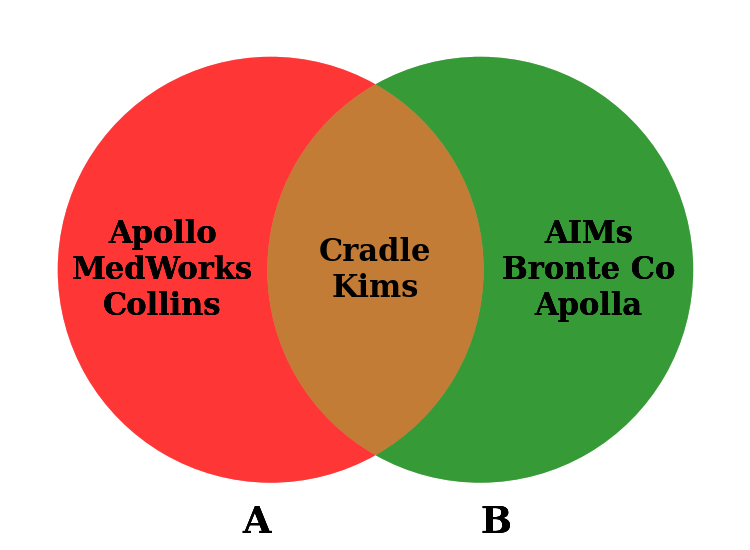

In [1234]:
# a potential good way to visualise the topics
import pandas as pd
from matplotlib_venn import venn2


df1 = pd.DataFrame(data={'Name': ['Apollo', 'MedWorks', 'Cradle', 'Kims', 'Collins']})
df2 = pd.DataFrame(data={'Name': ['Kims', 'AIMs', 'Apolla', 'Bronte Co', 'Cradle']})
df3 = pd.DataFrame(data={'Name': ['Mums', 'Dads', 'Collins', 'Bronte Co', 'Apolla']})


set1 = set(df1['Name'])
set2 = set(df2['Name'])
set3 = set(df3['Name'])

venn = venn2([set1, set2])
venn.get_label_by_id('100').set_text('\n'.join(map(str,set1-set2)))
venn.get_label_by_id('110').set_text('\n'.join(map(str,set1&set2)))
venn.get_label_by_id('010').set_text('\n'.join(map(str,set2-set1)))

plt.show()

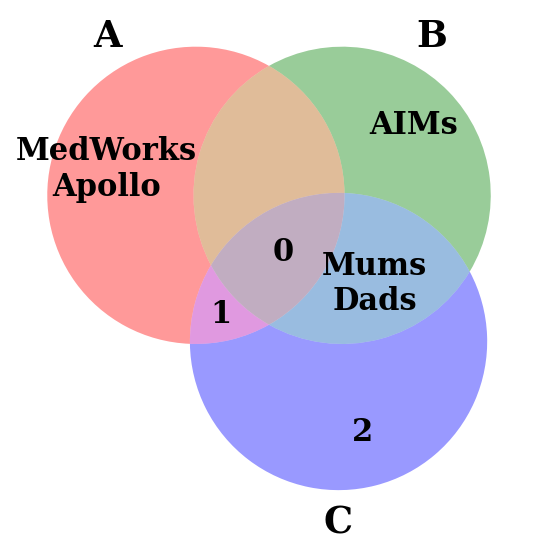

In [1240]:
from matplotlib_venn import venn3

venn = venn3([set1, set2, set3])
venn.get_label_by_id('100').set_text('\n'.join(map(str,set1-set2-set3)))
venn.get_label_by_id('110').set_text('\n'.join(map(str,set1&set2&set3)))
venn.get_label_by_id('010').set_text('\n'.join(map(str,set2-set1-set3)))
venn.get_label_by_id('011').set_text('\n'.join(map(str,set3-set1-set2)))

plt.show()

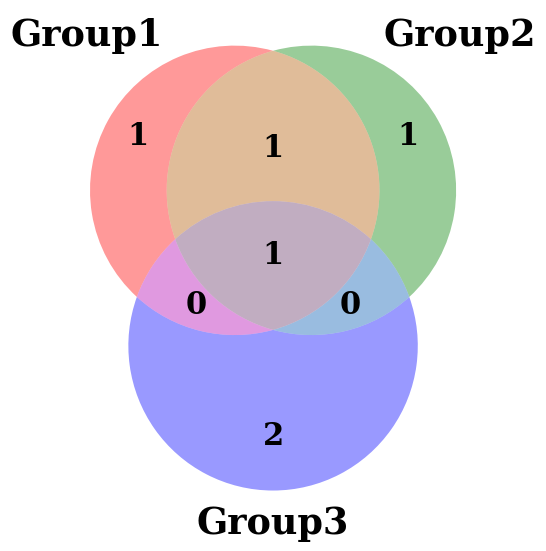

In [1241]:
import matplotlib.pyplot as plt
from matplotlib_venn import venn3

set1 = set(['A', 'B', 'C'])
set2 = set(['A', 'B', 'D'])
set3 = set(['A', 'E', 'F'])

venn3([set1, set2, set3], ('Group1', 'Group2', 'Group3'))

plt.show()

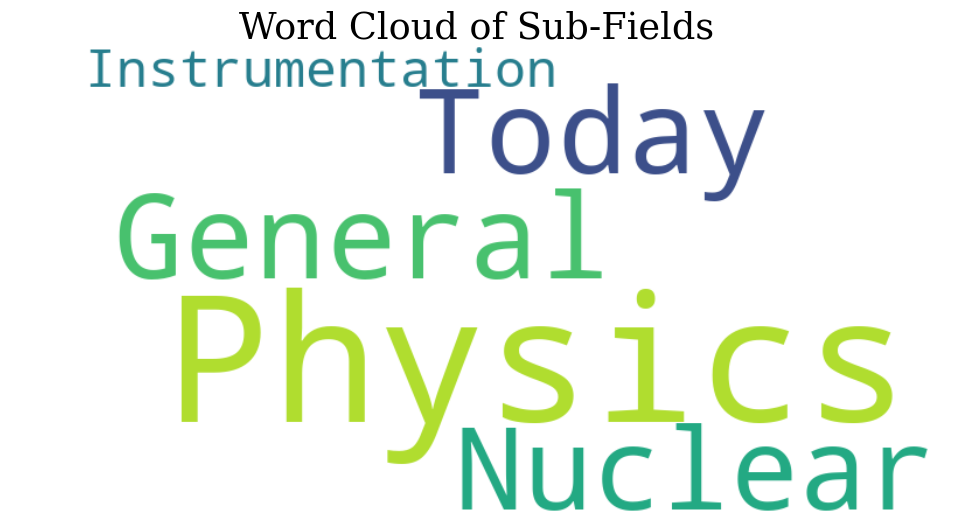

In [1248]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

topics = [
    "Physics Today and General Physics",
    "Nuclear Physics and Instrumentation"
]

# Create a string containing all topics
text = ' '.join(topics)

# Generate a word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Display the word cloud using matplotlib
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Sub-Fields')
plt.show()


In [1319]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_topic_weights(data):
    # Extract topics and weights for each row
    topics_data = data.apply(lambda x: pd.Series(x.split(' + ')))


    num_rows = len(topics_data)
    fig, axes = plt.subplots(num_rows, 1, figsize=(10, 4 * num_rows), sharex=False)

    for i, row in enumerate(topics_data.index):
        ax = axes[i] if num_rows > 1 else axes
        row_data = topics_data.loc[row].apply(lambda x: pd.Series(x.strip().split('*')))
        topics = row_data[1].apply(lambda x: x.strip('"'))
        weights = row_data[0].astype(float)
        #ax.set_xticklabels(topics, rotation=45, ha='right')

        ax.bar(topics, weights)
        ax.set_title(f'Topic {row}')
        ax.set_ylabel('Weight')
        ax.tick_params(axis='x', which='major', labelrotation=20, labelsize=12)

    plt.tight_layout()
    plt.show()


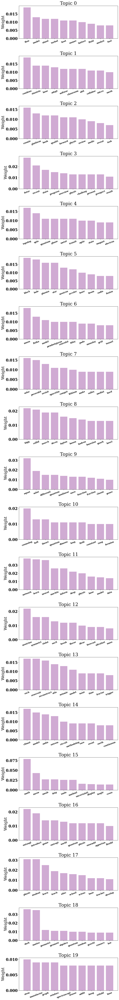

In [1320]:
plot_topic_weights(topics_tfidf_title.title_topic_words)